In [1]:
import sys
import torch
import torchvision
import detectron2
import fvcore
import iopath
import omegaconf
import hydra
import matplotlib
import numpy

# Helper to get version safely
def get_version(pkg_name, module=None):
    try:
        # Try module.__version__ first
        if module is not None and hasattr(module, "__version__"):
            return module.__version__
        # Use importlib.metadata (Python ≥3.8)
        from importlib.metadata import version
        return version(pkg_name)
    except ImportError:
        import pkg_resources
        return pkg_resources.get_distribution(pkg_name).version
    except Exception:
        return "unknown"

print("Python version:", sys.version)
print("Torch version:", get_version("torch", torch))
print("Torchvision version:", get_version("torchvision", torchvision))
print("Detectron2 version:", get_version("detectron2", detectron2))
print("fvcore version:", get_version("fvcore", fvcore))
print("iopath version:", get_version("iopath", iopath))
print("yacs version:", get_version("yacs"))
print("omegaconf version:", get_version("omegaconf", omegaconf))
print("hydra-core version:", get_version("hydra-core", hydra))
print("matplotlib version:", get_version("matplotlib", matplotlib))
print("pycocotools version:", get_version("pycocotools"))
print("NumPy version:", get_version("numpy"))

import sys
print(sys.executable)

# Should output:
"""
/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Python version: 3.9.25 (main, Nov  3 2025, 22:29:32) 
[Clang 20.1.8 ]
Torch version: 1.12.1
Torchvision version: 0.13.1
Detectron2 version: 0.6
fvcore version: 0.1.5.post20221221
iopath version: 0.1.9
yacs version: 0.1.8
omegaconf version: 2.3.0
hydra-core version: 1.3.2
matplotlib version: 3.9.4
pycocotools version: 2.0.11
NumPy version: 1.23.5
/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/bin/python
"""

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Python version: 3.9.25 (main, Nov  3 2025, 22:29:32) 
[Clang 20.1.8 ]
Torch version: 1.12.1
Torchvision version: 0.13.1
Detectron2 version: 0.6
fvcore version: 0.1.5.post20221221
iopath version: 0.1.9
yacs version: 0.1.8
omegaconf version: 2.3.0
hydra-core version: 1.3.2
matplotlib version: 3.9.4
pycocotools version: 2.0.11
NumPy version: 1.23.5
/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/bin/python


'\n/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html\n  from .autonotebook import tqdm as notebook_tqdm\nPython version: 3.9.25 (main, Nov  3 2025, 22:29:32) \n[Clang 20.1.8 ]\nTorch version: 1.12.1\nTorchvision version: 0.13.1\nDetectron2 version: 0.6\nfvcore version: 0.1.5.post20221221\niopath version: 0.1.9\nyacs version: 0.1.8\nomegaconf version: 2.3.0\nhydra-core version: 1.3.2\nmatplotlib version: 3.9.4\npycocotools version: 2.0.11\nNumPy version: 1.23.5\n/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/bin/python\n'

In [24]:
# -----------------------------
# Minimal Detectron2 Diagnostic Test (no grayscale, no class-agnostic heads)
# -----------------------------

import torch
import torchvision
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model
from detectron2.structures import Instances
from detectron2.config import CfgNode as CN

import cv2
import numpy

# -----------------------------
# Build model from config
# -----------------------------
cfg = get_cfg()
# cfg.MODEL.BACKBONE.CONVNEXT = CN()
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = ""
# cfg.merge_from_file("/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/config.yaml")
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/model_final.pth"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.DEVICE = "cpu"  # use CPU for this test

print("Building model...")
model = build_model(cfg)
print("Model built successfully.")

# Load weights
print("Loading weights...")
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
print("Weights loaded successfully.")

# -----------------------------
# Forward pass with dummy image
# -----------------------------
# Create a dummy image (3×H×W)
H, W = 512, 512
# dummy_tensor = torch.rand(3, H, W)
dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png')

# Convert BGR -> RGB
dummy_tensor = cv2.cvtColor(dummy_tensor, cv2.COLOR_BGR2RGB)

# Convert H x W x C -> C x H x W
dummy_tensor = dummy_tensor.transpose(2, 0, 1)  # shape: C x H x W

# Optional: convert to float32 (Detectron2 usually expects float32)
dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))

# Detectron2 expects a list of dicts with key "image"
dummy_input = [{"image": dummy_tensor}]

# Set model to eval mode
model.eval()

with torch.no_grad():
    outputs = model(dummy_input)

# Inspect outputs
# outputs is a list of dicts
print("Number of output dicts:", len(outputs))
print("Output keys for first image:", outputs[0].keys())

# Access instances
if "instances" in outputs[0]:
    instances = outputs[0]["instances"]
    print("Number of detected instances:", len(instances))
    if len(instances) > 0:
        print("Sample instance fields:", instances[0].get_fields().keys())
        print("Sample boxes:", instances[0].pred_boxes.tensor)
        print("Sample scores:", instances[0].scores)
        if hasattr(instances[0], "pred_masks"):
            print("Sample mask shape:", instances[0].pred_masks.shape)

Building model...
Model built successfully.
Loading weights...
[07/09 15:32:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...
Weights loaded successfully.
Number of output dicts: 1
Output keys for first image: dict_keys(['instances'])
Number of detected instances: 12
Sample instance fields: dict_keys(['pred_boxes', 'scores', 'pred_classes', 'pred_masks'])
Sample boxes: tensor([[241.9714, 342.8889, 266.9267, 371.2154]])
Sample scores: tensor([0.8313])
Sample mask shape: torch.Size([1, 512, 512])


In [25]:
# Minimal transfer Mask-RCNN code w grayscale and num_classes = COCO_NUM_CLASSES = 80 (not class-agnostic)
# Run cell to register microscopy datasets first

import torch
import torchvision
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model
from detectron2.structures import Instances
from detectron2.config import CfgNode as CN

import cv2
import numpy as np

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

PIXEL_MEAN = np.mean([103.530, 116.280, 123.675])
# PIXEL_STD = np.mean([57.375, 57.120, 58.395])
PIXEL_STD = [1.0]  # Mask-RCNN default cfg STD values
cfg.MODEL.PIXEL_MEAN = [PIXEL_MEAN]
cfg.MODEL.PIXEL_STD = [PIXEL_STD]
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic.pth"
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic_grayscale.pth"
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_grayscale.pth"
cfg.MODEL.DEVICE = "cpu"  # use CPU for this test
cfg.MODEL.INPUT_FORMAT = "L"
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]

print("Building model...")
model = build_model(cfg)
print("Model built successfully.")

# Load weights
print("Loading weights...")
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
print("Weights loaded successfully.")

# -----------------------------
# Forward pass with dummy image
# -----------------------------
# Create a dummy image (3×H×W)
H, W = 512, 512
# dummy_tensor = torch.rand(3, H, W)

# Uncomment below for color
# dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png')

# # Convert BGR -> RGB
# dummy_tensor = cv2.cvtColor(dummy_tensor, cv2.COLOR_BGR2RGB)

# # Convert H x W x C -> C x H x W
# dummy_tensor = dummy_tensor.transpose(2, 0, 1)  # shape: C x H x W

# # Optional: convert to float32 (Detectron2 usually expects float32)
# dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))

# Grayscale

dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png', cv2.IMREAD_GRAYSCALE)

print(dummy_tensor.shape)
dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))
print(dummy_tensor.shape)

# Detectron2 expects a list of dicts with key "image"
dummy_input = [{"image": dummy_tensor}]

# Set model to eval mode
model.eval()
model.float()

with torch.no_grad():
    outputs = model(dummy_input)

# Inspect outputs
# outputs is a list of dicts
print("Number of output dicts:", len(outputs))
print("Output keys for first image:", outputs[0].keys())

# Access instances
if "instances" in outputs[0]:
    instances = outputs[0]["instances"]
    print("Number of detected instances:", len(instances))
    if len(instances) > 0:
        print("Sample instance fields:", instances[0].get_fields().keys())
        print("Sample boxes:", instances[0].pred_boxes.tensor)
        print("Sample scores:", instances[0].scores)
        if hasattr(instances[0], "pred_masks"):
            print("Sample mask shape:", instances[0].pred_masks.shape)

Building model...
Model built successfully.
Loading weights...
[07/09 15:32:18 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_grayscale.pth ...
Weights loaded successfully.
(512, 512)
torch.Size([512, 512])
Number of output dicts: 1
Output keys for first image: dict_keys(['instances'])
Number of detected instances: 10
Sample instance fields: dict_keys(['pred_boxes', 'scores', 'pred_classes', 'pred_masks'])
Sample boxes: tensor([[242.6881, 343.4935, 267.8611, 370.8456]])
Sample scores: tensor([0.5177])
Sample mask shape: torch.Size([1, 512, 512])


In [101]:
# Minimal transfer Mask-RCNN code class agnostic test (no grayscale), NUM_CLASSES = COCO_NUM_CLASSES = 80
# Run cell to register microscopy datasets first

import torch
import torchvision
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model
from detectron2.structures import Instances
from detectron2.config import CfgNode as CN

import cv2
import numpy as np

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

# cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675]
# cfg.MODEL.PIXEL_STD = [57.375, 57.120, 58.395]
print(f"cfg.MODEL.PIXEL_MEAN: {cfg.MODEL.PIXEL_MEAN}")
print(f"cfg.MODEL.PIXEL_STD: {cfg.MODEL.PIXEL_STD}")
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic.pth"
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic.pth"
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/model_final.pth"
cfg.MODEL.DEVICE = "cpu"  # use CPU for this test
# cfg.DATASETS.TRAIN = ("microscopy_train",)
# cfg.DATASETS.TEST = ("microscopy_val",)
# cfg.MODEL.INPUT_FORMAT = "L"
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]

cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

print("Building model...")
model = build_model(cfg)
print("Model built successfully.")

# Load weights
print("Loading weights...")
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
print("Weights loaded successfully.")

# -----------------------------
# Forward pass with dummy image
# -----------------------------
# Create a dummy image (3×H×W)
H, W = 512, 512
dummy_tensor = torch.rand(3, H, W)

# Uncomment below for color
# dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png')
dummy_tensor = cv2.imread('/Users/ethancotta/Downloads/cat.png')

# Convert BGR -> RGB
# dummy_tensor = cv2.cvtColor(dummy_tensor, cv2.COLOR_BGR2RGB)

# Convert H x W x C -> C x H x W
dummy_tensor = dummy_tensor.transpose(2, 0, 1)  # shape: C x H x W

# Optional: convert to float32 (Detectron2 usually expects float32)
dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))

# Grayscale

# dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png', cv2.IMREAD_GRAYSCALE)

# print(dummy_tensor.shape)
# dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))
# print(dummy_tensor.shape)

# Detectron2 expects a list of dicts with key "image"
dummy_input = [{"image": dummy_tensor}]

# Set model to eval mode
model.eval()
model.float()

with torch.no_grad():
    outputs = model(dummy_input)

# Inspect outputs
# outputs is a list of dicts
print("Number of output dicts:", len(outputs))
print("Output keys for first image:", outputs[0].keys())

# Access instances
if "instances" in outputs[0]:
    instances = outputs[0]["instances"]
    print("Number of detected instances:", len(instances))
    if len(instances) > 0:
        print("Sample instance fields:", instances[0].get_fields().keys())
        print("Sample boxes:", instances[0].pred_boxes.tensor)
        print("Sample scores:", instances[0].scores)
        if hasattr(instances[0], "pred_masks"):
            print("Sample mask shape:", instances[0].pred_masks.shape)

cfg.MODEL.PIXEL_MEAN: [103.53, 116.28, 123.675]
cfg.MODEL.PIXEL_STD: [1.0, 1.0, 1.0]
Building model...
Model built successfully.
Loading weights...
[07/14 11:54:30 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic.pth ...
Weights loaded successfully.
Number of output dicts: 1
Output keys for first image: dict_keys(['instances'])
Number of detected instances: 1
Sample instance fields: dict_keys(['pred_boxes', 'scores', 'pred_classes', 'pred_masks'])
Sample boxes: tensor([[135.5601,  77.4286, 358.1352, 440.0708]])
Sample scores: tensor([0.9395])
Sample mask shape: torch.Size([1, 512, 512])


In [20]:
# Minimal transfer Mask-RCNN code class agnostic and grayscale
# Run cell to register microscopy datasets first

import torch
import torchvision
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model
from detectron2.structures import Instances
from detectron2.config import CfgNode as CN

import cv2
import numpy as np

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

PIXEL_MEAN = np.mean([103.530, 116.280, 123.675])
# PIXEL_STD = np.mean([57.375, 57.120, 58.395])
PIXEL_STD = 1.0
cfg.MODEL.PIXEL_MEAN = [PIXEL_MEAN]
cfg.MODEL.PIXEL_STD = [PIXEL_STD]
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic.pth"
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_grayscale_class_agnostic.pth"
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/model_final.pth"
cfg.MODEL.DEVICE = "cpu"  # use CPU for this test
cfg.MODEL.INPUT_FORMAT = "L"
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]

cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

print("Building model...")
model = build_model(cfg)
print("Model built successfully.")

# Load weights
print("Loading weights...")
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
print("Weights loaded successfully.")

# -----------------------------
# Forward pass with dummy image
# -----------------------------
# Create a dummy image (3×H×W)
# H, W = 512, 512
# dummy_tensor = torch.rand(3, H, W)

# # Uncomment below for color
# dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png')

# # Convert BGR -> RGB
# dummy_tensor = cv2.cvtColor(dummy_tensor, cv2.COLOR_BGR2RGB)

# # Convert H x W x C -> C x H x W
# dummy_tensor = dummy_tensor.transpose(2, 0, 1)  # shape: C x H x W

# # Optional: convert to float32 (Detectron2 usually expects float32)
# dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))

# Grayscale

# dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png', cv2.IMREAD_GRAYSCALE)
dummy_tensor = cv2.imread('/Users/ethancotta/Downloads/cat.png', cv2.IMREAD_GRAYSCALE)

print(dummy_tensor.shape)
dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))
print(dummy_tensor.shape)

# Detectron2 expects a list of dicts with key "image"
dummy_input = [{"image": dummy_tensor}]

# Set model to eval mode
model.eval()
model.float()

with torch.no_grad():
    outputs = model(dummy_input)

# Inspect outputs
# outputs is a list of dicts
print("Number of output dicts:", len(outputs))
print("Output keys for first image:", outputs[0].keys())

# Access instances
if "instances" in outputs[0]:
    instances = outputs[0]["instances"]
    print("Number of detected instances:", len(instances))
    if len(instances) > 0:
        print("Sample instance fields:", instances[0].get_fields().keys())
        print("Sample boxes:", instances[0].pred_boxes.tensor)
        print("Sample scores:", instances[0].scores)
        if hasattr(instances[0], "pred_masks"):
            print("Sample mask shape:", instances[0].pred_masks.shape)

Building model...
Model built successfully.
Loading weights...
[07/14 10:14:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_grayscale_class_agnostic.pth ...
Weights loaded successfully.
(512, 512)
torch.Size([512, 512])
Number of output dicts: 1
Output keys for first image: dict_keys(['instances'])
Number of detected instances: 1
Sample instance fields: dict_keys(['pred_boxes', 'scores', 'pred_classes', 'pred_masks'])
Sample boxes: tensor([[144.0845,  62.2720, 361.8607, 429.8730]])
Sample scores: tensor([0.9653])
Sample mask shape: torch.Size([1, 512, 512])


In [106]:
# Minimal transfer Mask-RCNN code (convnextv1) class agnostic and grayscale
# Run cell to register microscopy datasets first, and also register ConvNeXtV1 backbone

import torch
import torchvision
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model
from detectron2.structures import Instances
from detectron2.config import CfgNode as CN

import cv2
import numpy as np

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

PIXEL_MEAN = np.mean([103.530, 116.280, 123.675])
PIXEL_STD = np.mean([57.375, 57.120, 58.395])
cfg.MODEL.PIXEL_MEAN = [PIXEL_MEAN]
cfg.MODEL.PIXEL_STD = [PIXEL_STD]
# cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675] # BGR
# cfg.MODEL.PIXEL_STD = [57.375, 57.120, 58.395] # BGR
# cfg.MODEL.PIXEL_MEAN = [123.675, 116.280, 103.530] # RGB - MMDetection pretrained compatible
# cfg.MODEL.PIXEL_STD = [58.395, 57.120, 57.375] # RGB - MMDetection pretrained compatible
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_class_agnostic.pth"
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_coco.pth"
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_coco.pth"
# Note, for some reason the class agnostic mask does not do well on large cat images. However it is fine for microscopy
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_agnostic_coco.pth"
# cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_coco.pth"
cfg.MODEL.DEVICE = "cpu"  # use CPU for this test
cfg.MODEL.INPUT_FORMAT = "L"

cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

if "CONVNEXT" not in cfg.MODEL.BACKBONE:
    cfg.MODEL.BACKBONE.CONVNEXT = CN()
# Now, using ConvNeXtV2_custom - this is where backbone autoencoder pretrained weights should be loaded in
# Don't forget to convert the FCMAE weights into Mask-RCNN compatible weights first using an above script
# cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
cfg.MODEL.BACKBONE.NAME = "build_convnextv1_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto_custom"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_tiny_custom"
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv1_tiny"
cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = ""  # Not loading in backbone weights
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]
cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 4, 1.0 / 8, 1.0 / 16, 1.0 / 32]


print("Building model...")
model = build_model(cfg)
print("Model built successfully.")

# Load weights
print("Loading weights...")
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
print("Weights loaded successfully.")

# -----------------------------
# Forward pass with dummy image
# -----------------------------
# Create a dummy image (3×H×W)
# H, W = 512, 512
# dummy_tensor = torch.rand(3, H, W)

# # Uncomment below for color
# dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png')

# # Convert BGR -> RGB
# dummy_tensor = cv2.cvtColor(dummy_tensor, cv2.COLOR_BGR2RGB)

# # Convert H x W x C -> C x H x W
# dummy_tensor = dummy_tensor.transpose(2, 0, 1)  # shape: C x H x W

# # Optional: convert to float32 (Detectron2 usually expects float32)
# dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))

# Grayscale
dummy_tensor = cv2.imread('/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png', cv2.IMREAD_GRAYSCALE)
# dummy_tensor = cv2.imread('/Users/ethancotta/Downloads/cat.png', cv2.IMREAD_GRAYSCALE)

# Color
# dummy_tensor = cv2.imread('/Users/ethancotta/Downloads/cat.png')
# dummy_tensor = cv2.cvtColor(dummy_tensor, cv2.COLOR_BGR2RGB)
# dummy_tensor = dummy_tensor.transpose((2, 0, 1))

print(dummy_tensor.shape)
print(dummy_tensor.dtype)
print(np.max(dummy_tensor))
print(np.min(dummy_tensor))
dummy_tensor = torch.from_numpy(dummy_tensor.astype("float32"))
print(dummy_tensor.shape)

# Detectron2 expects a list of dicts with key "image"
dummy_input = [{"image": dummy_tensor}]

# Set model to eval mode
model.eval()
model.float()

with torch.no_grad():
    outputs = model(dummy_input)

# Inspect outputs
# outputs is a list of dicts
print("Number of output dicts:", len(outputs))
print("Output keys for first image:", outputs[0].keys())

# Access instances
if "instances" in outputs[0]:
    instances = outputs[0]["instances"]
    print("Number of detected instances:", len(instances))
    if len(instances) > 0:
        print("Sample instance fields:", instances[0].get_fields().keys())
        print("Sample boxes:", instances[0].pred_boxes.tensor)
        print("Sample scores:", instances[0].scores)
        if hasattr(instances[0], "pred_masks"):
            print("Sample mask shape:", instances[0].pred_masks.shape)

Building model...
Model built successfully.
Loading weights...
[07/14 11:58:51 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_coco.pth ...
Weights loaded successfully.
(512, 512)
uint8
255
7
torch.Size([512, 512])
Number of output dicts: 1
Output keys for first image: dict_keys(['instances'])
Number of detected instances: 100
Sample instance fields: dict_keys(['pred_boxes', 'scores', 'pred_classes', 'pred_masks'])
Sample boxes: tensor([[254.0752, 273.4498, 264.2408, 282.7410]])
Sample scores: tensor([0.9855])
Sample mask shape: torch.Size([1, 512, 512])


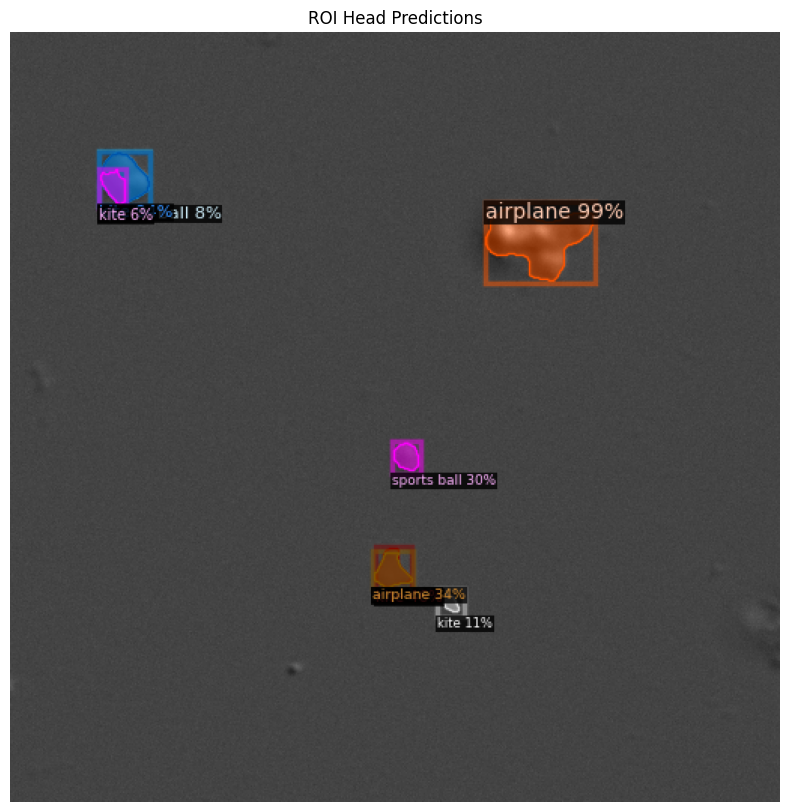

In [105]:
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

GRAYSCALE = True

# Visualize dummy results
if not GRAYSCALE:
    rgb_img = dummy_tensor.permute(1, 2, 0).numpy()
else:
    rgb_img = cv2.cvtColor(dummy_tensor.numpy(), cv2.COLOR_GRAY2RGB)
# rgb_img = cv2.cvtColor(dummy_tensor.numpy(), cv2.COLOR_GRAY2RGB)
v = Visualizer(rgb_img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0, instance_mode=ColorMode.IMAGE)
out = v.draw_instance_predictions(instances)
plt.figure(figsize=(10,10))
plt.imshow(out.get_image()[:, :, ::-1])
plt.axis("off")
plt.title("ROI Head Predictions")
plt.show()

In [1]:
# Helper script to tile dataset

from sahi.slicing import slice_coco

%cd "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/"

slice_coco(
    coco_annotation_file_path="./train/train_anns.json",
    image_dir="./train/",
    output_coco_annotation_file_name="train_anns_tiled.json",
    output_dir="./train_tiled/",
    slice_height=512,
    slice_width=512,
    overlap_height_ratio=0.25,
    overlap_width_ratio=0.25,
    min_area_ratio=0.1
)

/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  2.93it/s]


({'images': [{'height': 512,
    'width': 512,
    'id': 1,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png'},
   {'height': 512,
    'width': 512,
    'id': 2,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_384_0_896_512.png'},
   {'height': 512,
    'width': 512,
    'id': 3,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_768_0_1280_512.png'},
   {'height': 512,
    'width': 512,
    'id': 4,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_1152_0_1664_512.png'},
   {'height': 512,
    'width': 512,
    'id': 5,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_1536_0_2048_512.png'},
   {'height': 512,
    'width': 512,
    'id': 6,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_0_384_512_896.png'},
   {'height': 512,
    'width': 512,
    'id': 7,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_384_384_896_896.png'},
   {'height': 512,
    'width': 512,
    'id': 8,
    'file_name': 'F0000_C0_T0001_A0001_01-T5K2S375_0_768_384_1280_8

In [ ]:
# Helper script to remove 'Copy of ' from filename in GDrive

import os
dir = 'planes/'

gen = os.walk(dir)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.jpeg' in fname and 'Copy of ' in fname:
      old_fpath = os.path.join(dpath, fname)
      new_fname = fname[8:]
      new_fpath = os.path.join(dpath, new_fname)
      os.rename(old_fpath, new_fpath)
      print("Renamed file:", old_fpath, "to:", new_fpath)

In [ ]:
# Helper script to save color images as black and white images

import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

!pwd

dir_in = 'planes/'
dir_out = 'planes_BW/'

gen = os.walk(dir_in)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.jpeg' in fname:
      fpath = os.path.join(dpath, fname)
      rgb_img  = cv2.imread(fpath)
      grey_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)
      new_path = os.path.join(dir_out, fname)
      cv2.imwrite(new_path, grey_img)
      print("Wrote B&W file:", new_path)

# Display one image from destination directory to confirm is grey
filename = 'Airplane001.jpeg'
fpath = os.path.join(dir_out, filename)
img = cv2.imread(fpath)
dims = img.shape
cv2_imshow(img)
print("Image dimensions:", dims)

In [ ]:
!pwd

In [ ]:
# Helper script to generate list of filepaths to zip
# to zip, can use: cat out.txt | zip -@ zipfile.zip
  # saves all files in specified folder/subfolder

import os

firstField = 100
lastField = 199
base_dir = '/scratch/groups/kornberg/beelaj/20240204_perfusion166/slice/'
prefix = "F"
postfix = "_C0_T0001_A0001_01-T5K2S375.tif"

imgs_zip = []
for i in range(firstField, lastField+1):
  num = "ERROR"
  if i < 1e1:
    num = "000" + str(i)
  elif i < 1e2:
    num = "00" + str(i)
  elif i < 1e3:
    num = "0" + str(i)
  elif i < 1e4:
    num = str(i)
  else:
    print("ERROR, field index outside of expected bounds.")

  fname = prefix + num + postfix
  filepath = os.path.join(base_dir, fname)
  imgs_zip.append(filepath + '\n')

fobj = open('./list_imgs_zip.txt', 'w')
fobj.writelines(imgs_zip)
fobj.close()

fobj = open('./list_imgs_zip.txt', 'r')
file_list = fobj.read()
print("Wrote to file list_imgs_zip.txt; contents:\n")
print(file_list)
fobj.close()

In [ ]:
# Convert datatype of directory of existing images

import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

dir_in = './scaled_imgs/'
dir_out = './scaled_imgs/' # if dir_out = dir_in, then modifying files in place
test_filename = 'F0000_C0_T0001_A0001_01-T5K2S375.tif'

gen = os.walk(dir_in)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.tif' in fname:
      fpath = os.path.join(dpath, fname)
      orig_img  = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
      print("Type of pixel values before changing datatype:", type(orig_img[0][0]))
      dims = orig_img.shape
      print("Image dimensions:", dims)
      print("Min pixel value before conversion:", np.min(orig_img))
      print("Max pixel value before conversion:", np.max(orig_img))
      converted_img = orig_img.astype('uint8')
      print("Type of pixel values after changing datatype:", type(converted_img[0][0]))
      print("Min pixel value after conversion:", np.min(converted_img))
      print("Max pixel value after conversion:", np.max(converted_img))
      new_path = os.path.join(dir_out, fname)
      cv2.imwrite(new_path, converted_img)
      print("Wrote converted img:", new_path, '\n')


# Display one image from destination directory
fpath = os.path.join(dir_out, test_filename)
old_fpath = os.path.join(dir_in, test_filename)
img = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
old_img = cv2.imread(old_fpath, flags=cv2.IMREAD_ANYDEPTH)
dims = img.shape
cv2_imshow(img)
print("Test image dimensions:", dims)
print("Test image pixel data type:", type(img[0][0]))
print("Below, old image before conversion:")
cv2_imshow(old_img)

In [5]:
# Custom dataset for fcmae/fcvmae
# No labels - just for autoencoder training
# Expects only images for autoencoder training to be in image folder
# Credit to Max for already organizing a folder of 100 png fields
# When using this class, make sure to use resize transform to 2048x2048 <- ?

import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from PIL import Image
import os

class MicroscopyDataset(Dataset):
    def __init__(self, images_path, transform=None):
        self.images_path = images_path
        image_paths = []
        for entry in os.listdir(images_path):
          if os.path.isfile(entry):
            file_path = os.path.join(images_path, entry)
            image_paths.append(file_path)

        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = Image.open(image_path)
        # grayscale_transform = transforms.Grayscale()
        # grayscale_image = grayscale_transform(image)
        if self.transform:
            # grayscale_image = self.transform(grayscale_image)
            image = self.transform(image)
        # return grayscale_image
        return image

In [ ]:
# See autoencoder repo on Sherlock for code to calculate mean and std of a (batched) dataset

In [6]:
# Here, just examining state_dict keys
# Before running this cell, upload convnextv2_base_1k_224_fcmae.pt to contents folder
import torch
import os

chkpt = torch.load('/Users/ethancotta/Desktop/AI/fields_resurrected/convnextv2_tiny_1k_224_fcmae.pt')
chkpt_model_weights = chkpt['model']
for key in chkpt_model_weights:
  print(key)

downsample_layers.0.0.bias
downsample_layers.0.0.weight
downsample_layers.0.1.bias
downsample_layers.0.1.weight
downsample_layers.1.0.bias
downsample_layers.1.0.weight
downsample_layers.1.1.bias
downsample_layers.1.1.weight
downsample_layers.2.0.bias
downsample_layers.2.0.weight
downsample_layers.2.1.bias
downsample_layers.2.1.weight
downsample_layers.3.0.bias
downsample_layers.3.0.weight
downsample_layers.3.1.bias
downsample_layers.3.1.weight
stages.0.0.grn.beta
stages.0.0.grn.gamma
stages.0.0.dwconv.bias
stages.0.0.dwconv.weight
stages.0.0.norm.bias
stages.0.0.norm.weight
stages.0.0.pwconv1.bias
stages.0.0.pwconv1.weight
stages.0.0.pwconv2.bias
stages.0.0.pwconv2.weight
stages.0.1.grn.beta
stages.0.1.grn.gamma
stages.0.1.dwconv.bias
stages.0.1.dwconv.weight
stages.0.1.norm.bias
stages.0.1.norm.weight
stages.0.1.pwconv1.bias
stages.0.1.pwconv1.weight
stages.0.1.pwconv2.bias
stages.0.1.pwconv2.weight
stages.0.2.grn.beta
stages.0.2.grn.gamma
stages.0.2.dwconv.bias
stages.0.2.dwconv.weig

In [8]:
# fcmae_online_chkpt_to_convnextv2_backbone conversion code
import torch
# import ConvNeXtV2
from collections import OrderedDict
import math

# load ConvNeXt V2 atto
# load ConvNeXt V2 femto
# chkpt_path = './convnextv2_femto_1k_224_fcmae.pt'
# chkpt_path = './trained_model_fcmae_customdata_multigpu_ddp.pth'
# chkpt_path = './convnextv2_base_1k_224_fcmae.pt'
# chkpt_path = './convnextv2_femto_1k_224_fcmae.pt'
chkpt_path = "/Users/ethancotta/Desktop/AI/fields_resurrected/convnextv2_tiny_1k_224_fcmae.pt"

# Note: Model currently does not have head weights.
# model = ConvNeXtV2.convnextv2_femto(in_chans=3)
# model = convnextv2_femto(in_chans=1)
# model = convnextv2_base(in_chans=1)
model = convnextv2_tiny_custom(in_chans=1)

GRAYSCALE = True

checkpoint = torch.load(chkpt_path, map_location='cpu')
print("Loaded chkpt from:", chkpt_path)

chkpt_model = checkpoint['model']
state_dict = model.state_dict()


print("Before deletion of head params from chkpt.")
for k in ['head.weight', 'head.bias']:
    if k in chkpt_model and chkpt_model[k].shape != state_dict[k].shape:
        print(f"Removing key {k} from pretrained checkpoint")
        del chkpt_model[k]
print("After deletion of head params from chkpt.")

# remove decoder weights
print("Before deletion of decoder weights from chkpt.")
chkpt_model_keys = list(chkpt_model.keys())
for k in chkpt_model_keys:
    if 'decoder' in k or 'mask_token' in k or \
       'proj' in k or 'pred' in k:
        print(f"Removing key {k} from pretrained checkpoint")
        del chkpt_model[k]
print("After deletion of decoder weights from chkpt.")

# remap_checkpoint_keys()
def remap_checkpoint_keys(ckpt):
    new_ckpt = OrderedDict()
    for k, v in ckpt.items():
        if k.startswith('encoder'):
            k = '.'.join(k.split('.')[1:]) # remove encoder in the name
        if k.endswith('kernel'):
            k = '.'.join(k.split('.')[:-1]) # remove kernel in the name
            new_k = k + '.weight'
            if len(v.shape) == 3: # reshape standard convolution
                kv, in_dim, out_dim = v.shape
                ks = int(math.sqrt(kv))
                new_ckpt[new_k] = v.permute(2, 1, 0).\
                    reshape(out_dim, in_dim, ks, ks).transpose(3, 2)
            elif len(v.shape) == 2: # reshape depthwise convolution
                kv, dim = v.shape
                ks = int(math.sqrt(kv))
                new_ckpt[new_k] = v.permute(1, 0).\
                    reshape(dim, 1, ks, ks).transpose(3, 2)
            continue
        elif 'ln' in k or 'linear' in k:
            k = k.split('.')
            k.pop(-2) # remove ln and linear in the name
            new_k = '.'.join(k)
        else:
            new_k = k
        
        new_ckpt[new_k] = v

    # reshape grn affine parameters and biases
    for k, v in new_ckpt.items():
        if k.endswith('bias') and len(v.shape) != 1:
            new_ckpt[k] = v.reshape(-1)
        elif 'grn' in k:
            new_ckpt[k] = v.unsqueeze(0).unsqueeze(1)

    # Apply grayscaling
    for k, v in new_ckpt.items():
        if GRAYSCALE and "downsample_layers.0.0.weight" in k:
            # Original shape: [64, 3, 7, 7] (Out_channels, In_channels, H, W)
            # Average across the 3 input channels (dim=1) to compress to [64, 1, 7, 7]
            new_ckpt[k] = v.sum(dim=1, keepdim=True)
            print("Input conv weights shape:", new_ckpt[k].shape)
    
    return new_ckpt

print("Before remap_checkpoint_keys().")
chkpt_model = remap_checkpoint_keys(chkpt_model)
print("After remap_checkpoint_keys().")

def load_state_dict(model, state_dict, prefix='', ignore_missing="relative_position_index"):
    missing_keys = []
    unexpected_keys = []
    error_msgs = []
    # copy state_dict so _load_from_state_dict can modify it
    metadata = getattr(state_dict, '_metadata', None)
    state_dict = state_dict.copy()
    if metadata is not None:
        state_dict._metadata = metadata

    def load(module, prefix=''):
        local_metadata = {} if metadata is None else metadata.get(
            prefix[:-1], {})
        module._load_from_state_dict(
            state_dict, prefix, local_metadata, True, missing_keys, unexpected_keys, error_msgs)
        for name, child in module._modules.items():
            if child is not None:
                load(child, prefix + name + '.')

    load(model, prefix=prefix)

    warn_missing_keys = []
    ignore_missing_keys = []
    for key in missing_keys:
        keep_flag = True
        for ignore_key in ignore_missing.split('|'):
            if ignore_key in key:
                keep_flag = False
                break
        if keep_flag:
            warn_missing_keys.append(key)
        else:
            ignore_missing_keys.append(key)

    missing_keys = warn_missing_keys

    if len(missing_keys) > 0:
        print("Weights of {} not initialized from pretrained model: {}".format(
            model.__class__.__name__, missing_keys))
    if len(unexpected_keys) > 0:
        print("Weights from pretrained model not used in {}: {}".format(
            model.__class__.__name__, unexpected_keys))
    if len(ignore_missing_keys) > 0:
        print("Ignored weights of {} not initialized from pretrained model: {}".format(
            model.__class__.__name__, ignore_missing_keys))
    if len(error_msgs) > 0:
        print('\n'.join(error_msgs))

print("Before load_state_dict.")
load_state_dict(model, chkpt_model)
print("Successfully loaded state dict. Finished.")

# trunc_normal_(model.head.weight, std=2e-5)
# torch.nn.init.constant_(model.head.bias, 0.)

# to initialize Detectron2 backbone from fcmae weights
# save_file = "backbone_weights.pth"
save_file = "/Users/ethancotta/Desktop/AI/fields_resurrected/convnextv2_tiny_encoder_imagenet.pth"  # online weights to backbone
torch.save(model.state_dict(), save_file)
print("Saved model to convnextv2_tiny_encoder_imagenet.pth. You can now load this file into Detectron2 or SSL.")


Loaded chkpt from: /Users/ethancotta/Desktop/AI/fields_resurrected/convnextv2_tiny_1k_224_fcmae.pt
Before deletion of head params from chkpt.
After deletion of head params from chkpt.
Before deletion of decoder weights from chkpt.
After deletion of decoder weights from chkpt.
Before remap_checkpoint_keys().
Input conv weights shape: torch.Size([96, 1, 4, 4])
After remap_checkpoint_keys().
Before load_state_dict.
Weights of ConvNeXtV2 not initialized from pretrained model: ['downsample_layers.3.2.weight', 'downsample_layers.3.2.bias', 'stages.0.0.gamma', 'stages.0.1.gamma', 'stages.0.2.gamma', 'stages.1.0.gamma', 'stages.1.1.gamma', 'stages.1.2.gamma', 'stages.2.0.gamma', 'stages.2.1.gamma', 'stages.2.2.gamma', 'stages.2.3.gamma', 'stages.2.4.gamma', 'stages.2.5.gamma', 'stages.2.6.gamma', 'stages.2.7.gamma', 'stages.2.8.gamma', 'stages.3.0.gamma', 'stages.3.1.gamma', 'stages.3.2.gamma']
Weights from pretrained model not used in ConvNeXtV2: ['downsample_layers.3.1.bias', 'downsample_lay

In [10]:
# fcmae checkpoint encoder extractor (fcmae SSL -> backbone)

# fcmae_online_chkpt_to_convnextv2_backbone conversion code
import torch
# import ConvNeXtV2
from collections import OrderedDict
import math

# load ConvNeXt V2 atto
# load ConvNeXt V2 femto
# chkpt_path = './convnextv2_femto_1k_224_fcmae.pt'
# chkpt_path = './trained_model_fcmae_customdata_multigpu_ddp.pth'
# chkpt_path = './convnextv2_base_1k_224_fcmae.pt'
# chkpt_path = './convnextv2_femto_1k_224_fcmae.pt'
# chkpt_path = "/Users/ethancotta/Desktop/AI/fields_resurrected/convnextv2_tiny_1k_224_fcmae.pt"
chkpt_path = "/Users/ethancotta/Desktop/AI/fields_resurrected/output/convnextv2_tiny_custom/imagenet_pretrained/epoch50_imagenet_pretrained.pth"

# Note: Model currently does not have head weights.
# model = ConvNeXtV2.convnextv2_femto(in_chans=3)
# model = convnextv2_femto(in_chans=1)
# model = convnextv2_base(in_chans=1)
# model = convnextv2_tiny_custom(in_chans=1)
model = convnextv2_tiny(in_chans=1)

GRAYSCALE = True

checkpoint = torch.load(chkpt_path, map_location='cpu')
print("Loaded chkpt from:", chkpt_path)

chkpt_model = checkpoint['model']
state_dict = model.state_dict()


print("Before deletion of head params from chkpt.")
for k in ['head.weight', 'head.bias']:
    if k in chkpt_model and chkpt_model[k].shape != state_dict[k].shape:
        print(f"Removing key {k} from pretrained checkpoint")
        del chkpt_model[k]
print("After deletion of head params from chkpt.")

# remove decoder weights
print("Before deletion of decoder weights from chkpt.")
chkpt_model_keys = list(chkpt_model.keys())
for k in chkpt_model_keys:
    if 'decoder' in k or 'mask_token' in k or \
       'proj' in k or 'pred' in k:
        print(f"Removing key {k} from pretrained checkpoint")
        del chkpt_model[k]
print("After deletion of decoder weights from chkpt.")

# remap_checkpoint_keys()
def remap_checkpoint_keys(ckpt):
    new_ckpt = OrderedDict()
    for k, v in ckpt.items():
        new_k = k
        if k.startswith('encoder'):
            k = '.'.join(k.split('.')[1:]) # remove encoder in the name
            new_k = k
        new_ckpt[new_k] = v
    
    return new_ckpt

print("Before remap_checkpoint_keys().")
chkpt_model = remap_checkpoint_keys(chkpt_model)
print("After remap_checkpoint_keys().")

def load_state_dict(model, state_dict, prefix='', ignore_missing="relative_position_index"):
    missing_keys = []
    unexpected_keys = []
    error_msgs = []
    # copy state_dict so _load_from_state_dict can modify it
    metadata = getattr(state_dict, '_metadata', None)
    state_dict = state_dict.copy()
    if metadata is not None:
        state_dict._metadata = metadata

    def load(module, prefix=''):
        local_metadata = {} if metadata is None else metadata.get(
            prefix[:-1], {})
        module._load_from_state_dict(
            state_dict, prefix, local_metadata, True, missing_keys, unexpected_keys, error_msgs)
        for name, child in module._modules.items():
            if child is not None:
                load(child, prefix + name + '.')

    load(model, prefix=prefix)

    warn_missing_keys = []
    ignore_missing_keys = []
    for key in missing_keys:
        keep_flag = True
        for ignore_key in ignore_missing.split('|'):
            if ignore_key in key:
                keep_flag = False
                break
        if keep_flag:
            warn_missing_keys.append(key)
        else:
            ignore_missing_keys.append(key)

    missing_keys = warn_missing_keys

    if len(missing_keys) > 0:
        print("Weights of {} not initialized from pretrained model: {}".format(
            model.__class__.__name__, missing_keys))
    if len(unexpected_keys) > 0:
        print("Weights from pretrained model not used in {}: {}".format(
            model.__class__.__name__, unexpected_keys))
    if len(ignore_missing_keys) > 0:
        print("Ignored weights of {} not initialized from pretrained model: {}".format(
            model.__class__.__name__, ignore_missing_keys))
    if len(error_msgs) > 0:
        print('\n'.join(error_msgs))

print("Before load_state_dict.")
load_state_dict(model, chkpt_model)
print("Successfully loaded state dict. Finished.")

# trunc_normal_(model.head.weight, std=2e-5)
# torch.nn.init.constant_(model.head.bias, 0.)

# to initialize Detectron2 backbone from fcmae weights
# save_file = "backbone_weights.pth"
# save_file = "/Users/ethancotta/Desktop/AI/fields_resurrected/convnextv2_tiny_encoder_imagenet.pth"  # online weights to backbone
save_file = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv2_ssl.pth"
torch.save(model.state_dict(), save_file)
print("Saved model to convnextv2_ssl.pth. You can now load this file into Detectron2 or SSL.")


Loaded chkpt from: /Users/ethancotta/Desktop/AI/fields_resurrected/output/convnextv2_tiny_custom/imagenet_pretrained/epoch50_imagenet_pretrained.pth
Before deletion of head params from chkpt.
After deletion of head params from chkpt.
Before deletion of decoder weights from chkpt.
Removing key mask_token from pretrained checkpoint
Removing key proj.weight from pretrained checkpoint
Removing key proj.bias from pretrained checkpoint
Removing key decoder.0.dwconv.weight from pretrained checkpoint
Removing key decoder.0.dwconv.bias from pretrained checkpoint
Removing key decoder.0.norm.weight from pretrained checkpoint
Removing key decoder.0.norm.bias from pretrained checkpoint
Removing key decoder.0.pwconv1.weight from pretrained checkpoint
Removing key decoder.0.pwconv1.bias from pretrained checkpoint
Removing key decoder.0.grn.gamma from pretrained checkpoint
Removing key decoder.0.grn.beta from pretrained checkpoint
Removing key decoder.0.pwconv2.weight from pretrained checkpoint
Removi

In [ ]:
%cd drive/myDrive/Detectron2

In [ ]:
!pwd # next code segment for Detectron2 dir

In [ ]:
# Helper script to scale images in dir to 0-255, maintaining 16-bit or so resolution

import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow

!pwd

dir_in = './imgs_to_scale/'
# dir_out = './scaled_imgs/'
dir_out = './scaled_uint16_imgs/'
test_filename = 'F0000_C0_T0001_A0001_01-T5K2S375.tif'
alpha = 0
# beta = 255
beta = 2**16 - 1

gen = os.walk(dir_in)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.tif' in fname:
      fpath = os.path.join(dpath, fname)
      orig_img  = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
      print("Type of pixel values:", type(orig_img[0][0]))
      print("Min pixel value before scaling:", np.min(orig_img))
      print("Max pixel value before scaling:", np.max(orig_img))
      dims = orig_img.shape
      print("Image dimensions:", dims)
      scaled_img = cv2.normalize(orig_img, dst=None, alpha=alpha, beta=beta, norm_type=cv2.NORM_MINMAX)
      print("Min pixel value after scaling:", np.min(scaled_img))
      print("Max pixel value after scaling:", np.max(scaled_img))
      new_path = os.path.join(dir_out, fname)
      cv2.imwrite(new_path, scaled_img)
      print("Wrote scaled img:", new_path, '\n')

# Display one image from destination directory to confirm is scaled
fpath = os.path.join(dir_out, test_filename)
old_fpath = os.path.join(dir_in, test_filename)
img = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
old_img = cv2.imread(old_fpath, flags=cv2.IMREAD_ANYDEPTH)
dims = img.shape
cv2_imshow(img)
print("Test image dimensions:", dims)
print("Test image pixel data type:", type(img[0][0]))
print("Below, old image before scaling:")
cv2_imshow(old_img)

In [ ]:
# Helper script to scale pixel intensity values for single image

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

max_value = 32
scale_factor = 256/max_value
print("Using scale factor of:", scale_factor)
testimg1 = "./F0000_C0_T0001_A0001_01-T5K2S375.tif"
testimg2 = "./localFoo2.tif"

# for looking at test images
# F2008_C0_T0001_A0001_01-T5K2S375.tif
# im = cv2.imread("./localFoo.tif")
#im = cv2.imread("./F0000_C0_T0001_A0001_01-T5K2S375.tif")
im = cv2.imread(testimg1, flags=cv2.IMREAD_ANYDEPTH) # now can read in 16-bit image
dims = im.shape
print("Type of var im:", type(im))
#print("Type of pixel values:", type(im[0][0][0])) # no longer works when anydepth flag set
print("Type of pixel values:", type(im[0][0]))
print("Min pixel value before scaling:", np.min(im))
print("Max pixel value before scaling:", np.max(im))
print("Image dimensions:", dims)
# im = im * scale_factor
im = cv2.normalize(im, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX) # linear scaling
print("Min pixel value after scaling:", np.min(im))
print("Max pixel value after scaling:", np.max(im))
cv2_imshow(im)

# for looking at test images
# F2008_C0_T0000_A0000_00-T5K2.tif
im = cv2.imread("./localFoo2.tif")
dims = im.shape
print("Type of var im:", type(im))
print("Type of pixel values:", type(im[0][0][0]))
print("Min pixel value before scaling:", np.min(im))
print("Max pixel value before scaling:", np.max(im))
print("Image dimensions:", dims)
im = im * scale_factor
print("Min pixel value after scaling:", np.min(im))
print("Max pixel value after scaling:", np.max(im))
cv2_imshow(im)

In [ ]:
!pwd

In [ ]:
# Helper script to change file type from tiff to jpg, credit Maximilian

import os
import glob
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Define the directories

input_dir = './scaled_uint8_imgs'
output_dir = './scaled_uint8_imgs_jpg'

# Make sure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Get all the .tif files in the input directory
files = glob.glob(os.path.join(input_dir, '*.tif'))

# Loop over the files

for file in files:
    # Open the image and convert it to a numpy array
    img = np.array(Image.open(file))
    # Define the output file name
    base = os.path.basename(file)
    name = os.path.splitext(base)[0]
    print("File:", name)
    output_file = os.path.join(output_dir, f'{name}.jpg')
    # Save the image
    plt.imsave(output_file, img, cmap='gray')


In [6]:
%cd "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit"

/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit


/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Image dimensions: (512, 512, 3)


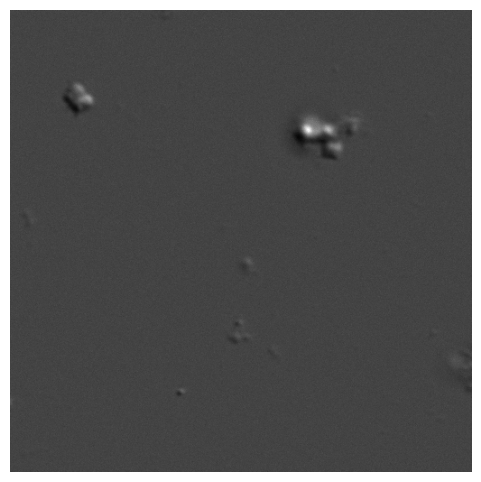

In [7]:
import cv2
# from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Just for seeing what resized fields look like

im = cv2.imread("./train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png")
#im = cv2.imread("./train/F0000_C0_T0001_A0001_01-T5K2S375.png", cv2.IMREAD_GRAYSCALE)
#im = cv2.imread("./microscopy_great/train/F00.tif")
#im = cv2.imread("./planes/train/Airplane001.jpeg")
#im = cv2.imread("./airplanes/train/Airplane001.jpeg")
#im = cv2.imread("./planes_BW/train/Airplane001.jpeg")
#im = cv2.resize(im, (1000,1000))
dims = im.shape
print("Image dimensions:", dims)
# cv2_imshow(im)

plt.figure(figsize=(6,6))
plt.imshow(im, cmap='gray')  # already 3-channel RGB
plt.axis('off')
plt.show()

In [5]:
import torch
print(torch.__version__)
!gcc --version
!nvcc --version
# !nvidia-smi # see cuda version here when running on GPU

2.10.0
^C
zsh:1: command not found: nvcc


In [8]:
%cd "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2"
# %cd detectron2
# should be /content/drive/MyDrive/Detectron2/detectron2

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2


/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
# import modules - source, Colab installation instructions
# Note: visual logging unavailable on Sherlock due to nature of remote connection

!pwd
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger # import error; resolved simply by restarting runtime
setup_logger()

# import some common libraries
import numpy as np
import torch
import os, json, cv2, random
# from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2


/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2/detectron2/model_zoo/model_zoo.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


In [10]:
%cd ../
# Should now be in Detectron2 folder

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work


In [9]:
!pwd

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


In [126]:
# setup model configuration, import weights from url, run eval
# this doesn't work
# AttributeError: 'NoneType' object has no attribute 'shape'
# nvm, suddenly seems to work; maybe it was directory change that did it, unsure

# ignore incorrect class name "person" - dataset metadata set later on

cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # set threshold for this model - before 0.6
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
#im = cv2.imread('./microscopy_great/train/F00.tif')
#im = cv2.imread('./planes/train/Airplane001.jpeg')
#im = cv2.imread('./airplanes/train/Airplane001.jpeg')
#im = cv2.imread("./microscopy_new/train/F0000_C0_T0001_A0001_01-T5K2S375.jpg")
im = cv2.imread("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/F0000_C0_T0001_A0001_01-T5K2S375.png")
# Note: B&W img has slightly reduced confidence, i.e. jet engines have 98% and 92%,
  # while have 99% and 97% with same model and same RGB img
#im = cv2.imread('./planes_BW/val/Airplane024.jpeg')
cfg.MODEL.DEVICE='cpu'
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

print("Number of classes:", cfg.MODEL.ROI_HEADS.NUM_CLASSES)

# print output

print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)


[ WARN:0@20740.674] global loadsave.cpp:278 findDecoder imread_('/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/F0000_C0_T0001_A0001_01-T5K2S375.png'): can't open/read file: check file path/integrity


[07/07 15:13:40 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


AttributeError: 'NoneType' object has no attribute 'shape'

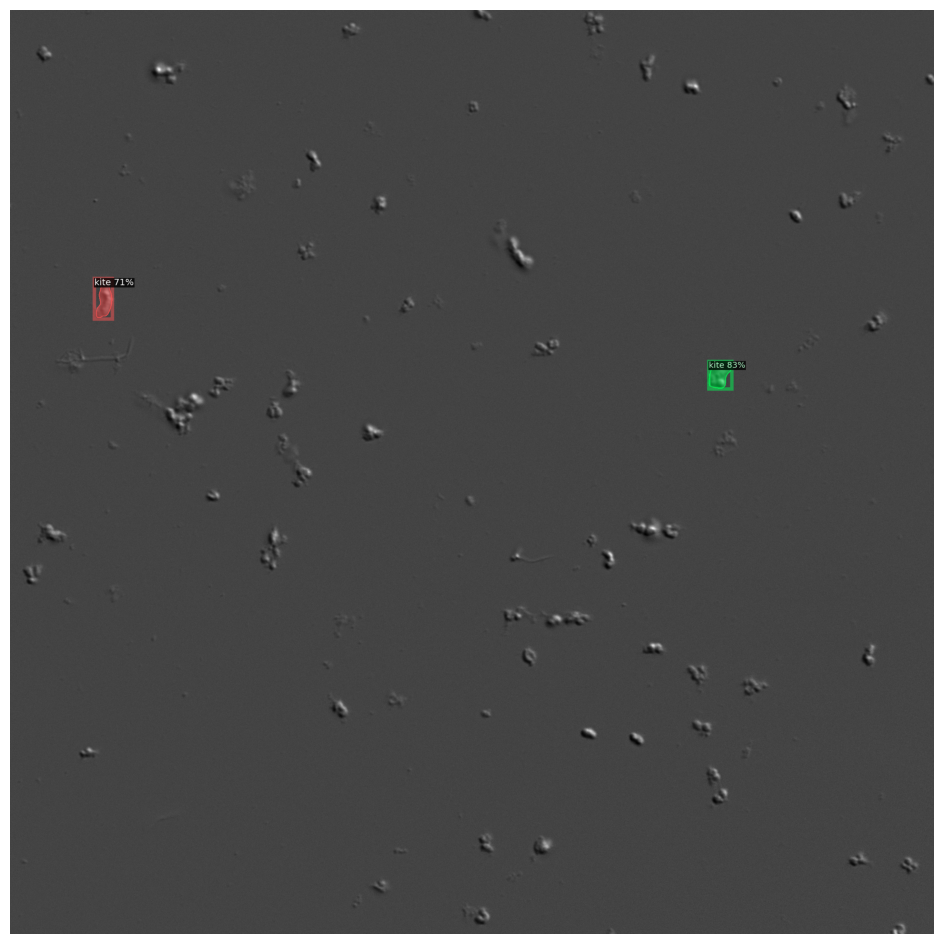

In [6]:
# visualize that output
scale = 1.0 # before 0.4
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=scale)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2_imshow(out.get_image()[:, :, ::-1])

plt.figure(figsize=(12,12))
plt.imshow(out.get_image()[:,:,::-1])  # already 3-channel RGB
plt.axis('off')
plt.show()

In [ ]:
%cd detectron2/

In [ ]:
# skip this for now - explicitly using DefaultTrainer instead in a later cell

# training
# should be in directory: /content/drive/MyDrive/Detectron2/detectron2/

# %cd tools/
# ./train_net.py --num-gpus 1 \
#    --config-file ../configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml

# want 1 gpu for now, not 2+
# %cd tools/
!python3 ./train_net.py \
  --config-file ../configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml \
  --num-gpus 1 SOLVER.IMS_PER_BATCH 2 SOLVER.BASE_LR 0.0025

In [3]:
!pwd

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2


In [ ]:
%cd ../
# should go into Detectron2 folder

In [9]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Remove old registration
if "microscopy_train" in DatasetCatalog.list():
    DatasetCatalog.remove("microscopy_train")
if "microscopy_val" in DatasetCatalog.list():
    DatasetCatalog.remove("microscopy_val")

if "microscopy_train" in MetadataCatalog.list():
    MetadataCatalog.remove("microscopy_train")
if "microscopy_val" in MetadataCatalog.list():
    MetadataCatalog.remove("microscopy_val")

In [3]:
from detectron2.data.datasets import register_coco_instances
# register_coco_instances("microscopy_train", {}, "microscopy/train/train_anns.json", "microscopy/train/")
# register_coco_instances("microscopy_val", {}, "microscopy/val/val_anns.json", "microscopy/val/")
# register_coco_instances("microscopy_train", {}, "microscopy_great/train/train_anns.json", "microscopy_great/train/")
# register_coco_instances("microscopy_val", {}, "microscopy_great/val/val_anns.json", "microscopy_great/val/")
# register_coco_instances("microscopy_test", {}, "microscopy_great/test/test_anns.json", "microscopy_great/test/")
# register_coco_instances("planes_train", {}, "planes/train/planes_F01_F20.json", "planes/train/")
# register_coco_instances("planes_val", {}, "planes/val/planes_F21_F25.json", "planes/val/")
# register_coco_instances("airplanes_train", {}, "airplanes/train/airplanes_F01_F20.json", "airplanes/train/")
# register_coco_instances("airplanes_val", {}, "airplanes/val/airplanes_F21_F25.json", "airplanes/val/")
#register_coco_instances("planes_BW_train", {}, "planes_BW/train/planes_BW_F01_F20.json", "planes_BW/train/")
#register_coco_instances("planes_BW_val", {}, "planes_BW/val/planes_BW_F21_F25.json", "planes_BW/val/")
#register_coco_instances("microscopy_train", {}, "microscopy_new/train/train_anns_F0000_F0044.json", "microscopy_new/train/")
#register_coco_instances("microscopy_val", {}, "microscopy_new/val/val_anns_F0045_F0049.json", "microscopy_new/val/")
#register_coco_instances("microscopy_train", {}, "microscopy_100/train/train_anns_F0000_F0089.json", "microscopy_100/train/")
#register_coco_instances("microscopy_val", {}, "microscopy_100/val/val_anns_F0090_F0099.json", "microscopy_100/val/")
#register_coco_instances("microscopy_train", {}, "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/train_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/")
#register_coco_instances("microscopy_val", {}, "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/val_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/")
#register_coco_instances("microscopy_train", {}, "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/train_anns_tiled.json", "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/")
#register_coco_instances("microscopy_val", {}, "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/val/val_anns.json", "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/val/")
register_coco_instances("microscopy_train", {}, "/Users/ethancotta/Desktop/AI/microscopy_overfit/train_tiled/train_anns_tiled.json", "/Users/ethancotta/Desktop/AI/microscopy_overfit/train_tiled/")
register_coco_instances("microscopy_val", {}, "/Users/ethancotta/Desktop/AI/microscopy_overfit/val/val_anns.json", "/Users/ethancotta/Desktop/AI/microscopy_overfit/val/")

In [4]:
# cd as needed into Detectron2 folder but not repo
!pwd

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2


[07/07 15:12:29 d2.data.datasets.coco]: Loaded 50 images in COCO format from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/train_anns_tiled.json


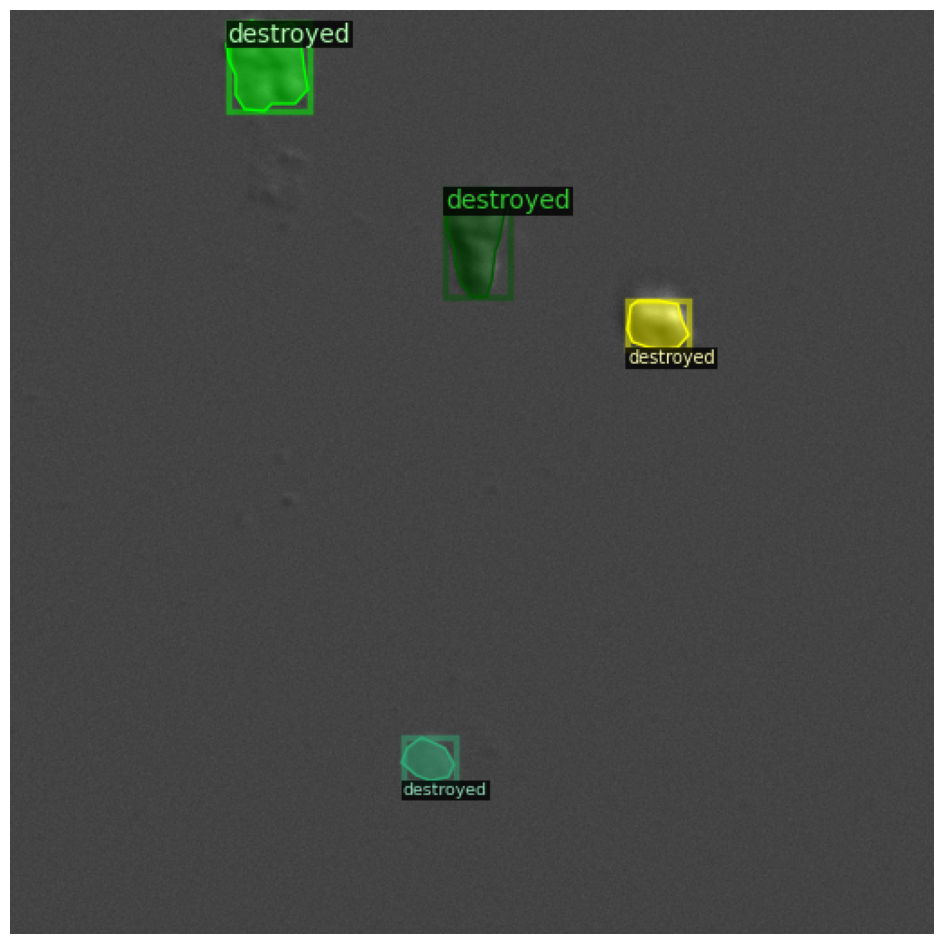

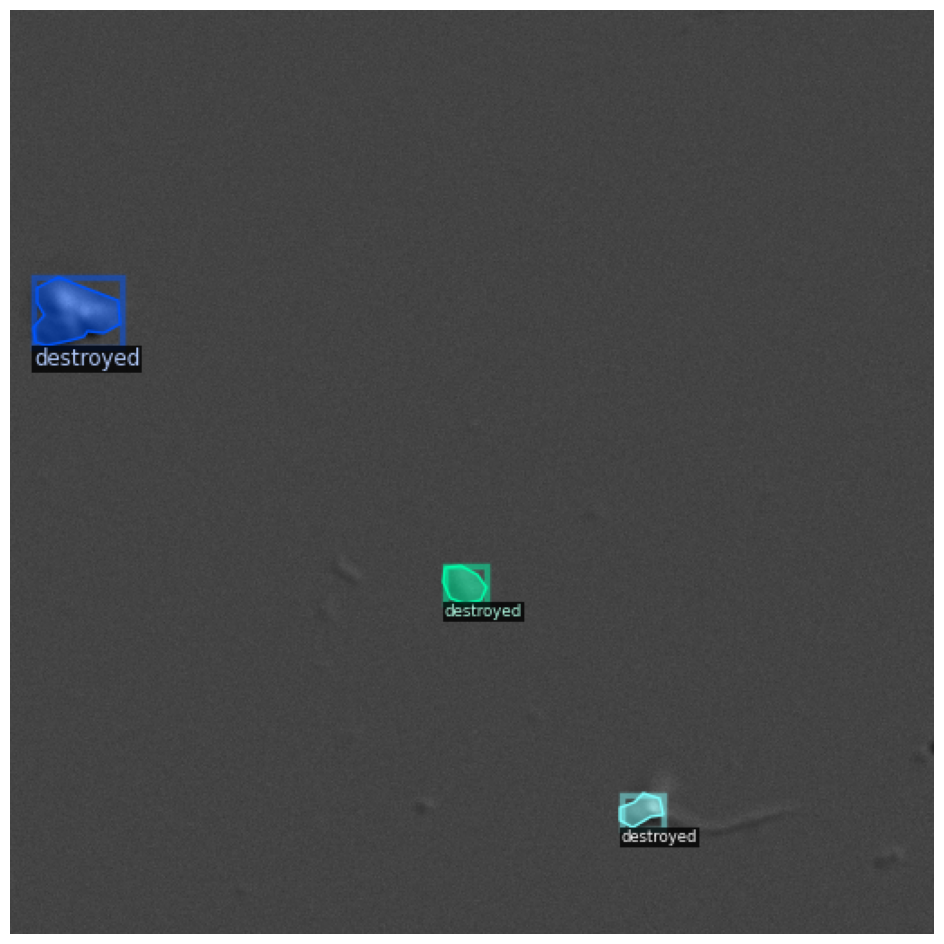

In [125]:
from detectron2.data.datasets import load_coco_json
# visualize training annotations and check data setup

# number of images from training dataset want to display
# n = 3
n = 2

#dataset_dicts = load_coco_json("microscopy/train/train_anns.json", "microscopy/train/", dataset_name = "microscopy_train")
#dataset_dicts = load_coco_json("microscopy_great/train/train_anns.json", "microscopy_great/train/", dataset_name = "microscopy_train")
#dataset_dicts = load_coco_json("planes/train/planes_F01_F20.json", "planes/train/", dataset_name = "planes_train")
#dataset_dicts = load_coco_json("airplanes/train/airplanes_F01_F20.json", "airplanes/train/", dataset_name = "airplanes_train")
#dataset_dicts = load_coco_json("planes_BW/train/planes_BW_F01_F20.json", "planes_BW/train/", dataset_name = "planes_BW_train")
#dataset_dicts = load_coco_json("microscopy_new/train/train_anns_F0000_F0044.json", "microscopy_new/train/", dataset_name = "microscopy_train")
#dataset_dicts = load_coco_json("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/train_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/", dataset_name = "microscopy_train")
dataset_dicts = load_coco_json("/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/train_anns_tiled.json", "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/", dataset_name = "microscopy_train")
for d in random.sample(dataset_dicts, n):
    img = cv2.imread(d["file_name"])
    #visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.5)
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0)
    out = visualizer.draw_dataset_dict(d)
    
    plt.figure(figsize=(12,12))
    plt.imshow(out.get_image()[:,:,::-1])  # already 3-channel RGB
    plt.axis('off')
    plt.show()

In [63]:
# Get mean and std of training set

import numpy as np
import cv2
import os

image_dir = "/Users/ethancotta/Desktop/AI/microscopy_overfit/train_tiled/"

means = []
stds = []

for fname in os.listdir(image_dir):
    if not fname.lower().endswith((".png")):
        continue  # skip non-image files
    img = cv2.imread(os.path.join(image_dir, fname))
    img = img.astype(np.float32)

    means.append(img.mean(axis=(0,1)))
    stds.append(img.std(axis=(0,1)))

mean = np.mean(means, axis=0)
std = np.mean(stds, axis=0)

print("MEAN:", mean)
print("STD:", std)

MEAN: [64.35089 64.35089 64.35089]
STD: [5.0135074 5.0135074 5.0135074]


In [11]:
# Set up checkpoint from FCMAE (dense convolution not sparse) to backbone

save_path = "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_custom.pth"
state_dict = torch.load("/Users/ethancotta/Desktop/AI/fields_resurrected/output/convnextv2_tiny_custom/imagenet_pretrained/epoch50_imagenet_pretrained.pth", map_location=torch.device('cpu'))['model']
# print(state_dict.keys())
prefix = "encoder."

new_state_dict = {}
for key, value in state_dict.items():
    index = key.find(prefix)
    if index != -1:
        new_state_dict[key[index+len(prefix):]] = state_dict[key]
    else:
        print('Not loading in key:', key)

torch.save(new_state_dict, save_path)

print('Saved fcmae->backbone weights at', save_path)

Not loading in key: mask_token
Not loading in key: proj.weight
Not loading in key: proj.bias
Not loading in key: decoder.0.dwconv.weight
Not loading in key: decoder.0.dwconv.bias
Not loading in key: decoder.0.norm.weight
Not loading in key: decoder.0.norm.bias
Not loading in key: decoder.0.pwconv1.weight
Not loading in key: decoder.0.pwconv1.bias
Not loading in key: decoder.0.grn.gamma
Not loading in key: decoder.0.grn.beta
Not loading in key: decoder.0.pwconv2.weight
Not loading in key: decoder.0.pwconv2.bias
Not loading in key: pred.weight
Not loading in key: pred.bias
Not loading in key: weighted_loss.sobel_x
Not loading in key: weighted_loss.sobel_y
Not loading in key: weighted_loss.norm_factor
Saved fcmae->backbone weights at /Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_custom.pth


In [16]:
# ConvnextV2 dilated weights to non-dilated weights

state_dict = torch.load("/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_custom.pth", map_location='cpu')
save_path = "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_tiny_ssl.pth"
new_state_dict = {k: v.clone() for k, v in state_dict.items()}

new_state_dict['downsample_layers.3.1.weight'] = new_state_dict['downsample_layers.3.2.weight']
new_state_dict['downsample_layers.3.1.bias'] = new_state_dict['downsample_layers.3.2.bias']

# Remove the old keys to clean up the 'Unexpected' log
del new_state_dict['downsample_layers.3.2.weight']
del new_state_dict['downsample_layers.3.2.bias']

torch.save(new_state_dict, save_path)

print("Saved non-dilated weights at", save_path)

Saved non-dilated weights at /Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_tiny_ssl.pth


In [4]:
# Prints all key names in checkpoint
# We find that the MMDetection convnextv2 checkpoint only has backbone weights when we're looking for full Mask R-CNN model weights

MMDetection_weights = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/MMDetection_mask_rcnn.pth"
chkpt = torch.load(MMDetection_weights)
state_dict = chkpt.get("state_dict", chkpt)
for key, value in state_dict.items():
    print(key)

backbone.downsample_layers.0.0.bias
backbone.downsample_layers.0.0.weight
backbone.downsample_layers.0.1.bias
backbone.downsample_layers.0.1.weight
backbone.downsample_layers.1.0.bias
backbone.downsample_layers.1.0.weight
backbone.downsample_layers.1.1.bias
backbone.downsample_layers.1.1.weight
backbone.downsample_layers.2.0.bias
backbone.downsample_layers.2.0.weight
backbone.downsample_layers.2.1.bias
backbone.downsample_layers.2.1.weight
backbone.downsample_layers.3.0.bias
backbone.downsample_layers.3.0.weight
backbone.downsample_layers.3.1.bias
backbone.downsample_layers.3.1.weight
backbone.stages.0.0.grn.beta
backbone.stages.0.0.grn.gamma
backbone.stages.0.0.depthwise_conv.bias
backbone.stages.0.0.depthwise_conv.weight
backbone.stages.0.0.norm.bias
backbone.stages.0.0.norm.weight
backbone.stages.0.0.pointwise_conv1.bias
backbone.stages.0.0.pointwise_conv1.weight
backbone.stages.0.0.pointwise_conv2.bias
backbone.stages.0.0.pointwise_conv2.weight
backbone.stages.0.1.grn.beta
backbone

In [6]:
# Download MMDetection weights
# Download from convnextv1 mask r-cnn chkpt

"""
MMDetection_url = "https://download.openmmlab.com/mmclassification/v0/convnext-v2/convnext-v2-base_3rdparty-fcmae_in1k_20230104-8a798eaf.pth"
chkpt = torch.hub.load_state_dict_from_url(MMDetection_url, map_location='cpu')
torch.save(chkpt, "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/MMDetection_mask_rcnn.pth")
"""

Downloading: "https://download.openmmlab.com/mmclassification/v0/convnext-v2/convnext-v2-base_3rdparty-fcmae_in1k_20230104-8a798eaf.pth" to /Users/ethancotta/.cache/torch/hub/checkpoints/convnext-v2-base_3rdparty-fcmae_in1k_20230104-8a798eaf.pth
100%|████████████████████████████████████████| 335M/335M [00:57<00:00, 6.16MB/s]


In [33]:
# Convert MMDetection Tiny ConvNeXtV1 Mask R-CNN to Detectron2 ConvNeXtV2 Mask R-CNN model weights
import torch

MMDetection_weights = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/MMDetection_mask_rcnn_convnextv1.pth"
save_path = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_coco.pth"

def convert_mmdet_to_d2(mmdet_path, output_path):
    mmdet_checkpoint = torch.load(mmdet_path, map_location="cpu")
    mmdet_state = mmdet_checkpoint.get("state_dict", mmdet_checkpoint)
    
    d2_state = {}

    for key, value in mmdet_state.items():
        old_key = key
        
        # 1. Map ConvNeXt-V2 Backbone Tensors
        if key.startswith("backbone."):
            key = key.replace("backbone.", "backbone.bottom_up.")
            key = key.replace("depthwise_conv", "dwconv")
            key = key.replace("pointwise_conv1", "pwconv1")
            key = key.replace("pointwise_conv2", "pwconv2")
            
            # if "downsample_layers.3.1" in key:  # For dilated convnext models only
            #     key = key.replace("downsample_layers.3.1", "downsample_layers.3.2")

            # GRN Broadcast Dimensions [C] -> [1, 1, 1, C]
            if ".grn." in key and (key.endswith(".beta") or key.endswith(".gamma")):
                if len(value.shape) == 1:
                    value = value.view(1, 1, 1, -1)

        # 2. Map Neck (FPN)
        elif key.startswith("neck."):
            parts = key.split(".")
            stage_idx = int(parts[2]) + 2 # lateral_convs.0 -> lateral2
            param_type = parts[-1]        # weight or bias
            
            if "lateral_convs" in parts:
                key = f"backbone.fpn_lateral{stage_idx}.{param_type}"
            elif "fpn_convs" in parts:
                key = f"backbone.fpn_output{stage_idx}.{param_type}"
                
        # 3. Map Region Proposal Network (RPN)
        elif key.startswith("rpn_head."):
            param_type = key.split(".")[-1] # weight or bias
            if "rpn_conv" in key:
                key = f"proposal_generator.rpn_head.conv.{param_type}"
            elif "rpn_cls" in key:
                key = f"proposal_generator.rpn_head.objectness_logits.{param_type}"
            elif "rpn_reg" in key:
                key = f"proposal_generator.rpn_head.anchor_deltas.{param_type}"

        # 4. Map Region of Interest (ROI) Heads
        elif key.startswith("roi_head."):
            parts = key.split(".")
            param_type = parts[-1] # weight or bias
            
            if "shared_fcs" in key:
                fc_idx = int(parts[3]) + 1 # shared_fcs.0 -> fc1
                key = f"roi_heads.box_head.fc{fc_idx}.{param_type}"
            elif "fc_cls" in key:
                key = f"roi_heads.box_predictor.cls_score.{param_type}"
            elif "fc_reg" in key:
                key = f"roi_heads.box_predictor.bbox_pred.{param_type}"
            elif "mask_head.convs" in key:
                conv_idx = int(parts[3]) + 1 # convs.0 -> mask_fcn1
                key = f"roi_heads.mask_head.mask_fcn{conv_idx}.{param_type}"
            elif "mask_head.upsample" in key:
                key = f"roi_heads.mask_head.deconv.{param_type}"
            elif "mask_head.conv_logits" in key:
                key = f"roi_heads.mask_head.predictor.{param_type}"

        print(f"Mapped: {old_key} -> {key}")
        d2_state[key] = value

    d2_checkpoint = {
        "model": d2_state,
        "matching_heuristics": True
    }

    torch.save(d2_checkpoint, output_path)
    print(f"\nSaved successfully to: {output_path}")

if __name__ == "__main__":
    convert_mmdet_to_d2(MMDetection_weights, save_path)


Mapped: backbone.downsample_layers.0.0.weight -> backbone.bottom_up.downsample_layers.0.0.weight
Mapped: backbone.downsample_layers.0.0.bias -> backbone.bottom_up.downsample_layers.0.0.bias
Mapped: backbone.downsample_layers.0.1.weight -> backbone.bottom_up.downsample_layers.0.1.weight
Mapped: backbone.downsample_layers.0.1.bias -> backbone.bottom_up.downsample_layers.0.1.bias
Mapped: backbone.downsample_layers.1.0.weight -> backbone.bottom_up.downsample_layers.1.0.weight
Mapped: backbone.downsample_layers.1.0.bias -> backbone.bottom_up.downsample_layers.1.0.bias
Mapped: backbone.downsample_layers.1.1.weight -> backbone.bottom_up.downsample_layers.1.1.weight
Mapped: backbone.downsample_layers.1.1.bias -> backbone.bottom_up.downsample_layers.1.1.bias
Mapped: backbone.downsample_layers.2.0.weight -> backbone.bottom_up.downsample_layers.2.0.weight
Mapped: backbone.downsample_layers.2.0.bias -> backbone.bottom_up.downsample_layers.2.0.bias
Mapped: backbone.downsample_layers.2.1.weight -> b

In [48]:
# Save Mask R-CNN grayscale/class-agnostic head variants to .pth with class_agnostic, grayscale, keep_classifier flags

# Uncomment MODEL_NAME corresponding to the CLASS_AGNOSTIC/GRAYSCALE/KEEP_CLASSIFIER flags you select

from detectron2.config import CfgNode as CN
from detectron2.engine import DefaultTrainer
from detectron2.checkpoint import DetectionCheckpointer
import torch
from collections import OrderedDict
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.modeling import build_model
import os
import numpy as np

OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/'
# Uncomment MODEL_NAME 

# Classifier head kept for the below
# MODEL_NAME = "mask_bbox_grayscale"
# MODEL_NAME = "mask_bbox_class_agnostic"
# MODEL_NAME = "mask_bbox_grayscale_class_agnostic_2"
# MODEL_NAME = "mask_bbox_grayscale_class_agnostic_no_fpn"
# MODEL_NAME = "convnextv2_tiny_grayscale_agnostic_coco"
# MODEL_NAME = "convnextv1_tiny_grayscale_agnostic_coco"
# MODEL_NAME = "convnextv1_tiny_grayscale_coco"
# MODEL_NAME = "convnextv1_tiny_agnostic_coco"
MODEL_NAME = "convnextv1_tiny_grayscale_agnostic_no_backbone_coco"
CLASS_AGNOSTIC = True    # Class-agnostic mask/bbox predictor heads
GRAYSCALE = True    # MMDetection model will be converted to grayscale
KEEP_CLASSIFIER = True    # Keep or throw away second stage classification head. Keep if want to have out-of-the-box COCO predictions
# Set KEEP_CLASSIFIER to False if want to have no out-of-the-box predictions but will train for better performance i.e. for non-COCO class applications
# KEEP_CLASSIFIER = True will be discarded when load into model with NUM_CLASSES != 80
KEEP_FPN = True
KEEP_BACKBONE = False

# Set up config, then without any additional training, modify weights of mask and bbox heads to average
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.DEVICE = 'cpu'
cfg.OUTPUT_DIR = OUTPUT_DIR
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Select INPUT mean/std to correspond to checkpoint
# cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675]
# cfg.MODEL.PIXEL_STD = [57.375, 57.120, 58.395]

# Load ResNet50 Default COCO Checkpoint from Detectron2 model zoo
"""
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
"""

# ConvNeXtV2 or MMDetection ConvNEXtV1

cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_coco.pth"
cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]  # If doing 3-channel input, reorder BGR -> RGB
cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]      # If doing 3-channel input, reorder BGR -> RGB
print(cfg.MODEL.PIXEL_MEAN, cfg.MODEL.PIXEL_STD)
if "CONVNEXT" not in cfg.MODEL.BACKBONE:
    cfg.MODEL.BACKBONE.CONVNEXT = CN()
# Now, using ConvNeXtV2_custom - this is where backbone autoencoder pretrained weights should be loaded in
# Don't forget to convert the FCMAE weights into Mask-RCNN compatible weights first using an above script
# cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
cfg.MODEL.BACKBONE.NAME = "build_convnextv1_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto_custom"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_tiny_custom"
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv1_tiny"
cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = ""  # Not loading in backbone weights


"""
# cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "fusedres4res5"]
cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "res4", "res5"]
cfg.MODEL.FPN.OUT_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.RPN.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.ROI_HEADS.IN_FEATURES = ["p2", "p3", "p4", "p5"]
# cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p4"
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128]]
"""
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]
cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 4, 1.0 / 8, 1.0 / 16, 1.0 / 32]

# For grayscale and agnostic checkpoint
cfg.INPUT.FORMAT = "L"
cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

# COCO Mask R-CNN
coco_model = build_model(cfg)
coco_model.eval()
DetectionCheckpointer(coco_model).load(cfg.MODEL.WEIGHTS)
print("Loaded chkpt model")

# Extract and average heads
coco_state_dict = coco_model.state_dict()
agnostic_state_dict = OrderedDict()

for key, param in coco_state_dict.items():
    # Handle backbone
    if "backbone.bottom_up" in key:
        if KEEP_BACKBONE:
            agnostic_state_dict[key] = param
        else:
            continue
    
    # Handle RGB -> grayscale input channel conversion
    if KEEP_BACKBONE and ("backbone.bottom_up.stem.conv1.weight" in key or "backbone.bottom_up.downsample_layers.0.0.weight" in key):
        if GRAYSCALE:
            # Original shape: [64, 3, 7, 7] (Out_channels, In_channels, H, W)
            # Average across the 3 input channels (dim=1) to compress to [64, 1, 7, 7]
            agnostic_state_dict[key] = param.sum(dim=1, keepdim=True)
            print("Input conv weights shape:", agnostic_state_dict[key].shape)
            continue
        else:
            agnostic_state_dict[key] = param

    # Handle FPN
    if "fpn" in key:
        if KEEP_FPN:
            agnostic_state_dict[key] = param
        continue
    
    # Handle bounding box predictor
    if "roi_heads.box_predictor" in key:
        # Ignore the classification layer (cls_score), want random initialization here
        if "cls_score" in key:
            if KEEP_CLASSIFIER:
                agnostic_state_dict[key] = param
            continue
            
        # Average the bbox regression parameters into a single class-agnostic block
        if "weight" in key and param.dim() > 1:
            if CLASS_AGNOSTIC:
                num_cls_4, feat_dim = param.shape
                num_cls = num_cls_4 // 4
                weight_reshaped = param.view(num_cls, 4, feat_dim)
                agnostic_state_dict[key] = weight_reshaped.mean(dim=0) # Shape: [4, feat_dim]
            else:
                agnostic_state_dict[key] = param
            continue
        elif "bias" in key:
            if CLASS_AGNOSTIC:
                num_cls_4 = param.shape[0]
                num_cls = num_cls_4 // 4
                bias_reshaped = param.view(num_cls, 4)
                agnostic_state_dict[key] = bias_reshaped.mean(dim=0) # Shape: [4]
            else:
                agnostic_state_dict[key] = param
            continue
    
    # Handle mask predictor
    elif "roi_heads.mask_head.predictor" in key:
        if "weight" in key or "bias" in key:
            if CLASS_AGNOSTIC:
                if "weight" in key:
                    agnostic_state_dict[key] = param.mean(dim=0, keepdim=True)
                elif "bias" in key:
                    agnostic_state_dict[key] = param.mean(dim=0, keepdim=True)
            else:
                agnostic_state_dict[key] = param
            continue
            
    # Keep backbone, FPN, RPN, and everything else exactly the same
    agnostic_state_dict[key] = param

# Class agnostic target model (#classes != 3 so does not overwrite correct class head from a different pretraining phase
# Reconfigure settings to match your downstream target training architecture
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # <-- Configured for != 3 classes. Any number other than actual number (3) will do to trigger random initialization

if GRAYSCALE:
    cfg.INPUT.FORMAT = "L"    # Grayscale input image format
    cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]
    cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]

if not KEEP_CLASSIFIER:
    pass  # No need to change anything, just set NUM_CLASSES in model you transfer weights to != 80

if CLASS_AGNOSTIC:
    cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
    cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

# Build target model architecture with (1 <- again doesn't matter as long as != 3) classification slots and class-agnostic outputs
# agnostic_model = build_model(cfg)
 
# Reload backbone weights because they are overwritten I think
"""
prefix = "backbone.bottom_up."
if cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS != "" and cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS is not None:
    convnextv2_state_dict = torch.load(cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)
    for k, v in convnextv2_state_dict.items():
        k = prefix + k
        agnostic_state_dict[k] = v
        print(f"Reloaded key {k} with convnextv2 backbone weights")
"""

# Load and save
# strict=False allows the checkpointer to smoothly handle 'cls_score' being absent 
# from the dictionary, letting it remain randomly initialized while precisely pairing 
# all averaged agnostic parameters.
# agnostic_model.load_state_dict(agnostic_state_dict, strict=False)
# print("Loaded output model")

# Save with native Detectron2 format structure wrapper
# checkpointer = DetectionCheckpointer(agnostic_model, save_dir=OUTPUT_DIR)
# checkpointer.save(MODEL_NAME)

save_dir = os.path.join(OUTPUT_DIR, MODEL_NAME+'.pth')
torch.save(agnostic_state_dict, save_dir)
print('Saved model to', save_dir)

# Assert backbone weights match convnextv2 backbone weights to ensure backbone transfer learning was successful
"""
prefix = "backbone.bottom_up."
if cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS != "" and cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS is not None:
    convnextv2_state_dict = torch.load(cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)
    for k, v in convnextv2_state_dict.items():
        k = prefix + k
        if k not in agnostic_state_dict:
            print(f"Key {k} not found in final saved model")
            continue
        if not torch.equal(v, agnostic_state_dict[k]):
            print(f"Value mismatch for key {k}")
    for k, v in agnostic_state_dict.items():
        k = k.removeprefix(prefix)
        if k not in convnextv2_state_dict:
            print(f"Key {k} not found in convnextv2 source model")
"""

# Debug - print all key names
for k, v in agnostic_state_dict.items():
    print(k)

print("Done")

[114.495] [57.63]
[07/14 21:04:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_coco.pth ...
Loaded chkpt model
Saved model to /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth
backbone.fpn_lateral2.weight
backbone.fpn_lateral2.bias
backbone.fpn_output2.weight
backbone.fpn_output2.bias
backbone.fpn_lateral3.weight
backbone.fpn_lateral3.bias
backbone.fpn_output3.weight
backbone.fpn_output3.bias
backbone.fpn_lateral4.weight
backbone.fpn_lateral4.bias
backbone.fpn_output4.weight
backbone.fpn_output4.bias
backbone.fpn_lateral5.weight
backbone.fpn_lateral5.bias
backbone.fpn_output5.weight
backbone.fpn_output5.bias
proposal_generator.rpn_head.conv.weight
proposal_generator.rpn_head.conv.bias
proposal_generator.rpn_head.objectness_logits.weight
proposal_generator.rpn_head.objectness_logits.bias
propos

In [49]:
# convnextv2_tiny_ssl + convnextv1_tiny_grayscale_agnostic_no_backbone_coco

from detectron2.config import CfgNode as CN
from detectron2.engine import DefaultTrainer
from detectron2.checkpoint import DetectionCheckpointer
import torch
from collections import OrderedDict
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.modeling import build_model
import os
import numpy as np

OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/'
# Uncomment MODEL_NAME 

MODEL_NAME = "convnextv2_convnextv1_tiny_grayscale_agnostic_coco"

# Set up config, then without any additional training, modify weights of mask and bbox heads to average
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.DEVICE = 'cpu'
cfg.OUTPUT_DIR = OUTPUT_DIR
os.makedirs(OUTPUT_DIR, exist_ok=True)

cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth"
# cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]  # If doing 3-channel input, reorder BGR -> RGB
# cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]      # If doing 3-channel input, reorder BGR -> RGB
print(cfg.MODEL.PIXEL_MEAN, cfg.MODEL.PIXEL_STD)
if "CONVNEXT" not in cfg.MODEL.BACKBONE:
    cfg.MODEL.BACKBONE.CONVNEXT = CN()
# Now, using ConvNeXtV2_custom - this is where backbone autoencoder pretrained weights should be loaded in
# Don't forget to convert the FCMAE weights into Mask-RCNN compatible weights first using an above script
# cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto_custom"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_tiny_custom"
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_tiny"
cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_tiny_ssl.pth"


"""
# cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "fusedres4res5"]
cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "res4", "res5"]
cfg.MODEL.FPN.OUT_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.RPN.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.ROI_HEADS.IN_FEATURES = ["p2", "p3", "p4", "p5"]
# cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p4"
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128]]
"""
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]
cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 4, 1.0 / 8, 1.0 / 16, 1.0 / 32]

# Grayscale/agnostic checkpoint
cfg.INPUT.FORMAT = "L"    # Grayscale input image format
cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]
cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]

cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

# Load model from cfg.MODEL.WEIGHTS

coco_state_dict = torch.load(cfg.MODEL.WEIGHTS)
print("Loaded chkpt state_dict")
new_state_dict = {k: v.clone() for k, v in coco_state_dict.items()}

# Build target model architecture with (1 <- again doesn't matter as long as != 3) classification slots and class-agnostic outputs
new_model = build_model(cfg)
 
# Reload backbone weights because they are overwritten I think

prefix = "backbone.bottom_up."
if cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS != "" and cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS is not None:
    print("Loading convnextv2 weights...")
    convnextv2_state_dict = torch.load(cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)
    for k, v in convnextv2_state_dict.items():
        k = prefix + k
        new_state_dict[k] = v
        print(f"Reloaded key {k} with convnextv2 backbone weights")

# Load and save
new_model.load_state_dict(new_state_dict, strict=True)
print("Loaded output model")

# Save with native Detectron2 format structure wrapper
checkpointer = DetectionCheckpointer(new_model, save_dir=OUTPUT_DIR)
checkpointer.save(MODEL_NAME)

# Assert backbone weights match convnextv2 backbone weights to ensure backbone transfer learning was successful

prefix = "backbone.bottom_up."
if cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS != "" and cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS is not None:
    convnextv2_state_dict = torch.load(cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)
    for k, v in convnextv2_state_dict.items():
        k = prefix + k
        if k not in new_state_dict:
            print(f"Key {k} not found in final saved model")
            continue
        if not torch.equal(v, new_state_dict[k]):
            print(f"Value mismatch for key {k}")
    for k, v in new_state_dict.items():
        k = k.removeprefix(prefix)
        if k not in convnextv2_state_dict:
            print(f"Key {k} not found in convnextv2 source model")

print("Done")

[103.53, 116.28, 123.675] [1.0, 1.0, 1.0]
Loaded chkpt state_dict
Loading pretrained backbone weights...
(Disable this option when resuming from a checkpoint by passing None to cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)
Adapting pretrained weights from RGB → Grayscale
Missing Keys: ['downsample_layers.3.1.weight', 'downsample_layers.3.1.bias']
Unexpected Keys: ['downsample_layers.3.2.weight', 'downsample_layers.3.2.bias']
Finished loading pretrained convnextv2 backbone weights
Loading convnextv2 weights...
Reloaded key backbone.bottom_up.downsample_layers.0.0.weight with convnextv2 backbone weights
Reloaded key backbone.bottom_up.downsample_layers.0.0.bias with convnextv2 backbone weights
Reloaded key backbone.bottom_up.downsample_layers.0.1.weight with convnextv2 backbone weights
Reloaded key backbone.bottom_up.downsample_layers.0.1.bias with convnextv2 backbone weights
Reloaded key backbone.bottom_up.downsample_layers.1.0.weight with convnextv2 backbone weights
Reloaded key backbone.bottom

In [51]:
# Compare weight keys and values between two checkpoints

filepath_a = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth"
filepath_b = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv2_convnextv1_tiny_grayscale_agnostic_coco.pth"

chkpt_a = torch.load(filepath_a)
chkpt_b = torch.load(filepath_b)['model']

for k_a, v_a in chkpt_a.items():
    if k_a not in chkpt_b:
        print(f"{filepath_b} missing {k_a}")

for k_b, v_b in chkpt_b.items():
    if k_b not in chkpt_a:
        print(f"{filepath_a} missing {k_b}")
    elif not torch.equal(v_b, chkpt_a[k_b]):
        print(f"{k_b} value not equal to {k_b} value")

print("Done")

/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth missing backbone.bottom_up.downsample_layers.0.0.weight
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth missing backbone.bottom_up.downsample_layers.0.0.bias
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth missing backbone.bottom_up.downsample_layers.0.1.weight
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth missing backbone.bottom_up.downsample_layers.0.1.bias
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth missing backbone.bottom_up.downsample_layers.1.0.weight
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_no_backbone_coco.pth missing ba

In [52]:
import sys
print(sys.version)

3.9.25 (main, Nov  3 2025, 22:29:32) 
[Clang 20.1.8 ]


In [9]:
# set up config and training for baseline COCO model

from detectron2.config import CfgNode as CN

# in line trainer = DefaultTrainer(cfg), KeyError: Categories
  # will try load_coco_json() to get dictionary of anns instead of register_coco_instances

# Once when running, Cuda Side Trigger Error - disappeared when restarted runtime

cfg = get_cfg() # uncommented before
# the above line gets a default config that already has some default data augments: ResizeShortestEdge, RandomFlip(horizontal)
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# if "CONVNEXT" not in cfg.MODEL.BACKBONE:
#     cfg.MODEL.BACKBONE.CONVNEXT = CN()
# cfg.DATASETS.TRAIN = ("balloon_train",)
# cfg.DATASETS.TRAIN = ("minicoco_train",)
#cfg.DATASETS.TRAIN = ("chromosomes_train",)
#cfg.DATASETS.TEST = ("chromosomes_val",)
#cfg.DATASETS.TRAIN = ("microscopy_train",)
#cfg.DATASETS.TEST = ("microscopy_val","microscopy_test",)
#cfg.DATASETS.TRAIN = ("planes_train",)
#cfg.DATASETS.TEST = ("planes_val",)
#cfg.DATASETS.TRAIN = ("airplanes_train",)
#cfg.DATASETS.TEST = ("airplanes_val",)
#cfg.DATASETS.TRAIN = ("planes_BW_train",)
#cfg.DATASETS.TEST = ("planes_BW_val",)
cfg.DATASETS.TRAIN = ("microscopy_train",)
cfg.DATASETS.TEST = ("microscopy_val",)
# cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.NUM_WORKERS = 0  # CPU training
# uncomment later for weight transfer
# yaml file only holds model config/structure, not weights; pretrained weights loaded in by url from model zoo
# Uncomment below line for initializing other parts of Mask R-CNN for transfer learning
# To-do: rerun baseline COCO Mask-RCNN training but with mask/bbox heads transferred through class weight averaging scheme. Use above cell to get these weights
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# Should no longer initialize the backbone since using ConvNeXtV2, but should apply to other parts of Mask R-CNN
#cfg.MODEL.WEIGHTS = ""  # Random init for all untouched layers
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch200/output/model_final.pth"
# Below for comparison against convnextv2
# cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"  # Random init everything except for Resnet 50, ImageNet pretrained

# Below for mask/bbox class agnostic heads
# new, untested: initialize from class-agnostic Mask RCNN. Should load COCO class-agnostic mask and bbox head weights
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_grayscale_class_agnostic_no_fpn.pth"
cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

cfg.INPUT.MIN_SIZE_TEST = 512
cfg.INPUT.MAX_SIZE_TEST = 512
print(cfg.INPUT.MIN_SIZE_TEST)
# microscopy_overfit dataset mean and std
#cfg.MODEL.PIXEL_MEAN = [64.35089, 64.35089, 64.35089]
#cfg.MODEL.PIXEL_STD = [5.0135074, 5.0135074, 5.0135074]
# ImageNet mean and std
# cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675]
#cfg.MODEL.PIXEL_STD = [57.375, 57.120, 58.395]
#cfg.MODEL.PIXEL_STD = [1.0, 1.0, 1.0]
cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]
# cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]
cfg.MODEL.PIXEL_STD = [1.0]
print(cfg.MODEL.PIXEL_MEAN)
print(cfg.MODEL.PIXEL_STD)


# or, resume from last checkpoint (untested so far)
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_great/output/model_final.pth" # tested, works
#cfg.MODEL.WEIGHTS = "microscopy_new/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_new/custom_model/output/model_final.pth"
# or (?),
#cfg.MODEL.WEIGHTS = "microscopy_great/output/last_checkpoint" # this does not work
#cfg.MODEL.WEIGHTS = "planes_BW/output/model_final.pth"
# cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
#cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# iteration: gradient update of one batch's backprop
cfg.SOLVER.MAX_ITER = 2000 # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
# 400 typically good, but doing 500 for transfer learning here
#. if resume=True, sets total number of iters, not relative number of iters to add on top of previous training
#cfg.SOLVER.MAX_ITER = 6000
# cfg.SOLVER.MAX_ITER = 2000
# cfg.SOLVER.MAX_ITER = 800
# cfg.SOLVER.MAX_ITER = 3200
# cfg.SOLVER.MAX_ITER = 5000
# cfg.SOLVER.MAX_ITER = 7200 # use this for actual training
#cfg.SOLVER.MAX_ITER = 12000
# 128 ROIs in past not 512
# unclear what this line does - no noticeable affect on predictions?
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
# trying to balance lower number of fg region proposals by decreasing all and therefore bg region proposals
# no work, fg/bg maintains same ratio
# also, ground truth boxes, according to raw code, are always included as positive proposals
# #+/- anchors unaffected by BATCH_SIZE_PER_IMAGE, this is expected
# anchor sampling, see function subsample_labels()
  # selects all positive anchors only limited by threshold ratio of +/-, and fill remaining slots with negative anchors
# In below experimental set, no significant deviation from ~4 GB GPU RAM
# The very high ROI numbers had loss of ~0.6; lower, ~1+
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors, 7/121 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 40 # 8/248 +/- anchors, 2/38 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 10 # 2/8 fg/bg; towards iter 1000, fg wanted to rise
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 20 # 2/18 fg/bg; ~6 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # 8/248 +/- anchors; 2/510 fg/bg; loss smaller at 0.6, slower training for +; ~7:30 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/248 +/- anchors, ?-does not add up to 2048; 9/999 fg/bg, ~7:30 train
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 2048 # more appropriate maybe for more ROIs <- no, only adding neg anchors; default = 256
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/2040 +/- anchors; 2/1000 fg/bg (? does not add up to 2048)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 32 # reasoning, only ~8 pos anchors even with airplanes dataset
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32 # 8/24 +/- anchors; 2/30 fg/bg; higher loss ~1.2; fg clearly went from 1.5 to 2.5, but stagnates
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/120 +/- anchors; 2/126 fg/bg; loss 0.84; fg clearly 1.5 -> 2.5, exponential improvement
# what do #anchors do?
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/504 +/- anchors; 2/126 fg/bg; loss 0.6823; fg stagnates at 1.5 -> 2
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256 # the default
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors; 2/126 fg/bg; loss 0.72; fg stagnates at 1.5 -> 2; conflicts with top result(?)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256 # 8/120 +/- anchors; 2/254 fg/bg; loss 0.75; fg clearly 1.5 -> 2.5, exponential improvement; more violent than 128 anc/128 ROIs
# choose 128 or 256 anchors/proposals; 128 for both seems best
# now, change learning rate - want fastest increase in #fg proposals
# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# cfg.SOLVER.BASE_LR = 0.0025 # 0.00025 originally; 10x greater here
  # 8/248 +/- anchors; 3/125 fg/bg; loss 0.80
#cfg.SOLVER.BASE_LR = 0.025 # training diverged, and didn't go above 2 fg ROIs

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# Overfit training:
cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256        # 512 res training
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # 512 res training
# Below is for overfit training on 2k res images w/o tiling
# cfg.MODEL.RPN.PRE_NMS_TPOK_TRAIN = 6000
# cfg.MODEL.RPN.PRE_NMS_TOPK_TEST = 6000
# cfg.MODEL.RPN.POST_NMS_TPOK_TRAIN = 2000
# cfg.MODEL.RPN.POST_NMS_TPOK_TEST = 2000

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024

# cfg.TEST.DETECTIONS_PER_IMAGE = 200

# cfg.SOLVER.BASE_LR = 5e-6 # stable for overfit but too slow
cfg.SOLVER.BASE_LR = 1e-4
cfg.SOLVER.STEPS = []  # do not decay learning rate
#cfg.SOLVER.STEPS = [200]
#cfg.SOLVER.GAMMA = 0.1    # Default
cfg.SOLVER.WARMUP_ITERS = 0  # No warmup for overfit
cfg.SOLVER.IMS_PER_BATCH = 2 # increase batch size as training progresses; GPU RAM 11.5 GB

# Theory: during early training, none of region proposals have significant overlap with ground truth (source: Detectron2 code comment)
# cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.25 # default 0.25, max ratio of fg/bg
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrectly use num_classes+1 here.
#cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8], [16], [32], [64], [128]]# inferior to next line
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]

"""
# Now, using ConvNeXtV2_custom - this is where backbone autoencoder pretrained weights should be loaded in
# Don't forget to convert the FCMAE weights into Mask-RCNN compatible weights first using an above script
cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto"
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto_custom"
cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_custom.pth"
#cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/convnextv2_femto_1k_224_ema.pt"
#cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = ""

# The following is for 3 not 4 stage ConvNeXtV2 backbone

# cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "res4"]
cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "fusedres4res5"]
cfg.MODEL.FPN.OUT_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.RPN.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.ROI_HEADS.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p4"
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8], [16], [32], [64]]
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128]]
# cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 2, 1.0 / 4, 1.0 / 8, 1.0 / 16]
cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 4, 1.0 / 8, 1.0 / 16, 1.0 / 32]
"""
# cfg.INPUT.FORMAT = "L"  # "L" stands for 8-bit pixels, black and white (1-channel)


# For grayscale model
cfg.INPUT.FORMAT = "L"

# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # twice as fast as convnextv2_base; same mem usage
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto"
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # base -> CUDA OOM error when run trainer.train()
# When increased batch size 1 -> 2, 9.5 GB -> 10.0 GB
# Transfer learning not working, as the second stage heads' losses climb during training
cfg.MODEL.BACKBONE.FREEZE_AT = 5 # keep unfrozen when not using transfer learning; default is 2 (only stem and next stage of backbone frozen)

#cfg.OUTPUT_DIR = 'microscopy/output/'
#cfg.OUTPUT_DIR = 'microscopy_great/output/'
#cfg.OUTPUT_DIR = 'planes/output/'
#cfg.OUTPUT_DIR = 'airplanes/output/'
#cfg.OUTPUT_DIR = 'planes_BW/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/default_model/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_repo_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_fcmae_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_imagenet_pretrained/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch300/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_imagenet/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50_coco/output/'
cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_grayscale_agnostic_no_fpn_coco_pretrained/output/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

cfg.MODEL.DEVICE='cpu'

# print number of epochs
#num_imgs = 10
# images with no annotations since empty do not count (already omitted in json file)
#num_imgs = 17
#num_imgs = 20
# microscopy_new dataset
#num_imgs = 45
# microscopy_100 dataset
#num_imgs = 90
# microscopy_overfit dataset

print(cfg.MODEL.WEIGHTS)

num_imgs = 50
print("Total number of epochs set:", cfg.SOLVER.MAX_ITER * cfg.SOLVER.IMS_PER_BATCH / num_imgs)
print("Total number of images to process:", cfg.SOLVER.IMS_PER_BATCH * cfg.SOLVER.MAX_ITER)


512
[114.495]
[1.0]
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/mask_bbox_grayscale_class_agnostic_no_fpn.pth
Total number of epochs set: 80.0
Total number of images to process: 4000


In [53]:
# set up config and training for experimental ConvNeXtV2 Mask R-CNN model

from detectron2.config import CfgNode as CN

# in line trainer = DefaultTrainer(cfg), KeyError: Categories
  # will try load_coco_json() to get dictionary of anns instead of register_coco_instances

# Once when running, Cuda Side Trigger Error - disappeared when restarted runtime

cfg = get_cfg() # uncommented before
# the above line gets a default config that already has some default data augments: ResizeShortestEdge, RandomFlip(horizontal)
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
if "CONVNEXT" not in cfg.MODEL.BACKBONE:
    cfg.MODEL.BACKBONE.CONVNEXT = CN()
# cfg.DATASETS.TRAIN = ("balloon_train",)
# cfg.DATASETS.TRAIN = ("minicoco_train",)
#cfg.DATASETS.TRAIN = ("chromosomes_train",)
#cfg.DATASETS.TEST = ("chromosomes_val",)
#cfg.DATASETS.TRAIN = ("microscopy_train",)
#cfg.DATASETS.TEST = ("microscopy_val","microscopy_test",)
#cfg.DATASETS.TRAIN = ("planes_train",)
#cfg.DATASETS.TEST = ("planes_val",)
#cfg.DATASETS.TRAIN = ("airplanes_train",)
#cfg.DATASETS.TEST = ("airplanes_val",)
#cfg.DATASETS.TRAIN = ("planes_BW_train",)
#cfg.DATASETS.TEST = ("planes_BW_val",)
cfg.DATASETS.TRAIN = ("microscopy_train",)
cfg.DATASETS.TEST = ("microscopy_val",)
# cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.NUM_WORKERS = 0  # CPU training
# uncomment later for weight transfer
# yaml file only holds model config/structure, not weights; pretrained weights loaded in by url from model zoo
# Uncomment below line for initializing other parts of Mask R-CNN for transfer learning
# To-do: rerun baseline COCO Mask-RCNN training but with mask/bbox heads transferred through class weight averaging scheme. Use above cell to get these weights
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# Should no longer initialize the backbone since using ConvNeXtV2, but should apply to other parts of Mask R-CNN
#cfg.MODEL.WEIGHTS = ""  # Random init for all untouched layers
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch200/output/model_final.pth"
# Below for comparison against convnextv2
# cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"  # Random init everything except for Resnet 50, ImageNet pretrained

# Below for mask/bbox class agnostic heads
# new, untested: initialize from class-agnostic Mask RCNN. Should load COCO class-agnostic mask and bbox head weights
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv2_ssl_convnextv1_tiny_grayscale_agnostic_coco.pth"
cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

cfg.INPUT.MIN_SIZE_TEST = 512
cfg.INPUT.MAX_SIZE_TEST = 512
print(cfg.INPUT.MIN_SIZE_TEST)
# microscopy_overfit dataset mean and std
#cfg.MODEL.PIXEL_MEAN = [64.35089, 64.35089, 64.35089]
#cfg.MODEL.PIXEL_STD = [5.0135074, 5.0135074, 5.0135074]
# ImageNet mean and std
# cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675]
#cfg.MODEL.PIXEL_STD = [57.375, 57.120, 58.395]
#cfg.MODEL.PIXEL_STD = [1.0, 1.0, 1.0]
# Grayscale mean and std
cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]
cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]
print(cfg.MODEL.PIXEL_MEAN)
print(cfg.MODEL.PIXEL_STD)


# or, resume from last checkpoint (untested so far)
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_great/output/model_final.pth" # tested, works
#cfg.MODEL.WEIGHTS = "microscopy_new/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_new/custom_model/output/model_final.pth"
# or (?),
#cfg.MODEL.WEIGHTS = "microscopy_great/output/last_checkpoint" # this does not work
#cfg.MODEL.WEIGHTS = "planes_BW/output/model_final.pth"
# cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
#cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# iteration: gradient update of one batch's backprop
cfg.SOLVER.MAX_ITER = 2000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
# 400 typically good, but doing 500 for transfer learning here
#. if resume=True, sets total number of iters, not relative number of iters to add on top of previous training
#cfg.SOLVER.MAX_ITER = 6000
# cfg.SOLVER.MAX_ITER = 2000
# cfg.SOLVER.MAX_ITER = 800
# cfg.SOLVER.MAX_ITER = 3200
# cfg.SOLVER.MAX_ITER = 5000
# cfg.SOLVER.MAX_ITER = 7200 # use this for actual training
#cfg.SOLVER.MAX_ITER = 12000
# 128 ROIs in past not 512
# unclear what this line does - no noticeable affect on predictions?
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
# trying to balance lower number of fg region proposals by decreasing all and therefore bg region proposals
# no work, fg/bg maintains same ratio
# also, ground truth boxes, according to raw code, are always included as positive proposals
# #+/- anchors unaffected by BATCH_SIZE_PER_IMAGE, this is expected
# anchor sampling, see function subsample_labels()
  # selects all positive anchors only limited by threshold ratio of +/-, and fill remaining slots with negative anchors
# In below experimental set, no significant deviation from ~4 GB GPU RAM
# The very high ROI numbers had loss of ~0.6; lower, ~1+
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors, 7/121 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 40 # 8/248 +/- anchors, 2/38 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 10 # 2/8 fg/bg; towards iter 1000, fg wanted to rise
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 20 # 2/18 fg/bg; ~6 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # 8/248 +/- anchors; 2/510 fg/bg; loss smaller at 0.6, slower training for +; ~7:30 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/248 +/- anchors, ?-does not add up to 2048; 9/999 fg/bg, ~7:30 train
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 2048 # more appropriate maybe for more ROIs <- no, only adding neg anchors; default = 256
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/2040 +/- anchors; 2/1000 fg/bg (? does not add up to 2048)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 32 # reasoning, only ~8 pos anchors even with airplanes dataset
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32 # 8/24 +/- anchors; 2/30 fg/bg; higher loss ~1.2; fg clearly went from 1.5 to 2.5, but stagnates
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/120 +/- anchors; 2/126 fg/bg; loss 0.84; fg clearly 1.5 -> 2.5, exponential improvement
# what do #anchors do?
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/504 +/- anchors; 2/126 fg/bg; loss 0.6823; fg stagnates at 1.5 -> 2
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256 # the default
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors; 2/126 fg/bg; loss 0.72; fg stagnates at 1.5 -> 2; conflicts with top result(?)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256 # 8/120 +/- anchors; 2/254 fg/bg; loss 0.75; fg clearly 1.5 -> 2.5, exponential improvement; more violent than 128 anc/128 ROIs
# choose 128 or 256 anchors/proposals; 128 for both seems best
# now, change learning rate - want fastest increase in #fg proposals
# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# cfg.SOLVER.BASE_LR = 0.0025 # 0.00025 originally; 10x greater here
  # 8/248 +/- anchors; 3/125 fg/bg; loss 0.80
#cfg.SOLVER.BASE_LR = 0.025 # training diverged, and didn't go above 2 fg ROIs

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# Overfit training:
cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256        # 512 res training
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # 512 res training
# Below is for overfit training on 2k res images w/o tiling
# cfg.MODEL.RPN.PRE_NMS_TPOK_TRAIN = 6000
# cfg.MODEL.RPN.PRE_NMS_TOPK_TEST = 6000
# cfg.MODEL.RPN.POST_NMS_TPOK_TRAIN = 2000
# cfg.MODEL.RPN.POST_NMS_TPOK_TEST = 2000

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024

# cfg.TEST.DETECTIONS_PER_IMAGE = 200

# cfg.SOLVER.BASE_LR = 5e-6 # stable for overfit but too slow
cfg.SOLVER.BASE_LR = 1e-4
cfg.SOLVER.STEPS = []  # do not decay learning rate
#cfg.SOLVER.STEPS = [200]
#cfg.SOLVER.GAMMA = 0.1    # Default
cfg.SOLVER.WARMUP_ITERS = 0  # No warmup for overfit
cfg.SOLVER.IMS_PER_BATCH = 2 # increase batch size as training progresses; GPU RAM 11.5 GB

# Theory: during early training, none of region proposals have significant overlap with ground truth (source: Detectron2 code comment)
# cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.25 # default 0.25, max ratio of fg/bg
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrectly use num_classes+1 here.
#cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8], [16], [32], [64], [128]]# inferior to next line
#cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]]


# Now, using ConvNeXtV2_custom - this is where backbone autoencoder pretrained weights should be loaded in
# Don't forget to convert the FCMAE weights into Mask-RCNN compatible weights first using an above script
cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto_custom"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_tiny_custom"
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_tiny"
#cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_custom.pth"
#cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/convnextv2_femto_1k_224_ema.pt"
cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = ""

# The following is for 3 not 4 stage ConvNeXtV2 backbone
"""
# cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "res4"]
cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "fusedres4res5"]
cfg.MODEL.FPN.OUT_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.RPN.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.ROI_HEADS.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p4"
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8], [16], [32], [64]]
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128]]
# cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 2, 1.0 / 4, 1.0 / 8, 1.0 / 16]
cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 4, 1.0 / 8, 1.0 / 16, 1.0 / 32]
"""
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"
# cfg.INPUT.FORMAT = "L"  # "L" stands for 8-bit pixels, black and white (1-channel)


# For grayscale model
cfg.INPUT.FORMAT = "L"

# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # twice as fast as convnextv2_base; same mem usage
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto"
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # base -> CUDA OOM error when run trainer.train()
# When increased batch size 1 -> 2, 9.5 GB -> 10.0 GB
# Transfer learning not working, as the second stage heads' losses climb during training
cfg.MODEL.BACKBONE.FREEZE_AT = 5 # keep unfrozen when not using transfer learning; default is 2 (only stem and next stage of backbone frozen)

#cfg.OUTPUT_DIR = 'microscopy/output/'
#cfg.OUTPUT_DIR = 'microscopy_great/output/'
#cfg.OUTPUT_DIR = 'planes/output/'
#cfg.OUTPUT_DIR = 'airplanes/output/'
#cfg.OUTPUT_DIR = 'planes_BW/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/default_model/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_repo_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_fcmae_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_imagenet_pretrained/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch300/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_imagenet/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50_coco/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50_grayscale_agnostic/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_tiny_custom_ssl_imagenet_epoch50_grayscale_agnostic_convnextv1_coco/output/'
cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_convnextv1_tiny_grayscale_agnostic_coco/output/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

cfg.MODEL.DEVICE='cpu'

# print number of epochs
#num_imgs = 10
# images with no annotations since empty do not count (already omitted in json file)
#num_imgs = 17
#num_imgs = 20
# microscopy_new dataset
#num_imgs = 45
# microscopy_100 dataset
#num_imgs = 90
# microscopy_overfit dataset

print(cfg.MODEL.WEIGHTS)

num_imgs = 50
print("Total number of epochs set:", cfg.SOLVER.MAX_ITER * cfg.SOLVER.IMS_PER_BATCH / num_imgs)
print("Total number of images to process:", cfg.SOLVER.IMS_PER_BATCH * cfg.SOLVER.MAX_ITER)


512
[114.495]
[57.63]
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv2_convnextv1_tiny_grayscale_agnostic_coco.pth
Total number of epochs set: 80.0
Total number of images to process: 4000


In [116]:
# set up config and training for experimental ConvNeXtV1 Mask R-CNN model

from detectron2.config import CfgNode as CN

# in line trainer = DefaultTrainer(cfg), KeyError: Categories
  # will try load_coco_json() to get dictionary of anns instead of register_coco_instances

# Once when running, Cuda Side Trigger Error - disappeared when restarted runtime

cfg = get_cfg() # uncommented before
# the above line gets a default config that already has some default data augments: ResizeShortestEdge, RandomFlip(horizontal)
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
if "CONVNEXT" not in cfg.MODEL.BACKBONE:
    cfg.MODEL.BACKBONE.CONVNEXT = CN()
# cfg.DATASETS.TRAIN = ("balloon_train",)
# cfg.DATASETS.TRAIN = ("minicoco_train",)
#cfg.DATASETS.TRAIN = ("chromosomes_train",)
#cfg.DATASETS.TEST = ("chromosomes_val",)
#cfg.DATASETS.TRAIN = ("microscopy_train",)
#cfg.DATASETS.TEST = ("microscopy_val","microscopy_test",)
#cfg.DATASETS.TRAIN = ("planes_train",)
#cfg.DATASETS.TEST = ("planes_val",)
#cfg.DATASETS.TRAIN = ("airplanes_train",)
#cfg.DATASETS.TEST = ("airplanes_val",)
#cfg.DATASETS.TRAIN = ("planes_BW_train",)
#cfg.DATASETS.TEST = ("planes_BW_val",)
cfg.DATASETS.TRAIN = ("microscopy_train",)
cfg.DATASETS.TEST = ("microscopy_val",)
# cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.NUM_WORKERS = 0  # CPU training
# uncomment later for weight transfer
# yaml file only holds model config/structure, not weights; pretrained weights loaded in by url from model zoo
# Uncomment below line for initializing other parts of Mask R-CNN for transfer learning
# To-do: rerun baseline COCO Mask-RCNN training but with mask/bbox heads transferred through class weight averaging scheme. Use above cell to get these weights
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# Should no longer initialize the backbone since using ConvNeXtV2, but should apply to other parts of Mask R-CNN
#cfg.MODEL.WEIGHTS = ""  # Random init for all untouched layers
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch200/output/model_final.pth"
# Below for comparison against convnextv2
# cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"  # Random init everything except for Resnet 50, ImageNet pretrained

# Below for mask/bbox class agnostic heads
# new, untested: initialize from class-agnostic Mask RCNN. Should load COCO class-agnostic mask and bbox head weights
cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_coco.pth"
cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True
cfg.MODEL.ROI_MASK_HEAD.CLS_AGNOSTIC_MASK = True

cfg.INPUT.MIN_SIZE_TEST = 512
cfg.INPUT.MAX_SIZE_TEST = 512
print(cfg.INPUT.MIN_SIZE_TEST)
# microscopy_overfit dataset mean and std
#cfg.MODEL.PIXEL_MEAN = [64.35089, 64.35089, 64.35089]
#cfg.MODEL.PIXEL_STD = [5.0135074, 5.0135074, 5.0135074]
# ImageNet mean and std
# cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675]
#cfg.MODEL.PIXEL_STD = [57.375, 57.120, 58.395]
#cfg.MODEL.PIXEL_STD = [1.0, 1.0, 1.0]
# Grayscale mean and std
cfg.MODEL.PIXEL_MEAN = [np.mean([103.530, 116.280, 123.675])]
cfg.MODEL.PIXEL_STD = [np.mean([57.375, 57.120, 58.395])]
print(cfg.MODEL.PIXEL_MEAN)
print(cfg.MODEL.PIXEL_STD)


# or, resume from last checkpoint (untested so far)
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_great/output/model_final.pth" # tested, works
#cfg.MODEL.WEIGHTS = "microscopy_new/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_new/custom_model/output/model_final.pth"
# or (?),
#cfg.MODEL.WEIGHTS = "microscopy_great/output/last_checkpoint" # this does not work
#cfg.MODEL.WEIGHTS = "planes_BW/output/model_final.pth"
# cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
#cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# iteration: gradient update of one batch's backprop
cfg.SOLVER.MAX_ITER = 2000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
# 400 typically good, but doing 500 for transfer learning here
#. if resume=True, sets total number of iters, not relative number of iters to add on top of previous training
#cfg.SOLVER.MAX_ITER = 6000
# cfg.SOLVER.MAX_ITER = 2000
# cfg.SOLVER.MAX_ITER = 800
# cfg.SOLVER.MAX_ITER = 3200
# cfg.SOLVER.MAX_ITER = 5000
# cfg.SOLVER.MAX_ITER = 7200 # use this for actual training
#cfg.SOLVER.MAX_ITER = 12000
# 128 ROIs in past not 512
# unclear what this line does - no noticeable affect on predictions?
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
# trying to balance lower number of fg region proposals by decreasing all and therefore bg region proposals
# no work, fg/bg maintains same ratio
# also, ground truth boxes, according to raw code, are always included as positive proposals
# #+/- anchors unaffected by BATCH_SIZE_PER_IMAGE, this is expected
# anchor sampling, see function subsample_labels()
  # selects all positive anchors only limited by threshold ratio of +/-, and fill remaining slots with negative anchors
# In below experimental set, no significant deviation from ~4 GB GPU RAM
# The very high ROI numbers had loss of ~0.6; lower, ~1+
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors, 7/121 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 40 # 8/248 +/- anchors, 2/38 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 10 # 2/8 fg/bg; towards iter 1000, fg wanted to rise
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 20 # 2/18 fg/bg; ~6 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # 8/248 +/- anchors; 2/510 fg/bg; loss smaller at 0.6, slower training for +; ~7:30 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/248 +/- anchors, ?-does not add up to 2048; 9/999 fg/bg, ~7:30 train
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 2048 # more appropriate maybe for more ROIs <- no, only adding neg anchors; default = 256
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/2040 +/- anchors; 2/1000 fg/bg (? does not add up to 2048)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 32 # reasoning, only ~8 pos anchors even with airplanes dataset
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32 # 8/24 +/- anchors; 2/30 fg/bg; higher loss ~1.2; fg clearly went from 1.5 to 2.5, but stagnates
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/120 +/- anchors; 2/126 fg/bg; loss 0.84; fg clearly 1.5 -> 2.5, exponential improvement
# what do #anchors do?
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/504 +/- anchors; 2/126 fg/bg; loss 0.6823; fg stagnates at 1.5 -> 2
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256 # the default
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors; 2/126 fg/bg; loss 0.72; fg stagnates at 1.5 -> 2; conflicts with top result(?)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256 # 8/120 +/- anchors; 2/254 fg/bg; loss 0.75; fg clearly 1.5 -> 2.5, exponential improvement; more violent than 128 anc/128 ROIs
# choose 128 or 256 anchors/proposals; 128 for both seems best
# now, change learning rate - want fastest increase in #fg proposals
# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# cfg.SOLVER.BASE_LR = 0.0025 # 0.00025 originally; 10x greater here
  # 8/248 +/- anchors; 3/125 fg/bg; loss 0.80
#cfg.SOLVER.BASE_LR = 0.025 # training diverged, and didn't go above 2 fg ROIs

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# Overfit training:
cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256        # 512 res training
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # 512 res training
# Below is for overfit training on 2k res images w/o tiling
# cfg.MODEL.RPN.PRE_NMS_TPOK_TRAIN = 6000
# cfg.MODEL.RPN.PRE_NMS_TOPK_TEST = 6000
# cfg.MODEL.RPN.POST_NMS_TPOK_TRAIN = 2000
# cfg.MODEL.RPN.POST_NMS_TPOK_TEST = 2000

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024

# cfg.TEST.DETECTIONS_PER_IMAGE = 200

# cfg.SOLVER.BASE_LR = 5e-6 # stable for overfit but too slow
cfg.SOLVER.BASE_LR = 1e-4
cfg.SOLVER.STEPS = []  # do not decay learning rate
#cfg.SOLVER.STEPS = [200]
#cfg.SOLVER.GAMMA = 0.1    # Default
cfg.SOLVER.WARMUP_ITERS = 0  # No warmup for overfit
cfg.SOLVER.IMS_PER_BATCH = 2 # increase batch size as training progresses; GPU RAM 11.5 GB

# Theory: during early training, none of region proposals have significant overlap with ground truth (source: Detectron2 code comment)
# cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.25 # default 0.25, max ratio of fg/bg
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrectly use num_classes+1 here.
#cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8], [16], [32], [64], [128]]# inferior to next line
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128], [256]] # Best for training from scratch but not specifically for convnextv1 checkpoint


# Now, using ConvNeXtV2_custom - this is where backbone autoencoder pretrained weights should be loaded in
# Don't forget to convert the FCMAE weights into Mask-RCNN compatible weights first using an above script
cfg.MODEL.BACKBONE.NAME = "build_convnextv1_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto"
# cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv2_femto_custom"
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = "convnextv1_tiny"
#cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/convnextv2_custom.pth"
#cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/convnextv2_femto_1k_224_ema.pt"
cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS = ""
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p5"

# The following is for 3 not 4 stage ConvNeXtV2 backbone

"""
# cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "res4"]
cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "fusedres4res5"]
cfg.MODEL.FPN.OUT_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.RPN.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.ROI_HEADS.IN_FEATURES = ["p2", "p3", "p4", "p5"]
cfg.MODEL.FPN.TOP_BLOCK_IN_FEATURE = "p4"
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8], [16], [32], [64]]
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16], [32], [64], [128]]
# cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 2, 1.0 / 4, 1.0 / 8, 1.0 / 16]
cfg.MODEL.ROI_BOX_HEAD.POOLER_SCALES = [1.0 / 4, 1.0 / 8, 1.0 / 16, 1.0 / 32]
"""

# For grayscale model
cfg.INPUT.FORMAT = "L"

# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # twice as fast as convnextv2_base; same mem usage
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto"
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # base -> CUDA OOM error when run trainer.train()
# When increased batch size 1 -> 2, 9.5 GB -> 10.0 GB
# Transfer learning not working, as the second stage heads' losses climb during training
cfg.MODEL.BACKBONE.FREEZE_AT = 5 # keep unfrozen when not using transfer learning; default is 2 (only stem and next stage of backbone frozen)

#cfg.OUTPUT_DIR = 'microscopy/output/'
#cfg.OUTPUT_DIR = 'microscopy_great/output/'
#cfg.OUTPUT_DIR = 'planes/output/'
#cfg.OUTPUT_DIR = 'airplanes/output/'
#cfg.OUTPUT_DIR = 'planes_BW/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/default_model/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_repo_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_fcmae_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_imagenet_pretrained/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch300/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_imagenet/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50_coco/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_imagenet_epoch50_grayscale_agnostic/output/'
#cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_tiny_custom_ssl_imagenet_epoch50_grayscale_agnostic_convnextv1_coco/output/'
cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv1_tiny_grayscale_agnostic_coco/output/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

cfg.MODEL.DEVICE='cpu'

# print number of epochs
#num_imgs = 10
# images with no annotations since empty do not count (already omitted in json file)
#num_imgs = 17
#num_imgs = 20
# microscopy_new dataset
#num_imgs = 45
# microscopy_100 dataset
#num_imgs = 90
# microscopy_overfit dataset

print(cfg.MODEL.WEIGHTS)

num_imgs = 50
print("Total number of epochs set:", cfg.SOLVER.MAX_ITER * cfg.SOLVER.IMS_PER_BATCH / num_imgs)
print("Total number of images to process:", cfg.SOLVER.IMS_PER_BATCH * cfg.SOLVER.MAX_ITER)


512
[114.495]
[57.63]
/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/convnextv1_tiny_grayscale_agnostic_coco.pth
Total number of epochs set: 80.0
Total number of images to process: 4000


In [31]:
# Some checks for ResNet101 vs ResNet50; check with config retrieved from R50 vs R101 yaml
# print for ResNet 50 and ResNet 101 to check if only the depth is changed between them - easier if this is so
"""
cfg.MODEL.RESNETS.*
DEPTH
OUT_FEATURES
NUM_GROUPS
NORM
WIDTH_PER_GROUP
STRIDE_IN_1X1
RES5_DILATION
RES2_OUT_CHANNELS
STEM_OUT_CHANNELS
DEFORM_ON_PER_STAGE
DEFORM_MODULATED
DEFORM_NUM_GROUPS
"""
print(cfg.MODEL.RESNETS.STEM_OUT_CHANNELS)

64


In [ ]:
# TestBackbone: Resnet101
# Setting up manually so can do same procedure for more custom networks later

# import resnet.py
import detectron2.modeling.backbone
from detectron2.modeling.backbone.resnet import *
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY

@BACKBONE_REGISTRY.register()
def build_resnet101_backbone(cfg, input_shape):
    """
    Create a ResNet instance from config.

    Returns:
        ResNet: a :class:`ResNet` instance.
    """
    # need registration of new blocks/stems?
    norm = cfg.MODEL.RESNETS.NORM
    stem = BasicStem(
        in_channels=input_shape.channels,
        out_channels=cfg.MODEL.RESNETS.STEM_OUT_CHANNELS,
        norm=norm,
    )

    # fmt: off
    freeze_at           = cfg.MODEL.BACKBONE.FREEZE_AT
    out_features        = cfg.MODEL.RESNETS.OUT_FEATURES
    depth               = cfg.MODEL.RESNETS.DEPTH
    num_groups          = cfg.MODEL.RESNETS.NUM_GROUPS
    width_per_group     = cfg.MODEL.RESNETS.WIDTH_PER_GROUP
    bottleneck_channels = num_groups * width_per_group
    in_channels         = cfg.MODEL.RESNETS.STEM_OUT_CHANNELS
    out_channels        = cfg.MODEL.RESNETS.RES2_OUT_CHANNELS
    stride_in_1x1       = cfg.MODEL.RESNETS.STRIDE_IN_1X1
    res5_dilation       = cfg.MODEL.RESNETS.RES5_DILATION
    deform_on_per_stage = cfg.MODEL.RESNETS.DEFORM_ON_PER_STAGE
    deform_modulated    = cfg.MODEL.RESNETS.DEFORM_MODULATED
    deform_num_groups   = cfg.MODEL.RESNETS.DEFORM_NUM_GROUPS
    # fmt: on
    assert res5_dilation in {1, 2}, "res5_dilation cannot be {}.".format(res5_dilation)

    if depth != 101:
      print("ERROR: Incompatible depth chosen, expecting 101.")

    num_blocks_per_stage = {
        18: [2, 2, 2, 2],
        34: [3, 4, 6, 3],
        50: [3, 4, 6, 3],
        101: [3, 4, 23, 3],
        152: [3, 8, 36, 3],
    }[depth]

    stages = []

    for idx, stage_idx in enumerate(range(2, 6)):
        # res5_dilation is used this way as a convention in R-FCN & Deformable Conv paper
        dilation = res5_dilation if stage_idx == 5 else 1
        first_stride = 1 if idx == 0 or (stage_idx == 5 and dilation == 2) else 2
        stage_kargs = {
            "num_blocks": num_blocks_per_stage[idx],
            "stride_per_block": [first_stride] + [1] * (num_blocks_per_stage[idx] - 1),
            "in_channels": in_channels,
            "out_channels": out_channels,
            "norm": norm,
        }
        # Use BasicBlock for R18 and R34.
        if depth in [18, 34]:
            stage_kargs["block_class"] = BasicBlock
        else:
            stage_kargs["bottleneck_channels"] = bottleneck_channels
            stage_kargs["stride_in_1x1"] = stride_in_1x1
            stage_kargs["dilation"] = dilation
            stage_kargs["num_groups"] = num_groups
            if deform_on_per_stage[idx]:
                stage_kargs["block_class"] = DeformBottleneckBlock
                stage_kargs["deform_modulated"] = deform_modulated
                stage_kargs["deform_num_groups"] = deform_num_groups
            else:
                stage_kargs["block_class"] = BottleneckBlock # Desired for Res101
        blocks = ResNet.make_stage(**stage_kargs)
        in_channels = out_channels
        out_channels *= 2
        bottleneck_channels *= 2
        stages.append(blocks)
    return ResNet(stem, stages, out_features=out_features, freeze_at=freeze_at)

# Set backbone in cfg to the one just created
cfg.MODEL.BACKBONE.NAME = 'build_resnet101_backbone'
cfg.MODEL.RESNETS.DEPTH = 101

In [38]:
# Test ConvNeXt V2 backbone definition here before merging with repo

# This file can be placed in Detectron2 directory, outside of detectron2 git dir

import torch
import torch.nn as nn
import torch.nn.functional as F

# also import from detectron2
from detectron2.layers import ShapeSpec
#from detectron2.modeling import backbone
from detectron2.modeling.backbone import Backbone
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY


# ConvNeXt V2 neural network

class DropPath(nn.Module):
    """Drop paths (Stochastic Depth) per sample  (when applied in main path of residual blocks).
    """
    def __init__(self, drop_prob=None):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        return drop_path(x, self.drop_prob, self.training)

    def drop_path(x, drop_prob: float = 0., training: bool = False):
        """Drop paths (Stochastic Depth) per sample (when applied in main path of residual blocks).
        """

        if drop_prob == 0. or not training:
            return x

        keep_prob = 1 - drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)  # work with diff dim tensors, not just 2D ConvNets
        random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
        random_tensor.floor_()  # binarize
        output = x.div(keep_prob) * random_tensor
        return output

class LayerNorm(nn.Module):
    """ LayerNorm that supports two data formats: channels_last (default) or channels_first.
    The ordering of the dimensions in the inputs. channels_last corresponds to inputs with
    shape (batch_size, height, width, channels) while channels_first corresponds to inputs
    with shape (batch_size, channels, height, width).
    """
    def __init__(self, normalized_shape, eps=1e-6, data_format="channels_last"):
        super().__init__()
        self.weight = nn.Parameter(torch.ones(normalized_shape))
        self.bias = nn.Parameter(torch.zeros(normalized_shape))
        self.eps = eps
        self.data_format = data_format
        if self.data_format not in ["channels_last", "channels_first"]:
            raise NotImplementedError
        self.normalized_shape = (normalized_shape, )

    def forward(self, x):
        if self.data_format == "channels_last":
            return F.layer_norm(x, self.normalized_shape, self.weight, self.bias, self.eps)
        elif self.data_format == "channels_first":
            u = x.mean(1, keepdim=True)
            s = (x - u).pow(2).mean(1, keepdim=True)
            x = (x - u) / torch.sqrt(s + self.eps)
            x = self.weight[:, None, None] * x + self.bias[:, None, None]
            return x

class GRN(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.gamma = nn.Parameter(torch.zeros(1, 1, 1, dim))
        self.beta = nn.Parameter(torch.zeros(1, 1, 1, dim))

    def forward(self, x):
        #delete later
        if torch.isnan(x).any().item():
            print('NaN in forward pass before GRN')
        Gx = torch.norm(x, p=2, dim=(1,2), keepdim=True)
        Nx = Gx / (Gx.mean(dim=-1, keepdim=True) + 1e-6)
        out = self.gamma * (x * Nx) + self.beta + x
        if torch.isnan(out).any().item():
            print('NaN in forward pass after GRN')
        return out

class Block(nn.Module):
    def __init__(self, dim, dilated=False, drop_path=0.):
        super().__init__()

        if not dilated:
            self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim)
        else:
            self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=6, dilation=2, groups=dim)
        self.norm = LayerNorm(dim, eps=1e-6)
        self.pwconv1 = nn.Linear(dim, 4 * dim)
        self.act = nn.GELU()
        self.grn = GRN(4 * dim)
        self.pwconv2 = nn.Linear(4 * dim, dim)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        x_res = x
        x = self.dwconv(x)
        x = x.permute(0, 2, 3, 1) # (N, C, H, W) -> (N, H, W, C)
        x = self.norm(x)
        x = self.pwconv1(x)
        x = self.act(x)
        x = self.grn(x)
        x = self.pwconv2(x)
        x = x.permute(0, 3, 1, 2) # (N, H, W, C) -> (N, C, H, W)

        x = x_res + self.drop_path(x)
        return x

class ConvNeXtV2(Backbone):
    def __init__(self, in_chans=3, num_classes=1000,
                 depths=[3, 3, 27, 3], dims=[128, 256, 512, 1024],
                 dilated=False, drop_path_rate=0., filepath=None):
        super().__init__()
        self.depths = depths
        self.dims = dims
        self.downsample_layers = nn.ModuleList()  # stem, and 3 downsampling conv layers

        stem = nn.Sequential(nn.Conv2d(in_chans, dims[0], kernel_size=4, stride=4),
                            LayerNorm(dims[0], eps=1e-6, data_format="channels_first"))
        # stem = nn.Sequential(nn.Conv2d(in_chans, dims[0], kernel_size=2, stride=2),
        #                    LayerNorm(dims[0], eps=1e-6, data_format="channels_first"))
        self.downsample_layers.append(stem)

        for i in range(len(dims)-2): # downsampling layer btw stages
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=2))
            self.downsample_layers.append(downsample_layer)

        if not dilated:
            i = len(dims) - 2
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=2))
            self.downsample_layers.append(downsample_layer)
        else:
            i = len(dims) - 2
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.ConstantPad2d((0, 1, 0, 1), 0),  # 1 pixel right, 1 pixel bottom
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=1))
            self.downsample_layers.append(downsample_layer)

        self.stages = nn.ModuleList()
        dp_rates = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]
        self._out_features = ["res2", "res3", "res4", "res5"]
        # self._out_features = ["res2", "res3", "res4"]
        """
        self._out_features = ["res2", "res3", "fusedres4res5"]
        self.out_pre_features = ["res2", "res3", "res4", "res5"]
        """
        # assert len(self._out_features) == len(dims), "ConvNeXtV2 error, mismatch between stage and stage name counts."
        cur = 0
        for i in range(len(dims) - 1):
            stage = nn.Sequential(
                *[Block(dim=dims[i], drop_path=dp_rates[cur+j]) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]

        if not dilated:
            i = len(dims) - 1
            stage = nn.Sequential(
                *[Block(dim=dims[i], drop_path=dp_rates[cur+j]) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]
            
        else:
            i = len(dims) - 1
            stage = nn.Sequential(
                *[Block(dim=dims[i], dilated=True, drop_path=dp_rates[cur+j]) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]
        
        """
        self.norm = nn.LayerNorm(dims[-1], eps=1e-6) # final norm layer
        self.head = nn.Linear(dims[-1], num_classes)
        """
        
        self._out_feature_channels = {self._out_features[i]: self.dims[i]
            for i in range(len(self._out_features))
        }
        
        # Manually setting _out_feature_channels for convnextv2_femto_custom
        # Last two stages fused now
        """
        self._out_feature_channels = {
            self._out_features[0]: self.dims[0],
            self._out_features[1]: self.dims[1],
            self._out_features[2]: self.dims[2] + self.dims[3]
        }
        """
        # Manually setting for ConvNeXt V2 model
        # downsampling factors: [4, 2, 2, 2]
        
        stride_factors = [4, 8, 16, 32]
        self._out_feature_strides = {self._out_features[i]: stride_factors[i]
            for i in range(len(self._out_features))
        }
        
        
        # The following also works for convnextv2_femto_custom
        # convnext_v2_custom removes last downsampling factor
        # so must fuse together last two stage outputs into one
        """
        stride_factors = [4, 8, 16]
        self._out_feature_strides = {self._out_features[i]: stride_factors[i]
            for i in range(len(self._out_features))
        }
        """

    def forward(self, x):
        pre_outputs = {}
        outputs = {}
        
        for i in range(len(self.dims)):
            x = self.downsample_layers[i](x)
            x = self.stages[i](x)
            # FPN output
            stage_name = self._out_features[i]
            outputs[stage_name] = x
        
        """
        # Following is convnextv2_femto_custom specific
        for i in range(len(self.dims)):
            x = self.downsample_layers[i](x)
            x = self.stages[i](x)
            # FPN output
            stage_name = self.out_pre_features[i]
            pre_outputs[stage_name] = x
        outputs = {
            self._out_features[0]: pre_outputs[self.out_pre_features[0]],
            self._out_features[1]: pre_outputs[self.out_pre_features[1]],
            self._out_features[2]: torch.cat([pre_outputs[self.out_pre_features[2]], 
                                            pre_outputs[self.out_pre_features[3]]], dim=1)
        }
        """
        # x = self.norm(x.mean([-2, -1])) # Global average pooling
        # x = self.head(x)
        assert len(outputs) == len(self._out_features), "ConvNeXtV2 error, output dim mismatch with FPN."
        return outputs

    def out_channel_count():
        return self.dims[-1]

    # detectron2 specific methods
    def output_shape(self):
        return {
            name: ShapeSpec(
                channels=self._out_feature_channels[name], stride=self._out_feature_strides[name]
            )
            for name in self._out_features
        }

    def freeze(self, freeze_at=0):
        """
        Freeze the first several stages of the ResNet. Commonly used in
        fine-tuning.

        Layers that produce the same feature map spatial size are defined as one
        "stage" by :paper:`FPN`.

        Args:
            freeze_at (int): number of stages to freeze.
                `1` means freezing the stem. `2` means freezing the stem and
                one residual stage, etc.

        Returns:
            nn.Module: this ResNet itself
        """
        # Unfreeze all layers first before calling this function
        # for p in self.down # 12/2/2024, unsure what this line is for
        if freeze_at >= 1:
            for p in self.downsample_layers[0].parameters():
                p.requires_grad = False
        for idx in range(0, len(self.stages)):
            if freeze_at > idx:
                for p in self.stages[idx].parameters():
                    p.requires_grad = False
                if (idx + 1) < len(self.downsample_layers):
                    for p in self.downsample_layers[idx+1].parameters():
                        p.requires_grad = False
            else: # Untested
                for p in self.stages[idx].parameters():
                    p.requires_grad = True
                if (idx+1) < len(self.downsample_layers):
                    for p in self.downsample_layers[idx+1].parameters():
                        p.requires_grad = True
        return self

def convnextv2_atto(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[40, 80, 160, 320], **kwargs)
    return model

def convnextv2_femto(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[48, 96, 192, 384], **kwargs)
    return model

def convnextv2_pico(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[64, 128, 256, 512], **kwargs)
    return model

def convnextv2_nano(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 8, 2], dims=[80, 160, 320, 640], **kwargs)
    return model

def convnextv2_tiny(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], **kwargs)
    return model

def convnextv2_base(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 27, 3], dims=[128, 256, 512, 1024], **kwargs)
    return model

def convnextv2_large(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 27, 3], dims=[192, 384, 768, 1536], **kwargs)
    return model

def convnextv2_huge(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 27, 3], dims=[352, 704, 1408, 2816], **kwargs)
    return model

def convnextv2_custom(**kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV2(depths=[2, 2, 8], dims=[96, 192, 384], in_chans=in_chans, **kwargs)
    return model

def convnextv2_femto_custom(**kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[48, 96, 192, 384], in_chans=in_chans, dilated=True, **kwargs)
    return model

def convnextv2_tiny_custom(**kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV2(depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], in_chans=in_chans, dilated=True, **kwargs)
    return model

@BACKBONE_REGISTRY.register()
def build_convnextv2_backbone(cfg, input_shape):
    # name = cfg.MODEL.RESNETS.DEPTH # reusing existing cfg resnet attribute for convnextv2 size specification
    name = cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE
    backbones = {
        "convnextv2_atto": convnextv2_atto,
        "convnextv2_femto": convnextv2_femto,
        "convnextv2_pico": convnextv2_pico,
        "convnextv2_nano": convnextv2_nano,
        "convnextv2_tiny": convnextv2_tiny,
        "convnextv2_base": convnextv2_base,
        "convnextv2_large": convnextv2_large,
        "convnextv2_huge": convnextv2_huge,
        "convnextv2_custom": convnextv2_custom,
        "convnextv2_femto_custom": convnextv2_femto_custom,
        "convnextv2_tiny_custom": convnextv2_tiny_custom
    }
    assert name in backbones, "Error, build_convnextv2_backbone(), cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE does not match convnextv2 model sizes (convnextv2_atto, ...)"
    backbone = backbones[name](in_chans=input_shape.channels)
    if cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS is None or cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS == "":
        return backbone
    # Load pretrained backbone weights
    print("Loading pretrained backbone weights...")
    print("(Disable this option when resuming from a checkpoint by passing None to cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)")
    ckpt = torch.load(cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS, map_location='cpu')
    if "model" in ckpt:
        state_dict = ckpt["model"]
    else:
        state_dict = ckpt

    state_dict = adapt_conv(input_shape.channels, state_dict, dilated=True)
    
    incompatible_keys = backbone.load_state_dict(state_dict, strict=False)
    print("Missing Keys:", incompatible_keys.missing_keys)
    print("Unexpected Keys:", incompatible_keys.unexpected_keys)
    print("Finished loading pretrained convnextv2 backbone weights")
    return backbone

def adapt_conv(in_chans, state_dict, dilated=False, conv_key="downsample_layers.0.0.weight"):
    """
    Convert pretrained ConvNeXtV2 first conv weights from 3-channel → 1-channel.
    """

    weight = state_dict[conv_key]  # shape: [out_channels, 3, k, k]

    if in_chans == 1:
        print("Adapting pretrained weights from RGB → Grayscale")

        # Average across RGB channels
        weight = weight.mean(dim=1, keepdim=True)  # → [out, 1, k, k]

        state_dict[conv_key] = weight
    
    if dilated and 'downsample_layers.3.1.weight' in state_dict:
        # Handle new shape of downsampling layer
        state_dict['downsample_layers.3.2.weight'] = state_dict['downsample_layers.3.1.weight']
        state_dict['downsample_layers.3.2.bias'] = state_dict['downsample_layers.3.1.bias']

        # Remove the old keys to clean up the 'Unexpected' log
        del state_dict['downsample_layers.3.1.weight']
        del state_dict['downsample_layers.3.1.bias']

        print("Adapted pretrained weights from non-dilated -> dilated")

    return state_dict


In [37]:
from detectron2.modeling import BACKBONE_REGISTRY

# Name of the backbone you previously registered
backbone_name = "build_convnextv2_backbone"

# Check if it exists first
if backbone_name in BACKBONE_REGISTRY._obj_map:
    del BACKBONE_REGISTRY._obj_map[backbone_name]
    print(f"[INFO] Unregistered backbone '{backbone_name}' successfully.")
else:
    print(f"[INFO] Backbone '{backbone_name}' not found in registry.")

[INFO] Unregistered backbone 'build_convnextv2_backbone' successfully.


In [47]:
# ConvNeXtV1 backbone - credit from ConvNeXtV1 repo

import torch
import torch.nn as nn
import torch.nn.functional as F

# also import from detectron2
from detectron2.layers import ShapeSpec
#from detectron2.modeling import backbone
from detectron2.modeling.backbone import Backbone
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY

class BlockV1(nn.Module):
    r""" ConvNeXt Block. There are two equivalent implementations:
    (1) DwConv -> LayerNorm (channels_first) -> 1x1 Conv -> GELU -> 1x1 Conv; all in (N, C, H, W)
    (2) DwConv -> Permute to (N, H, W, C); LayerNorm (channels_last) -> Linear -> GELU -> Linear; Permute back
    We use (2) as we find it slightly faster in PyTorch
    
    Args:
        dim (int): Number of input channels.
        drop_path (float): Stochastic depth rate. Default: 0.0
        layer_scale_init_value (float): Init value for Layer Scale. Default: 1e-6.
    """
    def __init__(self, dim, drop_path=0., layer_scale_init_value=1e-6, dilated=False):
        super().__init__()
        if not dilated:
            self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim)
        else:
            self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=6, dilation=2, groups=dim)
        self.norm = LayerNorm(dim, eps=1e-6)
        self.pwconv1 = nn.Linear(dim, 4 * dim) # pointwise/1x1 convs, implemented with linear layers
        self.act = nn.GELU()
        self.pwconv2 = nn.Linear(4 * dim, dim)
        self.gamma = nn.Parameter(layer_scale_init_value * torch.ones((dim)), 
                                    requires_grad=True) if layer_scale_init_value > 0 else None
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        input = x
        x = self.dwconv(x)
        x = x.permute(0, 2, 3, 1) # (N, C, H, W) -> (N, H, W, C)
        x = self.norm(x)
        x = self.pwconv1(x)
        x = self.act(x)
        x = self.pwconv2(x)
        if self.gamma is not None:
            x = self.gamma * x
        x = x.permute(0, 3, 1, 2) # (N, H, W, C) -> (N, C, H, W)

        x = input + self.drop_path(x)
        return x

class LayerNorm(nn.Module):
    r""" LayerNorm that supports two data formats: channels_last (default) or channels_first. 
    The ordering of the dimensions in the inputs. channels_last corresponds to inputs with 
    shape (batch_size, height, width, channels) while channels_first corresponds to inputs 
    with shape (batch_size, channels, height, width).
    """
    def __init__(self, normalized_shape, eps=1e-6, data_format="channels_last"):
        super().__init__()
        self.weight = nn.Parameter(torch.ones(normalized_shape))
        self.bias = nn.Parameter(torch.zeros(normalized_shape))
        self.eps = eps
        self.data_format = data_format
        if self.data_format not in ["channels_last", "channels_first"]:
            raise NotImplementedError 
        self.normalized_shape = (normalized_shape, )
    
    def forward(self, x):
        if self.data_format == "channels_last":
            return F.layer_norm(x, self.normalized_shape, self.weight, self.bias, self.eps)
        elif self.data_format == "channels_first":
            u = x.mean(1, keepdim=True)
            s = (x - u).pow(2).mean(1, keepdim=True)
            x = (x - u) / torch.sqrt(s + self.eps)
            x = self.weight[:, None, None] * x + self.bias[:, None, None]
            return x

class ConvNeXtV1(Backbone):
    r""" ConvNeXt
        A PyTorch impl of : `A ConvNet for the 2020s`  -
          https://arxiv.org/pdf/2201.03545.pdf

    Args:
        in_chans (int): Number of input image channels. Default: 3
        num_classes (int): Number of classes for classification head. Default: 1000
        depths (tuple(int)): Number of blocks at each stage. Default: [3, 3, 9, 3]
        dims (int): Feature dimension at each stage. Default: [96, 192, 384, 768]
        drop_path_rate (float): Stochastic depth rate. Default: 0.
        layer_scale_init_value (float): Init value for Layer Scale. Default: 1e-6.
        head_init_scale (float): Init scaling value for classifier weights and biases. Default: 1.
    """
    def __init__(self, in_chans=3, num_classes=1000, 
                 depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], drop_path_rate=0., 
                 layer_scale_init_value=1e-6, dilated=False, filepath=None
                 ):
        super().__init__()

        self.dims = dims
        self.downsample_layers = nn.ModuleList() # stem and 3 intermediate downsampling conv layers
        stem = nn.Sequential(
            nn.Conv2d(in_chans, dims[0], kernel_size=4, stride=4),
            LayerNorm(dims[0], eps=1e-6, data_format="channels_first")
        )
        self.downsample_layers.append(stem)

        for i in range(len(dims)-2): # downsampling layer btw stages
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=2))
            self.downsample_layers.append(downsample_layer)

        if not dilated:
            i = len(dims) - 2
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=2))
            self.downsample_layers.append(downsample_layer)
        else:
            i = len(dims) - 2
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.ConstantPad2d((0, 1, 0, 1), 0),  # 1 pixel right, 1 pixel bottom
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=1))
            self.downsample_layers.append(downsample_layer)

        self.stages = nn.ModuleList()
        dp_rates = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]
        self._out_features = ["res2", "res3", "res4", "res5"]
        # self._out_features = ["res2", "res3", "fusedres4res5"]
        # self.out_pre_features = ["res2", "res3", "res4", "res5"]
        # assert len(self._out_features) == len(dims), "ConvNeXtV2 error, mismatch between stage and stage name counts."
        cur = 0
        for i in range(len(dims) - 1):
            stage = nn.Sequential(
                *[BlockV1(dim=dims[i], drop_path=dp_rates[cur+j], layer_scale_init_value=layer_scale_init_value) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]

        if not dilated:
            i = len(dims) - 1
            stage = nn.Sequential(
                *[BlockV1(dim=dims[i], drop_path=dp_rates[cur+j], layer_scale_init_value=layer_scale_init_value) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]
            
        else:
            i = len(dims) - 1
            stage = nn.Sequential(
                *[BlockV1(dim=dims[i], dilated=True, drop_path=dp_rates[cur+j], layer_scale_init_value=layer_scale_init_value) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]
        
        """
        self.norm = nn.LayerNorm(dims[-1], eps=1e-6) # final norm layer
        self.head = nn.Linear(dims[-1], num_classes)
        """
        
        self._out_feature_channels = {self._out_features[i]: self.dims[i]
            for i in range(len(self._out_features))
        }
        
        # Manually setting _out_feature_channels for convnextv2_femto_custom
        # Last two stages fused now
        """
        self._out_feature_channels = {
            self._out_features[0]: self.dims[0],
            self._out_features[1]: self.dims[1],
            self._out_features[2]: self.dims[2] + self.dims[3]
        }
        """
        # Manually setting for ConvNeXt V2 model
        # downsampling factors: [4, 2, 2, 2]
        
        stride_factors = [4, 8, 16, 32]
        self._out_feature_strides = {self._out_features[i]: stride_factors[i]
            for i in range(len(self._out_features))
        }
        
        # The following also works for convnextv2_femto_custom
        # convnext_v2_custom removes last downsampling factor
        # so must fuse together last two stage outputs into one
        """
        stride_factors = [4, 8, 16]
        self._out_feature_strides = {self._out_features[i]: stride_factors[i]
            for i in range(len(self._out_features))
        }
        """

        # MMDetection checkpoint specific addition
        self.norm0 = LayerNorm(dims[0], eps=1e-6, data_format="channels_first")
        self.norm1 = LayerNorm(dims[1], eps=1e-6, data_format="channels_first")
        self.norm2 = LayerNorm(dims[2], eps=1e-6, data_format="channels_first")
        self.norm3 = LayerNorm(dims[3], eps=1e-6, data_format="channels_first")

    def forward(self, x):
        pre_outputs = {}
        outputs = {}
        
        for i in range(len(self.dims)):
            x = self.downsample_layers[i](x)
            x = self.stages[i](x)
            # Extra MMDetection norm layers
            norm_layer = getattr(self, f"norm{i}")
            x = norm_layer(x)
            # FPN output
            stage_name = self._out_features[i]
            outputs[stage_name] = x
        
        # Following is convnextv2_femto/tiny_custom specific
        """
        for i in range(len(self.dims)):
            x = self.downsample_layers[i](x)
            x = self.stages[i](x)
            # FPN output
            stage_name = self.out_pre_features[i]
            pre_outputs[stage_name] = x
        outputs = {
            self._out_features[0]: pre_outputs[self.out_pre_features[0]],
            self._out_features[1]: pre_outputs[self.out_pre_features[1]],
            self._out_features[2]: torch.cat([pre_outputs[self.out_pre_features[2]], 
                                            pre_outputs[self.out_pre_features[3]]], dim=1)
        }
        """
        # x = self.norm(x.mean([-2, -1])) # Global average pooling
        # x = self.head(x)
        assert len(outputs) == len(self._out_features), "ConvNeXtV1 error, output dim mismatch with FPN."
        return outputs

    def out_channel_count():
        return self.dims[-1]

    # detectron2 specific methods
    def output_shape(self):
        return {
            name: ShapeSpec(
                channels=self._out_feature_channels[name], stride=self._out_feature_strides[name]
            )
            for name in self._out_features
        }

    def freeze(self, freeze_at=0):
        """
        Freeze the first several stages of the ResNet. Commonly used in
        fine-tuning.

        Layers that produce the same feature map spatial size are defined as one
        "stage" by :paper:`FPN`.

        Args:
            freeze_at (int): number of stages to freeze.
                `1` means freezing the stem. `2` means freezing the stem and
                one residual stage, etc.

        Returns:
            nn.Module: this ResNet itself
        """
        # Unfreeze all layers first before calling this function
        # for p in self.down # 12/2/2024, unsure what this line is for
        if freeze_at >= 1:
            for p in self.downsample_layers[0].parameters():
                p.requires_grad = False
        for idx in range(0, len(self.stages)):
            if freeze_at > idx:
                for p in self.stages[idx].parameters():
                    p.requires_grad = False
                if (idx + 1) < len(self.downsample_layers):
                    for p in self.downsample_layers[idx+1].parameters():
                        p.requires_grad = False
            else: # Untested
                for p in self.stages[idx].parameters():
                    p.requires_grad = True
                if (idx+1) < len(self.downsample_layers):
                    for p in self.downsample_layers[idx+1].parameters():
                        p.requires_grad = True
        return self

def convnextv1_tiny(**kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV1(depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], in_chans=in_chans, **kwargs)
    return model

def convnextv1_small(pretrained=False,in_22k=False, **kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV1(depths=[3, 3, 27, 3], dims=[96, 192, 384, 768], in_chans=in_chans, **kwargs)
    return model

def convnextv1_base(pretrained=False, in_22k=False, **kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV1(depths=[3, 3, 27, 3], dims=[128, 256, 512, 1024], in_chans=in_chans, **kwargs)
    return model

def convnextv1_large(pretrained=False, in_22k=False, **kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV1(depths=[3, 3, 27, 3], dims=[192, 384, 768, 1536], in_chans=in_chans, **kwargs)
    return model

def convnextv1_xlarge(pretrained=False, in_22k=False, **kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV1(depths=[3, 3, 27, 3], dims=[256, 512, 1024, 2048], in_chans=in_chans, **kwargs)
    return model

def convnextv1_tiny_custom(**kwargs):
    in_chans = kwargs.pop('in_chans', 1)
    model = ConvNeXtV1(depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], in_chans=in_chans, dilated=True, **kwargs)
    return model

@BACKBONE_REGISTRY.register()
def build_convnextv1_backbone(cfg, input_shape):
    # name = cfg.MODEL.RESNETS.DEPTH # reusing existing cfg resnet attribute for convnextv2 size specification
    name = cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE
    backbones = {
        "convnextv1_tiny": convnextv1_tiny,
        "convnextv1_small": convnextv1_small,
        "convnextv1_base": convnextv1_base,
        "convnextv1_large": convnextv1_large,
        "convnextv1_xlarge": convnextv1_xlarge,
        "convnextv1_tiny_custom": convnextv1_tiny_custom
    }
    assert name in backbones, "Error, build_convnextv1_backbone(), cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE does not match convnextv1 model sizes (convnextv1_tiny, ...)"
    backbone = backbones[name](in_chans=input_shape.channels)
    if cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS is None or cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS == "":
        return backbone
    # Load pretrained backbone weights
    print("Loading pretrained backbone weights...")
    print("(Disable this option when resuming from a checkpoint by passing None to cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS)")
    ckpt = torch.load(cfg.MODEL.BACKBONE.CONVNEXT.WEIGHTS, map_location='cpu')
    if "model" in ckpt:
        state_dict = ckpt["model"]
    else:
        state_dict = ckpt

    state_dict = adapt_conv(input_shape.channels, state_dict, dilated=True)
    
    incompatible_keys = backbone.load_state_dict(state_dict, strict=False)
    print("Missing Keys:", incompatible_keys.missing_keys)
    print("Unexpected Keys:", incompatible_keys.unexpected_keys)
    print("Finished loading pretrained convnextv2 backbone weights")
    return backbone

def adapt_conv(in_chans, state_dict, dilated=False, conv_key="downsample_layers.0.0.weight"):
    """
    Convert pretrained ConvNeXtV1 first conv weights from 3-channel → 1-channel.
    """

    weight = state_dict[conv_key]  # shape: [out_channels, 3, k, k]

    if in_chans == 1:
        print("Adapting pretrained weights from RGB → Grayscale")

        # Average across RGB channels
        weight = weight.mean(dim=1, keepdim=True)  # → [out, 1, k, k]

        state_dict[conv_key] = weight
    
    if dilated and 'downsample_layers.3.1.weight' in state_dict:
        # Handle new shape of downsampling layer
        state_dict['downsample_layers.3.2.weight'] = state_dict['downsample_layers.3.1.weight']
        state_dict['downsample_layers.3.2.bias'] = state_dict['downsample_layers.3.1.bias']

        # Remove the old keys to clean up the 'Unexpected' log
        del state_dict['downsample_layers.3.1.weight']
        del state_dict['downsample_layers.3.1.bias']

    return state_dict

In [32]:
from detectron2.modeling import BACKBONE_REGISTRY

# Name of the backbone you previously registered
backbone_name = "build_convnextv1_backbone"

# Check if it exists first
if backbone_name in BACKBONE_REGISTRY._obj_map:
    del BACKBONE_REGISTRY._obj_map[backbone_name]
    print(f"[INFO] Unregistered backbone '{backbone_name}' successfully.")
else:
    print(f"[INFO] Backbone '{backbone_name}' not found in registry.")

[INFO] Unregistered backbone 'build_convnextv1_backbone' successfully.


In [ ]:
# Bi-FPN

import torch
import torch.nn as nn
import torch.nn.functional as F

# also import from detectron2
from detectron2.layers import ShapeSpec
#from detectron2.modeling import backbone
from detectron2.modeling.backbone import Backbone
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY



In [ ]:
import torch

# Try loading the file
backbone_weights_path = './fcmae_to_vanilla_backbone_weights.pth'
backbone_weights = torch.load(backbone_weights_path)

# Print the type of the loaded object and its contents
print(f"Type of loaded object: {type(backbone_weights)}")
# print("Loaded object:", backbone_weights)

In [54]:
# train

# For airplanes dataset, CUDA out of memory error - trying w/o rotational data augmentation...
# CUDA memory error solved by using main branch of git repo, which did not use rotational data augmentation

from detectron2.engine import DefaultTrainer

# backbone_weights_path = './convnextv2_base.pth' # TO-DO: set later
# backbone_weights_path = './convnextv2_tiny_1k_224_ema.pt'
# backbone_weights_path = './fcmae_to_vanilla_backbone_weights.pth'
# no backbone_weights_path for custom_model_base_random_init
# assert os.path.exists(backbone_weights_path)
# backbone_weights = torch.load(backbone_weights_path)
#trainer = DefaultTrainer(cfg)
# loads ConvNeXtV2 backbone weights independently of rest of network
# specifies transfer learning freezing phases - ROI heads, RPN heads, backbone last layer, entire model
# print("Type of weight file:", type(backbone_weights))
# trainer = DefaultTrainer(cfg, backbone_weights=backbone_weights, trans_lr_iters=[800,1600,2400]) # modded

# Baseline model; 400 is default for when to unfreeze if freezing in early fine-tuning
trans_lr_iters = {
    "backbone_last_layers": 400,
    "roi_class_head": 0,
    "roi_mask_bbox_heads": 400,
    "rpn": 400,
    "fpn": 400,
    "all": 400
}

# ConvNeXtV2 hybrid COCO model

trans_lr_iters = {
    "backbone_last_layers": 400,
    "roi_class_head": 0,
    "roi_mask_bbox_heads": 0,
    "rpn": 0,
    "fpn": 0,
    "all": 400
}


trainer = DefaultTrainer(cfg, trans_lr_iters)
  # unexpected keyword argument, backbone_weights error in above line of code
  # resolved
  # now, NameError: name 'schedule_transfer_learning' is not defined, line 412 (commented out, so strange)
trainer.resume_or_load(resume=False)
#trainer.resume_or_load(resume=True)

# print freezable layers, useful for transfer learning

for param in trainer.model.named_parameters():
    unfrozen = param[1].requires_grad
    msg = ""
    if not unfrozen:
        msg = "(frozen for training!)"
    print(param[0], msg)

[07/14 21:13:38 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(96, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(192, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(384, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ConvNeXtV2(
      (downsample_layers): ModuleList(
        (0): Sequential(
          (0): Conv2d(1, 96, kernel_size=(4, 4), stride=(4, 4))
          (1): LayerNorm()
        )
        (1): Sequential(
          (0): LayerNorm()
   

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.cls_score.{bias, weight}


[TransferLearningScheduler] Froze entire model.
[TransferLearningScheduler] Unfroze ROI classification head.
[TransferLearningScheduler] Unfroze ROI bbox head.
[TransferLearningScheduler] Unfroze ROI mask head.
[TransferLearningScheduler] Unfroze RPN.
[TransferLearningScheduler] Unfroze FPN.
backbone.fpn_lateral2.weight 
backbone.fpn_lateral2.bias 
backbone.fpn_output2.weight 
backbone.fpn_output2.bias 
backbone.fpn_lateral3.weight 
backbone.fpn_lateral3.bias 
backbone.fpn_output3.weight 
backbone.fpn_output3.bias 
backbone.fpn_lateral4.weight 
backbone.fpn_lateral4.bias 
backbone.fpn_output4.weight 
backbone.fpn_output4.bias 
backbone.fpn_lateral5.weight 
backbone.fpn_lateral5.bias 
backbone.fpn_output5.weight 
backbone.fpn_output5.bias 
backbone.bottom_up.downsample_layers.0.0.weight (frozen for training!)
backbone.bottom_up.downsample_layers.0.0.bias (frozen for training!)
backbone.bottom_up.downsample_layers.0.1.weight (frozen for training!)
backbone.bottom_up.downsample_layers.0.1

In [11]:
!pwd

/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/detectron2


In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

In [55]:
for data in trainer.data_loader:
    print(data[0]["image"].shape)
    break
trainer.model.to(torch.float32) # Force all model weights to be Float32
trainer.train()

torch.Size([1, 512, 512])
[07/14 21:14:01 d2.engine.train_loop]: Starting training from iteration 0
[TransferLearningScheduler] Iter0: Unfroze ROI classification head
[TransferLearningScheduler] Iter0: Unfroze ROI bbox head
[TransferLearningScheduler] Iter0: Unfroze ROI mask head
[TransferLearningScheduler] Iter0: Unfroze RPN
[TransferLearningScheduler] Iter0: Unfroze FPN


/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[07/14 21:14:57 d2.utils.events]:  eta: 1:27:20  iter: 19  total_loss: 3.799  loss_cls: 0.6647  loss_box_reg: 0.1825  loss_mask: 0.9105  loss_rpn_cls: 1.802  loss_rpn_loc: 0.298    time: 2.7101  last_time: 2.9197  data_time: 0.0079  last_data_time: 0.0077   lr: 0.0001  
[07/14 21:15:55 d2.utils.events]:  eta: 1:29:44  iter: 39  total_loss: 1.496  loss_cls: 0.2115  loss_box_reg: 0.1002  loss_mask: 0.5778  loss_rpn_cls: 0.4156  loss_rpn_loc: 0.1412    time: 2.7988  last_time: 3.2412  data_time: 0.0078  last_data_time: 0.0087   lr: 0.0001  
[07/14 21:16:54 d2.utils.events]:  eta: 1:30:52  iter: 59  total_loss: 1.543  loss_cls: 0.2696  loss_box_reg: 0.2482  loss_mask: 0.5444  loss_rpn_cls: 0.3482  loss_rpn_loc: 0.1432    time: 2.8434  last_time: 3.2625  data_time: 0.0077  last_data_time: 0.0081   lr: 0.0001  
[07/14 21:17:56 d2.utils.events]:  eta: 1:31:41  iter: 79  total_loss: 1.447  loss_cls: 0.2843  loss_box_reg: 0.2613  loss_mask: 0.5026  loss_rpn_cls: 0.2783  loss_rpn_loc: 0.127    t

In [8]:
# Supervised classification dataset for backbone + FPN + RoI classifier head training

import os
from PIL import Image
import numpy as np
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader

BATCH_SIZE = 1
TRAIN_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/chromosome_crops/'

# ImageNet defaults
NORM_MEAN = [np.mean([0.485, 0.456, 0.406])]
NORM_STD = [np.mean([0.229, 0.224, 0.225])]

# Detectron2 will handle mean/std normalization
TRANSFORM_TRAIN = transforms.Compose([
    transforms.ToTensor(),
    transforms.Grayscale(),
    transformms.Lambda(resize_to_multiple_of_32),
    # transforms.Normalize(mean=NORM_MEAN, std=NORM_STD)
])

def resize_to_multiple_of_32(image_tensor):
    # Resize images to convnextv2 downsampling factor compatibility
    _, height, width = image_tensor.shape
    new_height = math.ceil(height / 32) * 32
    new_width = math.ceil(width / 32) * 32
    resize_transform = transforms.Resize((new_height, new_width), antialias=True)
    
    return resize_transform(image_tensor)

def collate_fn(batch):
    images, labels = zip(*batch)

    return list(images), torch.tensor(labels, dtype=torch.long)

microscopy_classifier_dataset = datasets.ImageFolder(root=TRAIN_DIR,
                                transform=transform_train,
                                extensions=('.png'),
                                collate_fn=collate_fn
                                )

dataloader = DataLoader(microscopy_classifier_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
# Train only backbone + FPN + RoI Classifier Head on supervised classification
# Bypasses RPN and uses a full-image RoI to pass entire image as a proposal
# Before running this cell, run the configuration cell to create a cfg object

import os
import torch
from torch.utils.tensorboard import SummaryWriter

from detectron2.structures import Boxes, Instances
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.config import get_cfg
from detectron2.modeling import build_model

FREEZE_BACKBONE = True
FREEZE_FPN = False

print(f"Sourcing weights from {cfg.MODEL.WEIGHTS}")
cfg.OUTPUT_DIR = '/Volumes/Ethan_UCLA_Harddrive/AI/chromosome_crops/'
SAVE_DIR = cfg.OUTPUT_DIR
os.makedirs(SAVE_DIR, exist_ok=True)

NUM_EPOCHS = 32
DEVICE = "cpu"
device = torch.device(DEVICE)

best_acc = 0.0

# --------------------------------------------------
# Helper functions
# --------------------------------------------------

def build_full_image_proposals(images, device):
    proposals = []
    for img in images:
        _, h, w = img.shape
        proposal = Instances((h, w))
        proposal.proposal_boxes = Boxes(
            torch.tensor(
                [[0., 0., float(w), float(h)]],
                dtype=torch.float32,
                device=device,
            )
        )
        proposals.append(proposal)

    return proposals

def forward_classification(model, images):
    device = images[0].device
    batched_inputs = [
        {"image": img}
        for img in images
    ]
    # Normalize + pad into Detectron2 ImageList
    image_list = model.preprocess_image(
        batched_inputs
    )
    # Backbone + FPN
    features = model.backbone(
        image_list.tensor
    )
    # Full-image RoIs
    proposals = build_full_image_proposals(
        images,
        device,
    )
    # RoIAlign
    pooled = model.roi_heads.box_pooler(
        [
            features[f]
            for f in model.roi_heads.box_in_features
        ],
        [
            p.proposal_boxes
            for p in proposals
        ],
    )
    # RoI box head
    pooled = model.roi_heads.box_head(
        pooled
    )
    # Classifier
    scores, _ = model.roi_heads.box_predictor(
        pooled
    )
    # Remove Detectron2 background class
    scores = scores[:, :-1]

    return scores



def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    with torch.no_grad():
        for images, labels in loader:
            images = [
                img.to(device)
                for img in images
            ]
            labels = labels.to(device)
            scores = forward_classification(
                model,
                images,
            )
            loss = criterion(
                scores,
                labels,
            )
            preds = scores.argmax(dim=1)
            total_loss += (
                loss.item()
                *
                labels.size(0)
            )
            total_correct += (
                (preds == labels)
                .sum()
                .item()
            )
            total_samples += labels.size(0)
    
    return (
        total_loss / total_samples,
        total_correct / total_samples,
    )



# --------------------------------------------------
# TensorBoard
# --------------------------------------------------

writer = SummaryWriter(
    log_dir=os.path.join(SAVE_DIR, "tensorboard")
)

# --------------------------------------------------
# Model
# --------------------------------------------------
model = build_model(cfg)
model.to(device)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)

# --------------------------------------------------
# Freeze RPN and unused heads
# --------------------------------------------------

for p in model.proposal_generator.parameters():
    p.requires_grad = False


for p in model.roi_heads.mask_head.parameters():
    p.requires_grad = False


for p in model.roi_heads.box_predictor.bbox_pred.parameters():
    p.requires_grad = False

# --------------------------------------------------
# Freeze backbone
# --------------------------------------------------

if FREEZE_BACKBONE:
    for param in model.backbone.bottom_up.parameters():
        param.requires_grad = False

# --------------------------------------------------
# Freeze FPN (i.e. for baseline ResNet comparison)
# --------------------------------------------------

if FREEZE_FPN:
    for param in model.backbone.fpn.parameters():
        param.requires_grad = False

# --------------------------------------------------
# Optimizer
# --------------------------------------------------

optimizer = torch.optim.AdamW(
    [
        p for p in model.parameters()
        if p.requires_grad
    ],
    lr=1e-4,
    weight_decay=1e-4,
)

# --------------------------------------------------
# Checkpointing
# --------------------------------------------------

checkpointer = DetectionCheckpointer(
    model,
    optimizer=optimizer,
    save_dir=SAVE_DIR,
)

# --------------------------------------------------
# Training
# --------------------------------------------------

for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0

    for images, labels in train_loader:
        images = [
            img.to(device)
            for img in images
        ]
        labels = labels.to(device)
        scores = forward_classification(
            model,
            images,
        )
        loss = criterion(
            scores,
            labels,
        )
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        preds = scores.argmax(dim=1)
        
        train_loss += (
            loss.item()
            *
            labels.size(0)
        )
        train_correct += (
            (preds == labels)
            .sum()
            .item()
        )
        train_total += labels.size(0)

    train_loss /= train_total
    train_acc = train_correct / train_total


    # ------------------------------
    # Validation
    # ------------------------------

    val_loss, val_acc = evaluate(
        model,
        val_loader,
        criterion,
        device,
    )
    
    print(
        f"Epoch {epoch+1:03d} | "
        f"Train Loss {train_loss:.4f} | "
        f"Train Acc {100*train_acc:.2f}% | "
        f"Val Loss {val_loss:.4f} | "
        f"Val Acc {100*val_acc:.2f}%"
    )
    # TensorBoard
    writer.add_scalar(
        "Loss/train",
        train_loss,
        epoch,
    )
    writer.add_scalar(
        "Loss/val",
        val_loss,
        epoch,
    )
    writer.add_scalar(
        "Accuracy/train",
        train_acc,
        epoch,
    )
    writer.add_scalar(
        "Accuracy/val",
        val_acc,
        epoch,
    )

    # ------------------------------
    # Best validation checkpoint
    # ------------------------------

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(
            {
                "model": model.state_dict(),
                "iteration": 0,
                "best_acc": best_acc,
            },
            os.path.join(
                SAVE_DIR,
                "best_classification_pretraining.pth",
            ),
        )

# --------------------------------------------------
# Final resume checkpoint
# --------------------------------------------------

checkpointer.save(
    "resume_classification_pretraining",
    iteration=NUM_EPOCHS,
)

writer.close()

In [56]:
# See training curves on Tensorboard
# takes a few seconds to load

%reload_ext tensorboard
#%tensorboard --logdir ./microscopy/output
#%tensorboard --logdir ./microscopy_great/output/
#%tensorboard --logdir ./planes/output/
#%tensorboard --logdir ./airplanes/output/
#%tensorboard --logdir ./planes_BW/output/
#%tensorboard --logdir ./microscopy_new/output/
#%tensorboard --logdir ./microscopy_new/custom_model_fcmae_pretrained/output/
#%tensorboard --logdir ./microscopy_new/custom_model_tiny_random_init/output/
#%tensorboard --logdir ./microscopy_100/custom_model_femto_random_init/output/
#%tensorboard --logdir "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_random_init/output/" --port 6066
#%tensorboard --logdir "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_imagenet_pretrained/output/" --port 6066
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl_epoch300/output/' --port 8088
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_random_init/output/' --port 6066
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_imagenet/output/' --port 6066
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_custom_ssl_epoch50/output/' --port 8088
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/' --port 8088
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_tiny_custom_ssl_imagenet_epoch50_grayscale_agnostic_convnextv1_coco/output/'
#%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv1_tiny_grayscale_agnostic_coco/output/'
%tensorboard --logdir '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_ssl_convnextv1_tiny_grayscale_agnostic_coco/output/'

In [14]:
# Random image test for predictor

import torch
import os
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.layers import ROIAlign, nms
from detectron2.config import CfgNode as CN

# --------------------------
# 1. Dummy image
# --------------------------
dummy_img = torch.randn(3, 128, 128)  # [C,H,W]

# --------------------------
# 2. ROIAlign quick test
# --------------------------
dummy_rois = torch.tensor([[0, 20, 20, 80, 80],
                           [0, 25, 25, 85, 85],
                           [0, 50, 50, 100, 100]], dtype=torch.float32)
roi_align = ROIAlign(output_size=(7, 7), spatial_scale=1.0, sampling_ratio=0)
dummy_img_batch = dummy_img.unsqueeze(0)  # [B,C,H,W]
roi_output = roi_align(dummy_img_batch, dummy_rois)
print("[UNIT TEST] ROIAlign output shape:", roi_output.shape)

# --------------------------
# 3. NMS quick test
# --------------------------
boxes = torch.tensor([[0,0,10,10],[1,1,9,9],[50,50,60,60]], dtype=torch.float32)
scores = torch.tensor([0.9, 0.8, 0.7])
nms_result = nms(boxes, scores, 0.5)
print("[UNIT TEST] NMS output indices:", nms_result)

# --------------------------
# 4. Minimal full-model test
# --------------------------

# 1️⃣ Prepare cfg
cfg = get_cfg()
cfg.MODEL.BACKBONE.CONVNEXT = CN()
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = ""
cfg.merge_from_file("/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/config.yaml")
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.MODEL.DEVICE = "cpu"  # or "cuda"

predictor = DefaultPredictor(cfg)

# 2️⃣ Create dummy image as NumPy array (H,W,C) with uint8
dummy_img = np.random.randint(0, 256, size=(256, 256, 3), dtype=np.uint8)

dummy_img = cv2.imread("/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png")

# 3️⃣ Forward pass
outputs = predictor(dummy_img)

# 4️⃣ Inspect predictions
instances = outputs["instances"]
print("[UNIT TEST] Number of predicted instances:", len(instances))
print("[UNIT TEST] Boxes:", instances.pred_boxes.tensor if instances.has("pred_boxes") else "None")
print("[UNIT TEST] Scores:", instances.scores if instances.has("scores") else "None")

# --------------------------
# ✅ Interpretation
# --------------------------
# ROIAlign output shape correct -> feature ops work
# NMS output matches expectation -> C++ ops work
# Full predictor returns Instances -> pipeline OK
# If NMS failed or nothing returned -> rebuild Detectron2 before training

[UNIT TEST] ROIAlign output shape: torch.Size([3, 3, 7, 7])
[UNIT TEST] NMS output indices: tensor([0, 2])


AssertionError: Config file '/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/config.yaml' does not exist!

In [57]:
import torch
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model

class GrayscalePredictor:
    def __init__(self, cfg):
        self.cfg = cfg.clone() # Keep original config safe
        self.model = build_model(self.cfg)
        self.model.to(torch.float32)
        self.model.eval() # Set to evaluation mode
        
        # Load weights from your output directory
        checkpointer = DetectionCheckpointer(self.model)
        checkpointer.load(self.cfg.MODEL.WEIGHTS)
        
        # Move to CPU/GPU
        self.model.to(torch.device(self.cfg.MODEL.DEVICE))

    def __call__(self, original_image):
        """
        Args:
            original_image (np.ndarray): a grayscale image of shape (H, W) or (H, W, 1)
        Returns:
            predictions (dict): the standard Detectron2 output dict
        """
        with torch.no_grad(): 
            # 1. Standardize shape to (1, H, W)
            if len(original_image.shape) == 2:
                image = torch.as_tensor(original_image.astype("float32")).unsqueeze(0)
            elif original_image.shape[2] == 1:
                image = torch.as_tensor(original_image.astype("float32")).permute(2, 0, 1)
            else:
                image = torch.as_tensor(original_image.astype("float32")).permute(2, 0, 1)

            # 2. Package it into Detectron2 standard inputs
            inputs = {"image": image, "height": original_image.shape[0], "width": original_image.shape[1]}
            
            # 3. Forward pass
            predictions = self.model([inputs])[0]
            return predictions

In [64]:
# eval; modify for coco
"""
cfg = get_cfg()
cfg.MODEL.BACKBONE.CONVNEXT = CN()
cfg.MODEL.BACKBONE.CONVNEXT.MODEL_SIZE = ""
cfg.merge_from_file("/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_pretrained/output/config.yaml")
print(cfg.OUTPUT_DIR)
"""
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # test with 0.5
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.2

cfg.MODEL.DEVICE = "cpu"  # or "cuda"

predictor = GrayscalePredictor(cfg)
#predictor = DefaultPredictor(cfg)

[07/15 07:09:40 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_convnextv1_tiny_grayscale_agnostic_coco/output/model_final.pth ...


In [59]:
print(cfg.MODEL.BACKBONE.NAME)

build_convnextv2_fpn_backbone


In [65]:
# Make sure to run predictor initializer first

from sahi.predict import get_sliced_prediction
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from torchvision.ops import nms
import matplotlib.pyplot as plt

IOU_THRESHOLD = cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST
MAX_DETS = 300

# -------------------------------
# 2. Slice function
# -------------------------------
def slice_image(image, slice_height=512, slice_width=512, overlap=0.25):
    if len(image.shape) == 2:
        h, w = image.shape
        c = 1
        image = image.reshape(h, w, 1)
    else:
        h, w, c = image.shape
    stride_h = int(slice_height * (1 - overlap))
    stride_w = int(slice_width * (1 - overlap))
    slices = []
    for y in range(0, h, stride_h):
        for x in range(0, w, stride_w):
            y2 = y + slice_height
            x2 = x + slice_width

            # compute actual slice coordinates
            y1_pad = max(0, y)
            x1_pad = max(0, x)
            y2_pad = min(y2, h)
            x2_pad = min(x2, w)

            slice_img = np.zeros((slice_height, slice_width, c), dtype=image.dtype)
            # copy actual image content into slice
            slice_img[0:(y2_pad-y1_pad), 0:(x2_pad-x1_pad), :] = image[y1_pad:y2_pad, x1_pad:x2_pad, :]

            slices.append({
                "image": slice_img,
                "x_offset": x,
                "y_offset": y
            })
    return slices

# -------------------------------
# 3. Run prediction on slices and merge
# -------------------------------
def predict_full_image(image_path):
    image = cv2.imread(image_path)
    slices = slice_image(image, 512, 512, overlap=0.25)
    all_boxes = []
    all_scores = []
    all_classes = []

    for s in slices:
        outputs = predictor(s["image"])
        instances: Instances = outputs["instances"].to("cpu")
        boxes = instances.pred_boxes.tensor.numpy()
        scores = instances.scores.numpy()
        classes = instances.pred_classes.numpy()

        # Shift coordinates to full image
        boxes[:, 0] += s["x_offset"]
        boxes[:, 1] += s["y_offset"]
        boxes[:, 2] += s["x_offset"]
        boxes[:, 3] += s["y_offset"]

        all_boxes.append(boxes)
        all_scores.append(scores)
        all_classes.append(classes)

    if all_boxes:
        all_boxes = np.concatenate(all_boxes, axis=0)
        all_scores = np.concatenate(all_scores, axis=0)
        all_classes = np.concatenate(all_classes, axis=0)
    else:
        all_boxes = np.zeros((0,4))
        all_scores = np.zeros((0,))
        all_classes = np.zeros((0,))

    return all_boxes, all_scores, all_classes, image.shape

def predict_full_image_batch(image_path, batch_size=4):
    # Load the full image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    h, w = image.shape
    image = image.reshape(h, w, -1)
    slices = slice_image(image, 512, 512, overlap=0.25)
    
    all_boxes = []
    all_scores = []
    all_classes = []

    # Process slices in batches
    for i in range(0, len(slices), batch_size):
        batch_slices = slices[i:i+batch_size]
        
        # Convert slice images to BGR->RGB tensors in Detectron2 format
        batch_imgs = [
            {"image": torch.as_tensor(s["image"].transpose(2,0,1)).float().to(cfg.MODEL.DEVICE),
             "height": s["image"].shape[0],
             "width": s["image"].shape[1]}
            for s in batch_slices
        ]
        
        # Run the batch through the model
        with torch.no_grad():
            outputs_batch = predictor.model(batch_imgs)
        
        # Iterate over batch outputs
        for s, outputs in zip(batch_slices, outputs_batch):
            instances: Instances = outputs["instances"].to("cpu")
            boxes = instances.pred_boxes.tensor.numpy()
            scores = instances.scores.numpy()
            classes = instances.pred_classes.numpy()

            # Shift coordinates to full image
            boxes[:, 0] += s["x_offset"]
            boxes[:, 1] += s["y_offset"]
            boxes[:, 2] += s["x_offset"]
            boxes[:, 3] += s["y_offset"]

            all_boxes.append(boxes)
            all_scores.append(scores)
            all_classes.append(classes)

    if all_boxes:
        all_boxes = np.concatenate(all_boxes, axis=0)
        all_scores = np.concatenate(all_scores, axis=0)
        all_classes = np.concatenate(all_classes, axis=0)
    else:
        all_boxes = np.zeros((0,4))
        all_scores = np.zeros((0,))
        all_classes = np.zeros((0,))

    return all_boxes, all_scores, all_classes, image.shape

# -------------------------------
# 4. Convert to COCO-format JSON
# -------------------------------
def save_coco_predictions(image_dir, output_file):
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith((".png",".jpg"))]
    coco_predictions = []
    ann_id = 1
    for idx, fname in enumerate(image_files):
        img_id = idx + 1
        img_path = os.path.join(image_dir, fname)
        # boxes, scores, classes, shape = predict_full_image(img_path)
        boxes, scores, classes, shape = predict_full_image_batch(img_path)

        # Apply NMS to boxes, scores, classes
        boxes_tensor = torch.tensor(boxes)
        scores_tensor = torch.tensor(scores)
        
        keep = nms(boxes_tensor, scores_tensor, iou_threshold=IOU_THRESHOLD)
        
        boxes = boxes[keep]
        scores = scores[keep]
        classes = classes[keep]

        # Visualize predictions
        image = cv2.imread(img_path)
        vis = visualize_predictions(image, boxes, scores, classes, score_thresh=0.1)
        
        # Convert BGR → RGB
        vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)

        # Plot predictions
        plt.figure(figsize=(12, 12))
        plt.imshow(vis_rgb)
        plt.axis("off")
        plt.title("SAHI Detections")
        plt.show()

        # Create coco file
        h, w, _ = shape
        for b, s, c in zip(boxes, scores, classes):
            x1, y1, x2, y2 = b
            coco_predictions.append({
                "image_id": img_id,
                "category_id": int(c)+1,  # adjust if your dataset uses 1-based
                "bbox": [float(x1), float(y1), float(x2-x1), float(y2-y1)],
                "score": float(s)
            })
    with open(output_file, "w") as f:
        json.dump(coco_predictions, f)
    print(f"Saved predictions to {output_file}")

# -------------------------------
# 5. Evaluate with pycocotools
# -------------------------------
def evaluate_coco(gt_json, pred_json):
    coco_gt = COCO(gt_json)
    coco_dt = coco_gt.loadRes(pred_json)
    coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
    # Increase MaxDets from 100 to MAXDETS
    coco_eval.params.maxDets = [1, 10, MAX_DETS] 
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

# -------------------------------
# 6. Visualize SAHI results
# -------------------------------
def visualize_predictions(image, boxes, scores, classes, score_thresh=cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST):
    vis_img = image.copy()

    for box, score, cls in zip(boxes, scores, classes):
        if score < score_thresh:
            continue

        x1, y1, x2, y2 = box.astype(int)

        # Draw bounding box
        color = get_color(cls)
        cv2.rectangle(vis_img, (x1, y1), (x2, y2), color, 2)

        # Label
        label = f"{cls}:{score:.2f}"
        cv2.putText(
            vis_img,
            label,
            (x1, max(0, y1 - 5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 255, 0),
            1,
            cv2.LINE_AA,
        )

    return vis_img

def get_color(cls):
    np.random.seed(int(cls))
    return tuple(int(x) for x in np.random.randint(0, 255, 3))

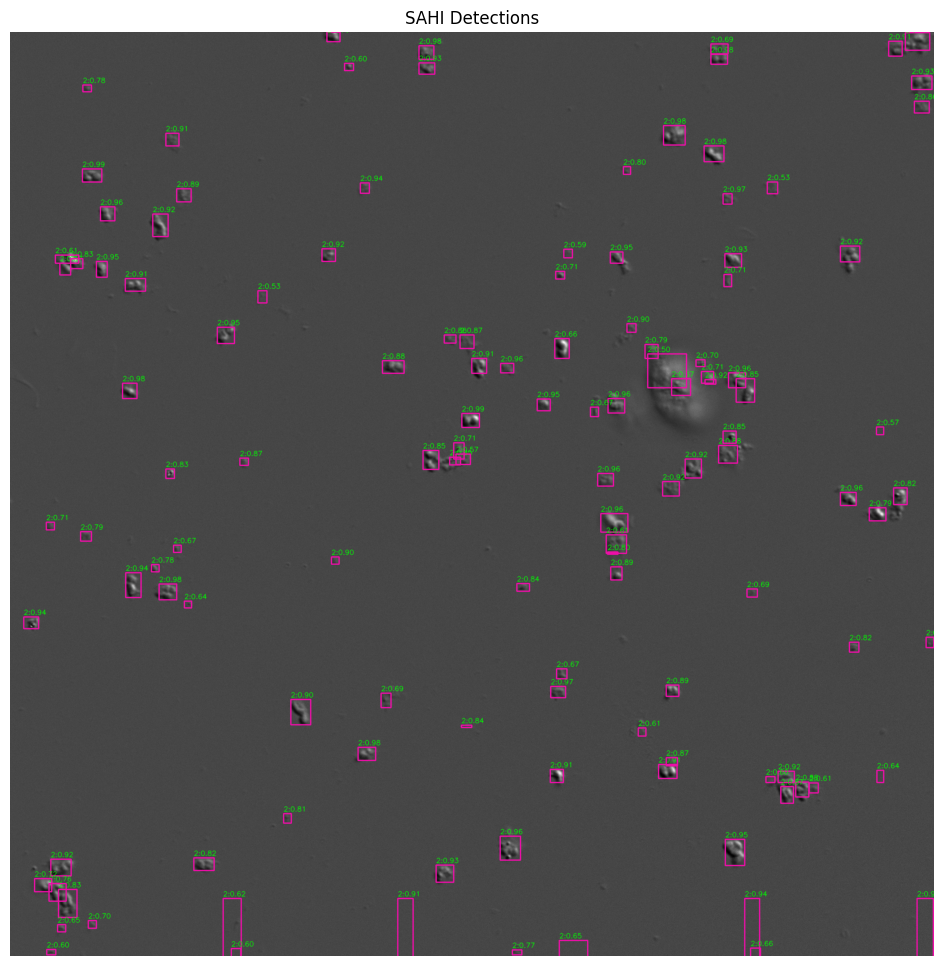

Saved predictions to /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_convnextv1_tiny_grayscale_agnostic_coco/output/predictions.json
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.08s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=300 ] = 0.247
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=300 ] = 0.061
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=300 ] = 0.220
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=300 ] = 0.097
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=300 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0

In [66]:
image_dir = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/val/"
pred_file = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_convnextv1_tiny_grayscale_agnostic_coco/output/predictions.json"
gt_file = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/val/val_anns.json"

save_coco_predictions(image_dir, pred_file)
evaluate_coco(gt_file, pred_file)

In [124]:
print(cfg.MODEL.PIXEL_MEAN)
print(cfg.MODEL.PIXEL_STD)

[114.495, 114.495, 114.495]
[57.63, 57.63, 57.63]


[07/07 14:09:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/resnet50_pretrained/output/model_final.pth ...
7
255
Number of detected instances: 0


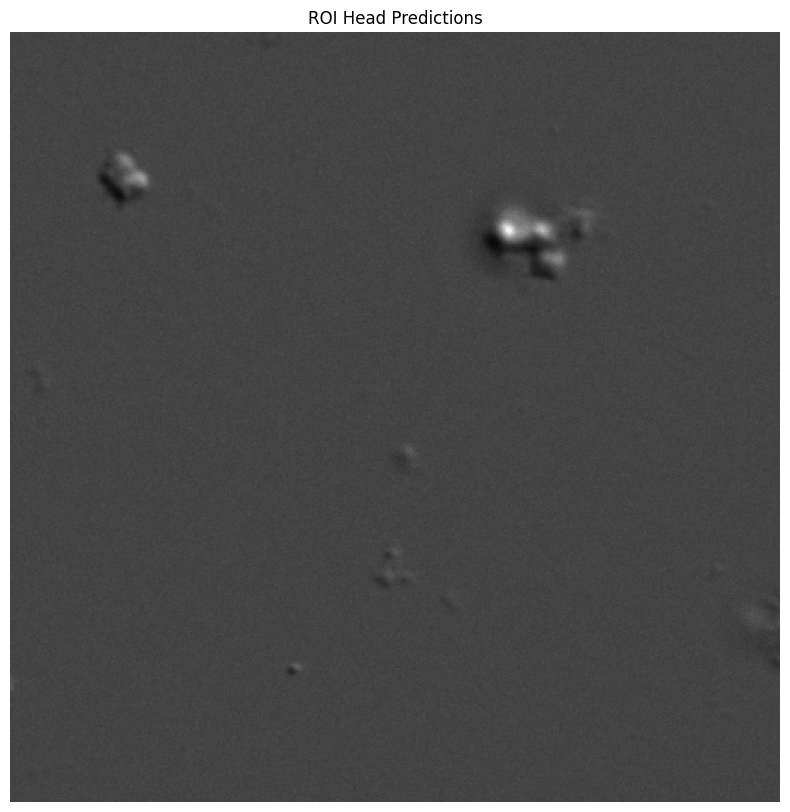

In [83]:
# non-SAHI - single training tiled image prediction

import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
from detectron2.modeling import build_model, build_backbone
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling.proposal_generator import build_proposal_generator

# -------------------------------
# CONFIG
# -------------------------------
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_ssl/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/convnextv2_custom_random_init/output/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.2

# predictor = DefaultPredictor(cfg)
predictor = GrayscalePredictor(cfg)

# -------------------------------
# LOAD IMAGE
# -------------------------------
image_path = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/train_tiled/F0000_C0_T0001_A0001_01-T5K2S375_0_0_0_512_512.png"
# im = cv2.imread(image_path, cv2.IMREAD_COLOR)
im = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
print(np.min(im))
print(np.max(im))

# -------------------------------
# ROI HEAD PREDICTIONS (final detections)
# -------------------------------
outputs = predictor(im)
instances = outputs["instances"].to("cpu")
print(f"Number of detected instances: {len(instances)}")

if len(im.shape) == 2:
    im = cv2.cvtColor(im, cv2.COLOR_GRAY2RGB)
    
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0, instance_mode=ColorMode.IMAGE)
out = v.draw_instance_predictions(instances)
plt.figure(figsize=(10,10))
plt.imshow(out.get_image()[:, :, ::-1])
plt.axis("off")
plt.title("ROI Head Predictions")
plt.show()

In [ ]:
# run this if get
#NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968
# Which can happen if training is manually interrupted
import locale
locale.getpreferredencoding = lambda: "UTF-8"

[03/18 22:28:15 d2.data.datasets.coco]: Loaded 1 images in COCO format from /Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/val_anns.json
Evaluation on image 1
File: /Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/F0002_C0_T0001_A0001_01-T5K2S375.png
(2048, 2048, 3)
cfg.DATASETS.TEST[0]: microscopy_val
Printing outputs...
Instances(num_instances=2, image_height=2048, image_width=2048, fields=[pred_boxes: Boxes(tensor([[1400.5889,  658.7582, 1560.7014,  820.8241],
        [1401.5649,  737.6580, 1560.8802,  901.7253]])), scores: tensor([0.5449, 0.4761]), pred_classes: tensor([2, 2]), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[Fal

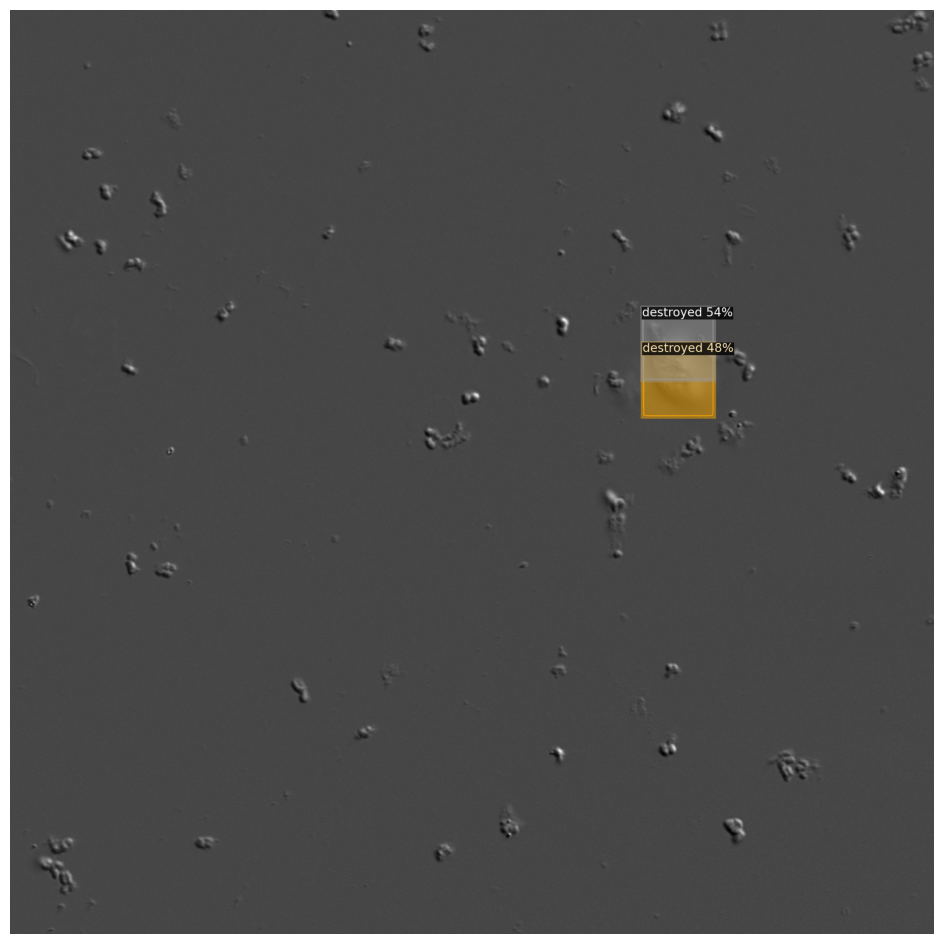

Image's original annotations


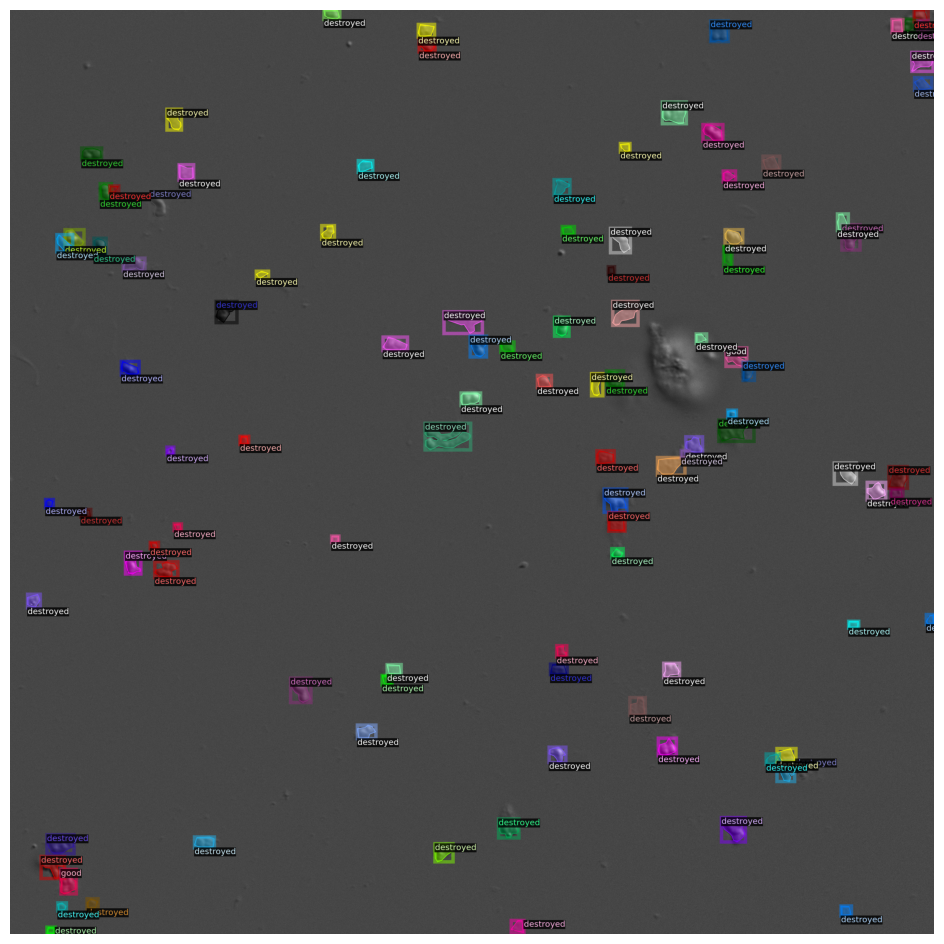

In [22]:
# perform basic evaluation
# should be in Detectron2 folder

from detectron2.data.datasets import load_coco_json

# cfg.DATASETS.TEST[0] refers to first listed dataset in cfg for testing.
# though not used here, possible to test with multiple datasets which would be merged later on

# untested, but expected behavior: displays n fields with AI generated masks
#eval_dicts = load_coco_json("microscopy/val/val_anns.json", "microscopy/val/", dataset_name = "microscopy_val")
#eval_dicts = load_coco_json("microscopy_great/val/val_anns.json", "microscopy_great/val/", dataset_name = "microscopy_val")
#eval_dicts = load_coco_json("microscopy_great/test/test_anns.json", "microscopy_great/test/", dataset_name = "microscopy_test")
#eval_dicts = load_coco_json("planes/val/planes_F21_F25.json", "planes/val/", dataset_name = "planes_val")
#eval_dicts = load_coco_json("airplanes/val/airplanes_F21_F25.json", "airplanes/val/", dataset_name = "airplanes_val")
#eval_dicts = load_coco_json("planes_BW/val/planes_BW_F21_F25.json", "planes_BW/val/", dataset_name = "planes_BW_val")
#eval_dicts = load_coco_json("microscopy_new/val/val_anns_F0045_F0049.json", "microscopy_new/val/", dataset_name = "microscopy_val")
#eval_dicts = load_coco_json("microscopy_100/val/val_anns_F0090_F0099.json", "microscopy_100/val/", dataset_name = "microscopy_val")
eval_dicts = load_coco_json("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/val_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/", dataset_name="microscopy_val")
dataset_num = 0
#dataset_num = 1 # use if selecting test dataset not val dataset and if specified accordingly in config
n = 1
count = 1
scale = 1.0 # before, 0.4

for d in random.sample(eval_dicts, n):
  print("Evaluation on image", count)
  filepath = d["file_name"]
  print("File:", filepath)
  im = cv2.imread(filepath)
  print(im.shape)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[dataset_num]), scale=scale)  # before, scale=1.2
  # apparently annotations from one loading of annotations onto v does not reset
  v_orig = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[dataset_num]), scale=scale)
  #delete later
  print("cfg.DATASETS.TEST[0]:", cfg.DATASETS.TEST[0])
  if outputs["instances"].to("cpu") != None:
    print("Printing outputs...")
    print(outputs["instances"].to("cpu"))
    print("before...")
    print("Number of detections:", len(outputs["instances"]))
    out_AI = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print("after...")
    # cv2_imshow(out_AI.get_image()[:, :, ::-1])
    plt.figure(figsize=(12,12))
    plt.imshow(out_AI.get_image()[:, :, ::-1])  # already 3-channel RGB
    plt.axis('off')
    plt.show()
  else:
    print("Error, should not be here.")
    print("No instances to display, so not printing.")

  print("Image's original annotations")
  # show labeled file for side by side comparison
  out_labeled = v_orig.draw_dataset_dict(d)
  # cv2_imshow(out_labeled.get_image()[:, :, ::-1])
  plt.figure(figsize=(12,12))
  plt.imshow(out_labeled.get_image()[:, :, ::-1])  # already 3-channel RGB
  plt.axis('off')
  plt.show()
  count += 1


In [53]:
# Compute AP - SAHI version, fixed - actually does not work

# Compute AP - SAHI version using your custom model
import os
from sahi import AutoDetectionModel
from sahi.predict import predict
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# 1. Define your category mapping (crucial for custom models)
# Map your model's internal integer outputs to the exact names in your dataset.
# Example: {0: "cell", 1: "nucleus"}
custom_category_mapping = {
    0: "great",
    1: "good",
    2: "destroyed"
}

# 2. Wrap your custom pre-initialized model object into SAHI
sahi_model = AutoDetectionModel.from_pretrained(
    model_type="detectron2",
    model=predictor.model,                               # Your custom loaded Detectron2 model instance
    category_mapping=custom_category_mapping,  # Aligns model outputs with COCO IDs
    confidence_threshold=cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST, # Filter out low-confidence background noise
    device='cpu'                               # Change to "cpu" if running without a GPU
)

# 3. Define paths
image_dir = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/val/"
gt_json_path = os.path.join(image_dir, "val_anns.json")
output_dir = "/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/"

# 4. Run batch sliced inference on the COCO dataset folder
predict_coco(
    detection_model=sahi_model,
    source=image_dir,
    dataset_json_path=gt_json_path,
    slice_height=512,
    slice_width=512,
    overlap_height_ratio=0.25,
    overlap_width_ratio=0.25,
    export_visual=False,
    project=output_dir,
    name="sahi_predictions"
)

# 5. Compute AP metrics using pycocotools
pred_json_path = os.path.join(output_dir, "sahi_predictions", "result.json")
coco_gt = COCO(gt_json_path)
coco_dt = coco_gt.loadRes(pred_json_path)
coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

NotImplementedError: 

In [43]:
# Compute AP - SAHI version - does not work, just use below on full image

from sahi.models.detectron2 import Detectron2DetectionModel
from sahi.utils.file import save_coco_predictions_as_json
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

save_coco_predictions_as_json(
    image_dir="/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/",        # folder with validation images
    detection_model=model,
    output_file="/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/dev/output/pred_val_anns.json", # SAHI will export COCO-format JSON
    slice_height=512,
    slice_width=512,
    overlap_height_ratio=0.25,
    overlap_width_ratio=0.25
)

coco_gt = COCO("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/val_anns.json")
coco_dt = coco_gt.loadRes("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/dev/output/pred_val_anns.json")
coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

ImportError: cannot import name 'save_coco_predictions_as_json' from 'sahi.utils.coco' (/Volumes/Ethan_UCLA_Harddrive/AI/detectron2-work/d2env/lib/python3.9/site-packages/sahi/utils/coco.py)

In [47]:
# compute AP
# also, see trainer.test as alternative to this cell
# modify for coco

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
# evaluator = COCOEvaluator("balloon_val", output_dir="./output")
#evaluator = COCOEvaluator("microscopy_val", output_dir="./output")
#evaluator = COCOEvaluator("microscopy_test", output_dir="./output")
#evaluator = COCOEvaluator("planes_val", output_dir="./output")
#evaluator = COCOEvaluator("airplanes_val", output_dir="./output")
#evaluator = COCOEvaluator("planes_BW_val", output_dir="./output")
evaluator = COCOEvaluator("microscopy_val", output_dir="/Volumes/Ethan_UCLA_Harddrive/AI/microscopy_overfit/dev/output/")
# val_loader = build_detection_test_loader(cfg, "balloon_val")
val_loader = build_detection_test_loader(cfg, "microscopy_val")
#val_loader = build_detection_test_loader(cfg, "microscopy_test")
#val_loader = build_detection_test_loader(cfg, "planes_val")
#val_loader = build_detection_test_loader(cfg, "airplanes_val") # change to build_test_loader() to call overridden funct (TO-DO)
#val_loader = build_detection_test_loader(cfg, "planes_BW_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[07/07 13:28:45 d2.data.datasets.coco]: Loaded 1 images in COCO format from /Users/ethancotta/Desktop/AI/microscopy_overfit/val/val_anns.json
[07/07 13:28:45 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(512, 512), max_size=512, sample_style='choice')]
[07/07 13:28:45 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/07 13:28:45 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[07/07 13:28:45 d2.data.common]: Serialized dataset takes 0.01 MiB
[07/07 13:28:45 d2.evaluation.evaluator]: Start inference on 1 batches
[07/07 13:28:45 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.4268 s/iter. Eval: 0.0000 s/iter. Total: 0.4268 s/iter. ETA=0:00:00
[07/07 13:28:45 d2.evaluation.evaluator]: Total inference time: 0:00:00.427590 (0.427590 s / iter per device, on 1 devices)
[07/07 13:28:45 d2.evaluat